In [1]:
library(Seurat)
library(ggplot2)
library(dplyr)
library(patchwork)
library(stringr)
library(ggplot2)

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following object is masked from ‘package:base’:

    intersect



Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [2]:
seurat_obj_ls <- 
    lapply(c('iso-F-04','iso-F-22','iso-F-35','iso-M-00','iso-M-23','iso-M-40','soc-F-05','soc-F-24','soc-F-36','soc-M-01','soc-M-25','soc-M-41'),
       function(x){
           cell.use <- read.csv(paste0("./samples/",x,".Rat.allCells.csv"))%>% 
            filter(pass=="True") %>%
            pull(X)
        Read10X(paste0("alignment/",x,".Rat/",x,".Rat.star.solo/GeneFull_Ex50pAS/raw/")) %>%
           CreateSeuratObject(project = "Rat", min.cells = 3, min.features = 200) %>%       
            subset(cells = cell.use)
           })

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with da

In [3]:
Seurat_merged <- merge(seurat_obj_ls[[1]],seurat_obj_ls[-1],project="Rat",
                       add.cell.ids =c('iso-F-04','iso-F-22','iso-F-35','iso-M-00','iso-M-23','iso-M-40','soc-F-05','soc-F-24','soc-F-36','soc-M-01','soc-M-25','soc-M-41'))

In [4]:
Seurat_merged

An object of class Seurat 
26597 features across 76385 samples within 1 assay 
Active assay: RNA (26597 features, 0 variable features)
 12 layers present: counts.1, counts.2, counts.3, counts.4, counts.5, counts.6, counts.7, counts.8, counts.9, counts.10, counts.11, counts.12

In [5]:
Seurat_merged[["RNA"]] <-JoinLayers(Seurat_merged[["RNA"]])

In [6]:
Seurat_merged

An object of class Seurat 
26597 features across 76385 samples within 1 assay 
Active assay: RNA (26597 features, 0 variable features)
 1 layer present: counts

## QC and Cell-level filtering

In [7]:
# The [[ operator can add columns to object metadata. This is a great place to stash QC stats
Seurat_merged[["percent.mt"]] <- PercentageFeatureSet(Seurat_merged, pattern = "^Mt-")

In [8]:
options(repr.plot.width = 10, repr.plot.height = 5, repr.plot.res = 300)

In [9]:
# Visualize QC metrics as a violin plot
p1 <- VlnPlot(Seurat_merged, features = c("nFeature_RNA", "nCount_RNA"), ncol = 3,layer='counts')

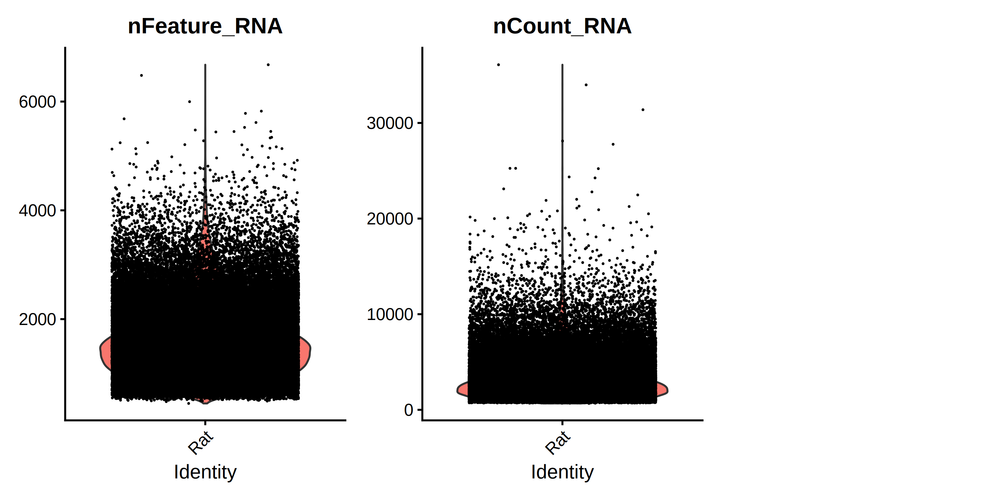

In [10]:
p1

In [11]:
obj <- subset(Seurat_merged, subset = nFeature_RNA > 200 & nFeature_RNA < 4000)

In [12]:
obj

An object of class Seurat 
26597 features across 76089 samples within 1 assay 
Active assay: RNA (26597 features, 0 variable features)
 1 layer present: counts

## Normalizing the data

In [13]:
obj <- SCTransform(obj, vst.flavor = 'v2', verbose = FALSE) 

In [14]:
obj <- obj %>%
    RunPCA(npcs = 30, verbose = FALSE,features = VariableFeatures(object = obj))

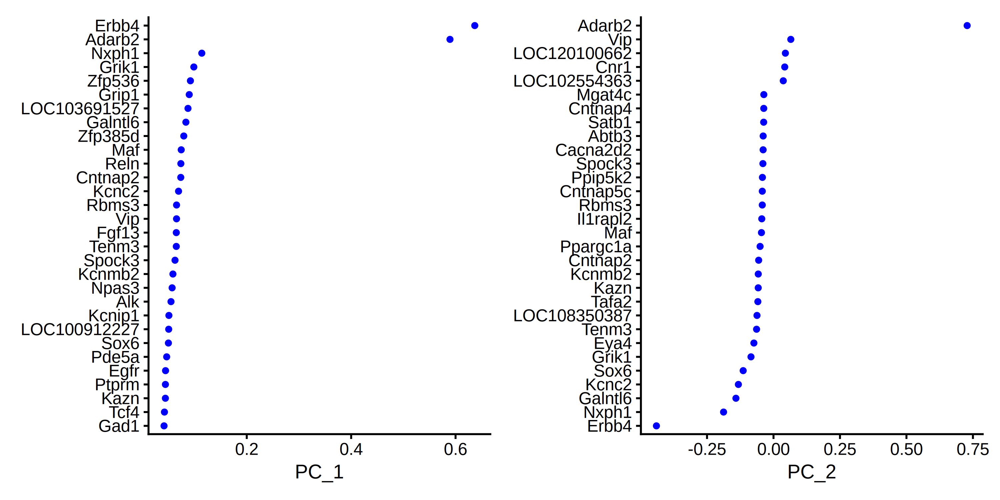

In [15]:
VizDimLoadings(obj, dims = 1:2, reduction = "pca")

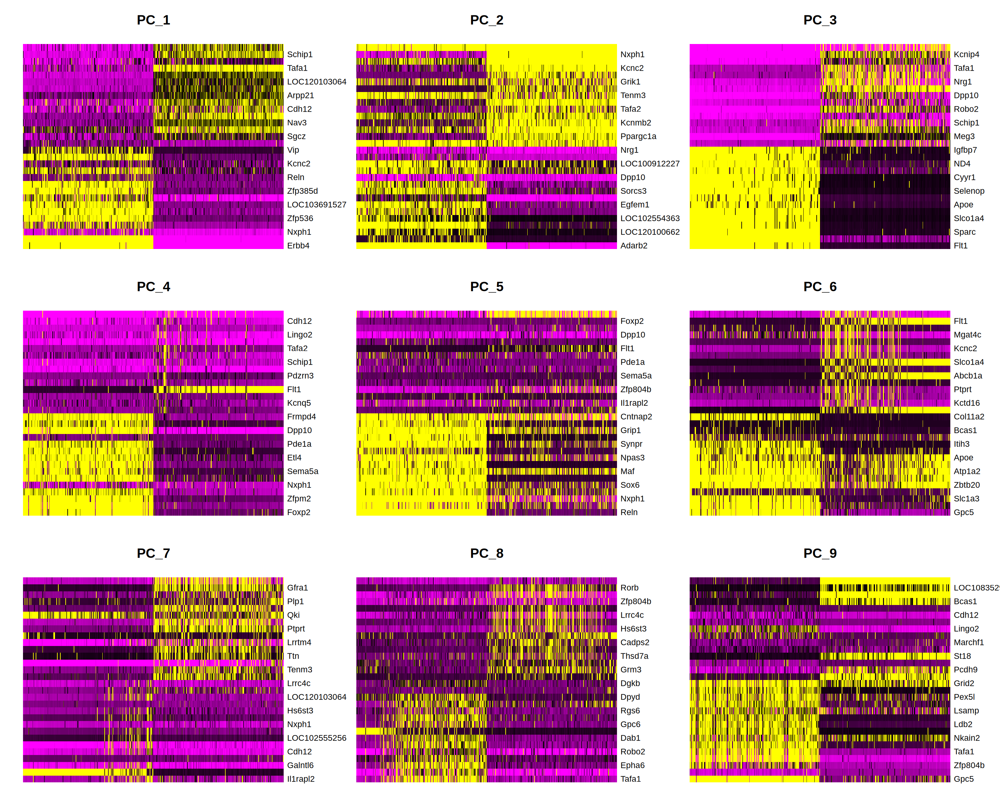

In [16]:
options(repr.plot.width = 10, repr.plot.height = 8, repr.plot.res = 300)
DimHeatmap(obj, dims = 1:9, cells = 500, balanced = TRUE)

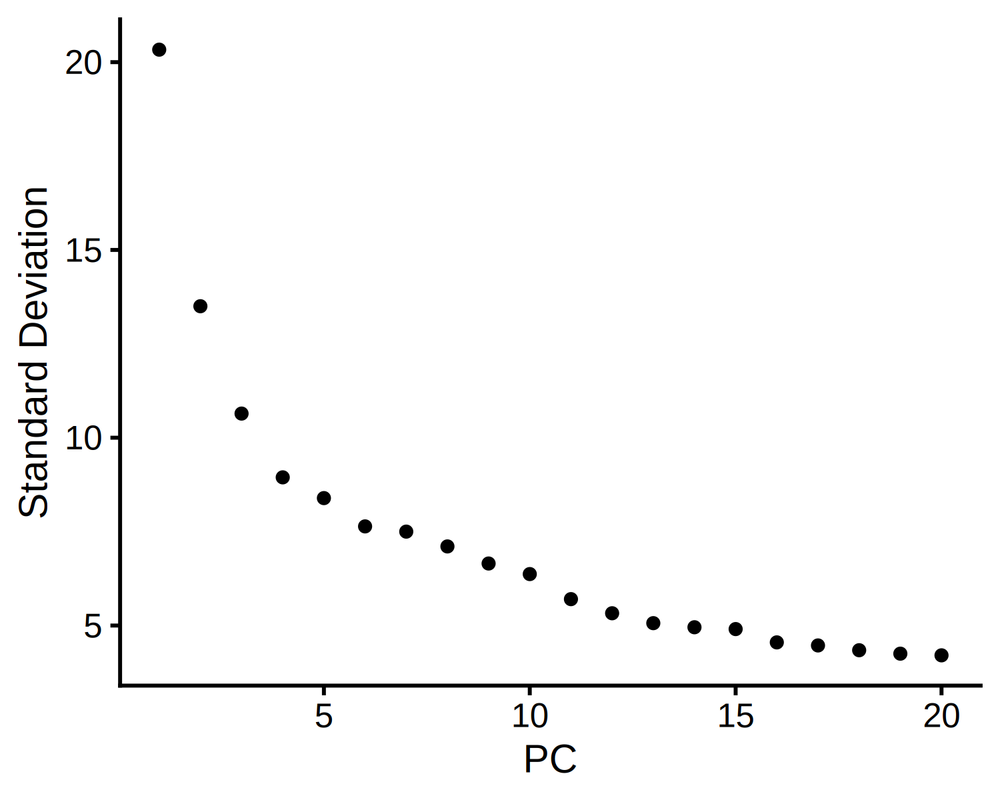

In [17]:
options(repr.plot.width = 5, repr.plot.height = 4, repr.plot.res = 300)
ElbowPlot(obj)

##  cell clustering 

In [18]:
obj

An object of class Seurat 
52115 features across 76089 samples within 2 assays 
Active assay: SCT (25518 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: RNA
 1 dimensional reduction calculated: pca

In [19]:
obj <- AddMetaData(
  object = obj,
  metadata = stringr::str_split(row.names(obj@meta.data),"-",simplify=T)[,1],
  col.name = 'group'
)

obj <- AddMetaData(
  object = obj,
  metadata = stringr::str_split(row.names(obj@meta.data),"-",simplify=T)[,2],
  col.name = 'sex'
)

In [20]:
head(obj@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,nCount_SCT,nFeature_SCT,group,sex
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<int>,<chr>,<chr>
iso-F-04_AAACCATAGACTATGCAATACCAGGCGCA,Rat,2892,1519,0,3229,1519,iso,F
iso-F-04_AAACCATAGACTATGCAATTCGGATTCGG,Rat,2971,1489,0,3287,1489,iso,F
iso-F-04_AAACCATAGGGTATGCTTGTCGGATTCGG,Rat,1996,1189,0,3028,1208,iso,F
iso-F-04_AAACCATAGTCCTACCAGTCTAACTAGGT,Rat,5871,2496,0,4299,2456,iso,F
iso-F-04_AAACCATAGTCCTACCAGTGTAGGATAAG,Rat,2068,1185,0,3104,1190,iso,F
iso-F-04_AAACCATAGTCGCGGTTGGTTGATACGAT,Rat,1922,1121,0,3064,1153,iso,F


In [21]:
obj <- obj %>%
        FindNeighbors(reduction = "pca", dims = 1:15, verbose = FALSE) %>%
        FindClusters(resolution = 0.7, verbose = FALSE) %>%
        RunUMAP(reduction = "pca", dims = 1:15, verbose = FALSE)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’



In [22]:
obj

An object of class Seurat 
52115 features across 76089 samples within 2 assays 
Active assay: SCT (25518 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

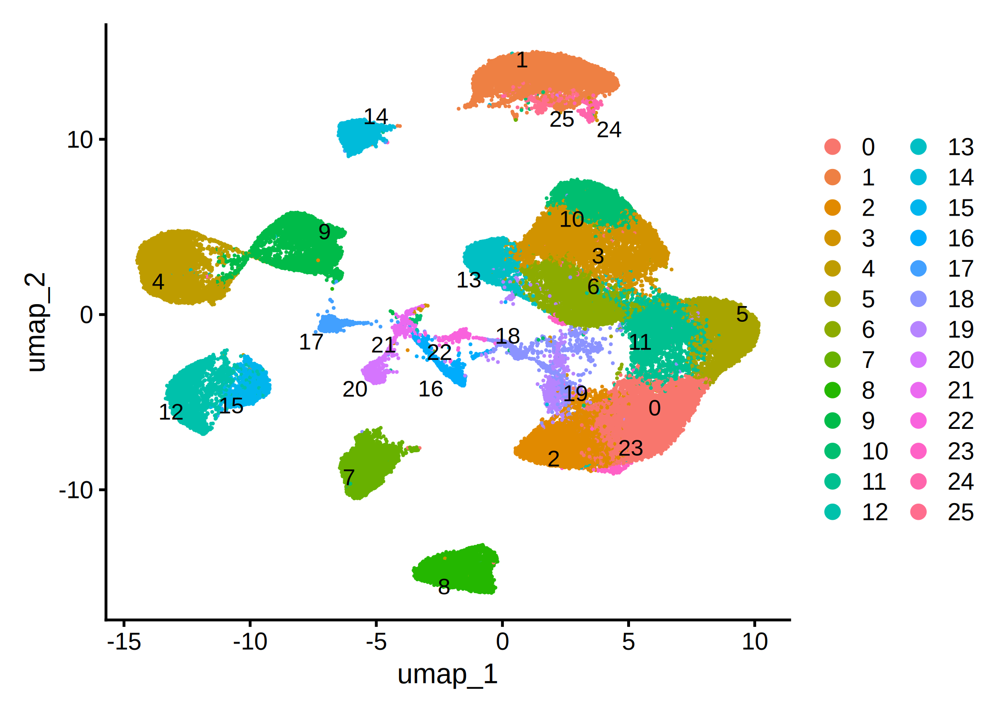

In [23]:
options(repr.plot.width = 7, repr.plot.height = 5, repr.plot.res = 300)
# note that you can set `label = TRUE` or use the LabelClusters function to help label
# individual clusters
DimPlot(obj, reduction = "umap",label = TRUE, repel = TRUE)

## define doublet

In [24]:
library('DoubletFinder')

homotypic.prop <- modelHomotypic(obj@meta.data$seurat_clusters)           ## ex: annotations <- seu_kidney@meta.data$ClusteringResults
nExp_poi <- round(0.075*nrow(obj@meta.data))  ## Assuming 7.5% doublet formation rate - tailor for your dataset
nExp_poi.adj <- round(nExp_poi*(1-homotypic.prop))

## Run DoubletFinder with varying classification stringencies ----------------------------------------------------------------
seu_obj <- doubletFinder(obj, PCs = 1:10, pN = 0.25, pK = 0.09, nExp = nExp_poi, reuse.pANN = FALSE, sct = TRUE)

Loading required package: fields

Loading required package: spam

Spam version 2.10-0 (2023-10-23) is loaded.
Type 'help( Spam)' or 'demo( spam)' for a short introduction 
and overview of this package.
Help for individual functions is also obtained by adding the
suffix '.spam' to the function name, e.g. 'help( chol.spam)'.


Attaching package: ‘spam’


The following objects are masked from ‘package:base’:

    backsolve, forwardsolve


Loading required package: viridisLite


Try help(fields) to get started.

Loading required package: KernSmooth

KernSmooth 2.23 loaded
Copyright M. P. Wand 1997-2009



[1] "Creating 25363 artificial doublets..."


Loading required package: sctransform



[1] "Creating Seurat object..."
[1] "Running SCTransform..."


Running SCTransform on assay: RNA

Running SCTransform on layer: counts

vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

Variance stabilizing transformation of count matrix of size 26131 by 101452

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells

Found 15 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 26131 genes

Computing corrected count matrix for 26131 genes

Calculating gene attributes

Wall clock passed: Time difference of 8.646123 mins

Determine variable features

Centering data matrix

Getting residuals for block 1(of 21) for counts dataset

Getting residuals for block 2(of 21) for counts dataset

Getting residuals for block 3(of 21) for counts dataset

Getting residuals for block 4(of 21) for counts dataset

Getting residuals for block 5(of 21) for counts dataset

Getting residuals for block 6(of 21) for cou

[1] "Running PCA..."


PC_ 1 
Positive:  Erbb4, Adarb2, Nxph1, Grip1, Galntl6, Grik1, Cntnap2, Kcnc2, Zfp536, LOC103691527 
	   Maf, Tenm3, Zfp385d, Reln, Rbms3, Spock3, Npas3, Fgf13, Vip, Kcnmb2 
	   Tcf4, Kazn, Sox6, Alk, Ptprm, Kcnip1, Grik2, LOC100912227, Pde5a, Egfr 
Negative:  Nrg1, Dpp10, Schip1, Celf2, Tafa1, LOC120103064, Phactr1, Arpp21, Nav3, Cdh12 
	   Lingo2, Homer1, Ralyl, Sgcz, Car10, Kcnh7, Kcnip4, Hs3st4, Nlgn1, R3hdm1 
	   Grm7, LOC120100931, Cnksr2, Cacna2d1, Pcdh9, Slit3, Ncam2, Pde1a, Cntnap5b, Nkain2 
PC_ 2 
Positive:  Erbb4, Nxph1, Galntl6, Kcnc2, Sox6, Grik1, Tenm3, Tafa2, Eya4, Ppargc1a 
	   LOC108350387, Kazn, Cntnap2, Il1rapl2, Mgat4c, Kcnmb2, Cntnap5c, Ppip5k2, Satb1, Cntnap4 
	   Maf, Klf12, Rbms3, Cacna2d2, Ptprm, Spock3, Dock4, Sash1, Esrrg, Ptchd4 
Negative:  Adarb2, Vip, Egfem1, Trpm3, Fgf13, Cnr1, Lingo2, Nrxn1, Sorcs3, LOC120100662 
	   Kcnq5, Npas3, Dpp10, Grid2, Csmd3, LOC102554363, LOC100912227, Lrrtm4, Tafa1, Egfr 
	   Nrg1, Sorcs1, Kctd16, Slc2a13, Robo1, Nfib, Pde11a,

[1] "Calculating PC distance matrix..."
[1] "Computing pANN..."
[1] "Classifying doublets.."


In [25]:
head(seu_obj@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,nCount_SCT,nFeature_SCT,group,sex,SCT_snn_res.0.7,seurat_clusters,pANN_0.25_0.09_5707,DF.classifications_0.25_0.09_5707
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<int>,<chr>,<chr>,<fct>,<fct>,<dbl>,<chr>
iso-F-04_AAACCATAGACTATGCAATACCAGGCGCA,Rat,2892,1519,0,3229,1519,iso,F,9,9,0.3220896,Singlet
iso-F-04_AAACCATAGACTATGCAATTCGGATTCGG,Rat,2971,1489,0,3287,1489,iso,F,10,10,0.2795970,Singlet
iso-F-04_AAACCATAGGGTATGCTTGTCGGATTCGG,Rat,1996,1189,0,3028,1208,iso,F,9,9,0.3189136,Singlet
iso-F-04_AAACCATAGTCCTACCAGTCTAACTAGGT,Rat,5871,2496,0,4299,2456,iso,F,14,14,0.2988720,Singlet
iso-F-04_AAACCATAGTCCTACCAGTGTAGGATAAG,Rat,2068,1185,0,3104,1190,iso,F,5,5,0.1328442,Singlet
iso-F-04_AAACCATAGTCGCGGTTGGTTGATACGAT,Rat,1922,1121,0,3064,1153,iso,F,9,9,0.3220896,Singlet


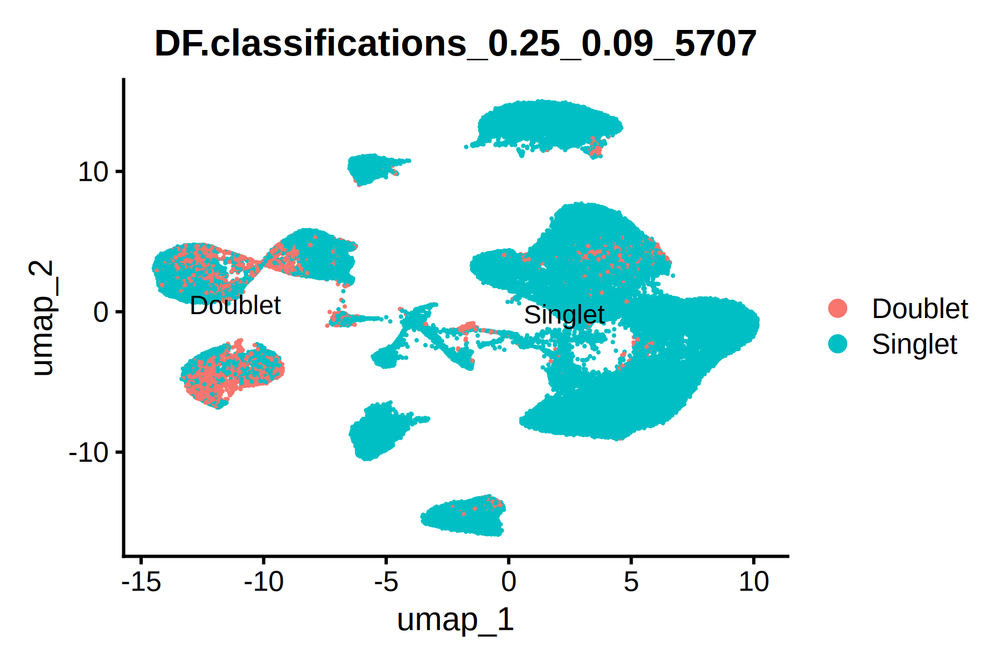

In [27]:
options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 300)
# note that you can set `label = TRUE` or use the LabelClusters function to help label
# individual clusters
DimPlot(seu_obj, reduction = "umap",label = TRUE, group.by = "DF.classifications_0.25_0.09_5707")

In [30]:
seu_obj <- subset(x = seu_obj, subset = DF.classifications_0.25_0.09_5707=="Singlet")

In [31]:
seu_obj

An object of class Seurat 
52115 features across 70382 samples within 2 assays 
Active assay: SCT (25518 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

### reclustering on the filtered cells

In [32]:
seu_obj <- seu_obj %>%
        FindNeighbors(reduction = "pca", dims = 1:15, verbose = FALSE) %>%
        FindClusters(resolution = 0.7, verbose = FALSE) %>%
        RunUMAP(reduction = "pca", dims = 1:15, verbose = FALSE)

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’



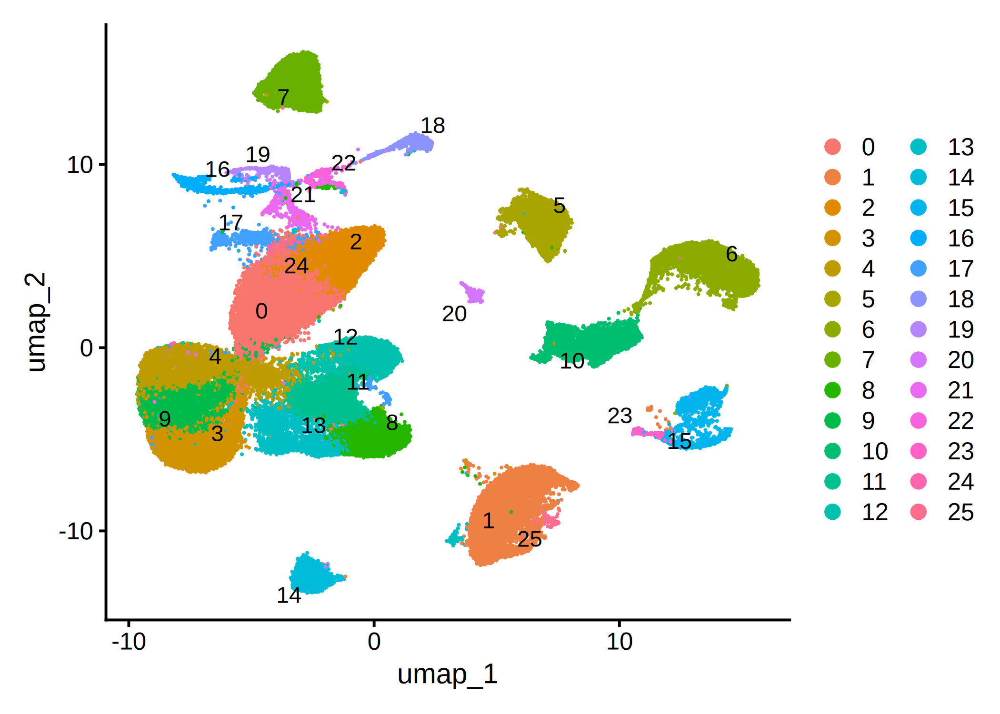

In [33]:
options(repr.plot.width = 7, repr.plot.height = 5, repr.plot.res = 300)
# note that you can set `label = TRUE` or use the LabelClusters function to help label
# individual clusters
DimPlot(seu_obj, reduction = "umap",label = TRUE, repel = TRUE)

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’



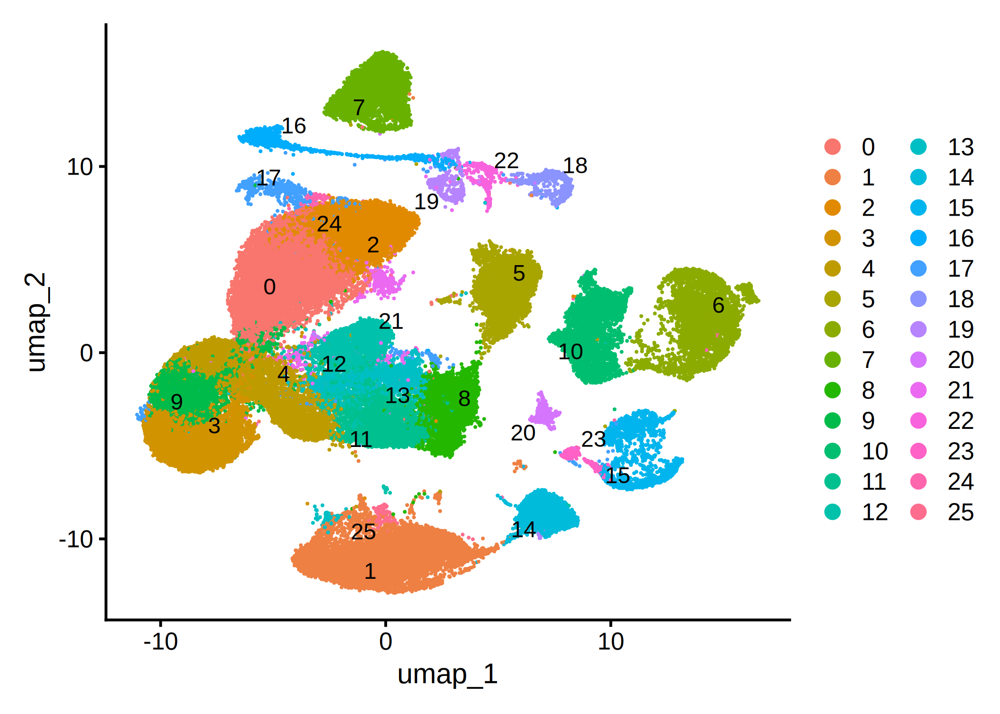

In [34]:
options(repr.plot.width = 7, repr.plot.height = 5, repr.plot.res = 300)
# note that you can set `label = TRUE` or use the LabelClusters function to help label
# individual clusters
seu_obj %>%
RunUMAP(reduction = "pca", dims = 1:15, n.neighbors = 10L,min.dist = 0.4, verbose = FALSE) %>%
DimPlot(reduction = "umap",label = TRUE, repel = TRUE)

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’



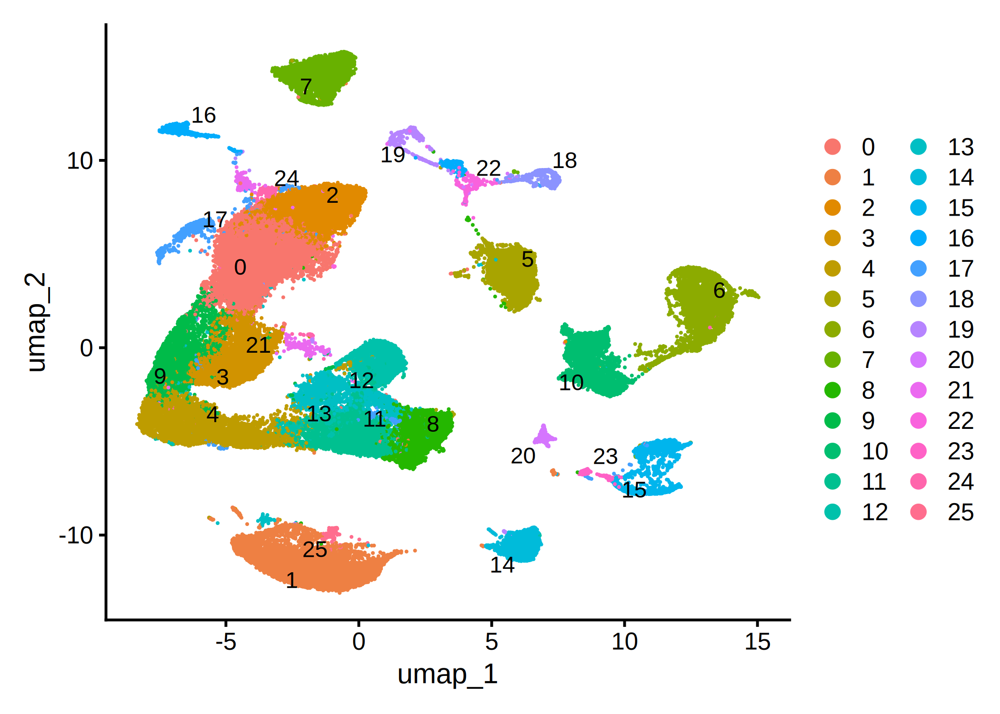

In [35]:
options(repr.plot.width = 7, repr.plot.height = 5, repr.plot.res = 300)
# note that you can set `label = TRUE` or use the LabelClusters function to help label
# individual clusters
seu_obj %>%
RunUMAP(reduction = "pca", dims = 1:15, n.neighbors = 10L,min.dist = 0.2, verbose = FALSE) %>%
DimPlot(reduction = "umap",label = TRUE, repel = TRUE)

In [36]:
library(dplyr)
library(stringr)

In [37]:
head(seu_obj@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,nCount_SCT,nFeature_SCT,group,sex,SCT_snn_res.0.7,seurat_clusters,pANN_0.25_0.09_5707,DF.classifications_0.25_0.09_5707
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<int>,<chr>,<chr>,<fct>,<fct>,<dbl>,<chr>
iso-F-04_AAACCATAGACTATGCAATACCAGGCGCA,Rat,2892,1519,0,3229,1519,iso,F,10,10,0.3220896,Singlet
iso-F-04_AAACCATAGACTATGCAATTCGGATTCGG,Rat,2971,1489,0,3287,1489,iso,F,8,8,0.2795970,Singlet
iso-F-04_AAACCATAGGGTATGCTTGTCGGATTCGG,Rat,1996,1189,0,3028,1208,iso,F,10,10,0.3189136,Singlet
iso-F-04_AAACCATAGTCCTACCAGTCTAACTAGGT,Rat,5871,2496,0,4299,2456,iso,F,14,14,0.2988720,Singlet
iso-F-04_AAACCATAGTCCTACCAGTGTAGGATAAG,Rat,2068,1185,0,3104,1190,iso,F,3,3,0.1328442,Singlet
iso-F-04_AAACCATAGTCGCGGTTGGTTGATACGAT,Rat,1922,1121,0,3064,1153,iso,F,10,10,0.3220896,Singlet


In [39]:
seu_obj@meta.data$sampleID <- str_split(row.names(seu_obj@meta.data),"_",simplify = T)[,1]
seu_obj@meta.data <- 
    seu_obj@meta.data %>%
    mutate(sample_name = case_when(sampleID == "iso-F-04" ~ "iso-F_1",
                                   sampleID == "iso-F-22" ~ "iso-F_2",
                                   sampleID == "iso-F-35" ~ "iso-F_3",
                                   sampleID == "iso-M-00" ~ "iso-M_1",
                                   sampleID == "iso-M-23" ~ "iso-M_2",
                                   sampleID == "iso-M-40" ~ "iso-M_3",
                                   sampleID == "soc-F-05" ~ "soc-F_1",
                                   sampleID == "soc-F-24" ~ "soc-F_2",
                                   sampleID == "soc-F-36" ~ "soc-F_3",
                                   sampleID == "soc-M-01" ~ "soc-M_1",
                                   sampleID == "soc-M-25" ~ "soc-M_2",
                                   sampleID == "soc-M-41" ~ "soc-M_3"
                                  ))


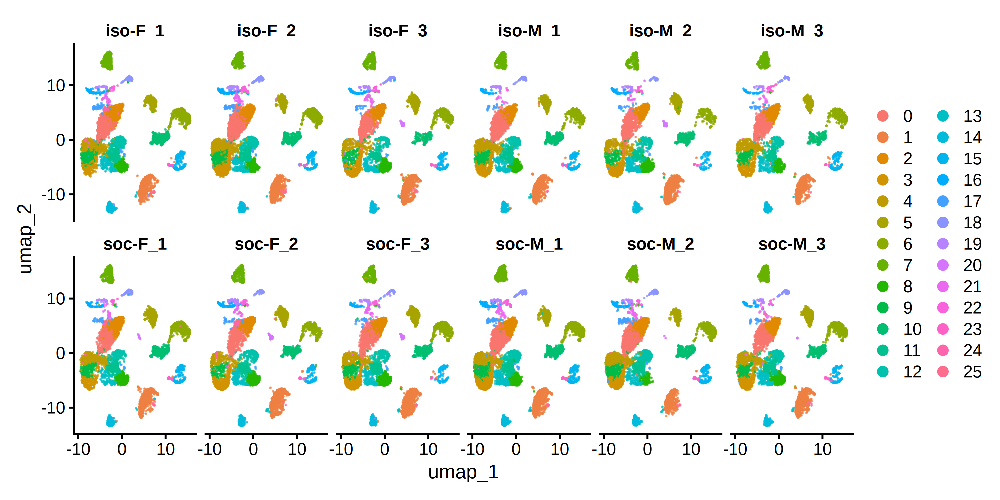

In [40]:
options(repr.plot.width = 10, repr.plot.height = 5, repr.plot.res = 300)
DimPlot(seu_obj, reduction = "umap", split.by = "sample_name",alpha=0.7,ncol=6)

In [41]:
saveRDS(seu_obj,file="/project/zhuzhuzhang/lyang/scaleBio_RNA_rat_brain/out_mRatBN/merged_seurat_obj_DF_removed_2.rds")

In [2]:
seu_obj <- readRDS(file="/project/zhuzhuzhang/lyang/scaleBio_RNA_rat_brain/out_mRatBN/merged_seurat_obj_DF_removed_2.rds")

In [3]:
head(seu_obj@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,nCount_SCT,nFeature_SCT,group,sex,SCT_snn_res.0.7,seurat_clusters,pANN_0.25_0.09_5707,DF.classifications_0.25_0.09_5707,sampleID,sample_name
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<int>,<chr>,<chr>,<fct>,<fct>,<dbl>,<chr>,<chr>,<chr>
iso-F-04_AAACCATAGACTATGCAATACCAGGCGCA,Rat,2892,1519,0,3229,1519,iso,F,10,10,0.3220896,Singlet,iso-F-04,iso-F_1
iso-F-04_AAACCATAGACTATGCAATTCGGATTCGG,Rat,2971,1489,0,3287,1489,iso,F,8,8,0.2795970,Singlet,iso-F-04,iso-F_1
iso-F-04_AAACCATAGGGTATGCTTGTCGGATTCGG,Rat,1996,1189,0,3028,1208,iso,F,10,10,0.3189136,Singlet,iso-F-04,iso-F_1
iso-F-04_AAACCATAGTCCTACCAGTCTAACTAGGT,Rat,5871,2496,0,4299,2456,iso,F,14,14,0.2988720,Singlet,iso-F-04,iso-F_1
iso-F-04_AAACCATAGTCCTACCAGTGTAGGATAAG,Rat,2068,1185,0,3104,1190,iso,F,3,3,0.1328442,Singlet,iso-F-04,iso-F_1
iso-F-04_AAACCATAGTCGCGGTTGGTTGATACGAT,Rat,1922,1121,0,3064,1153,iso,F,10,10,0.3220896,Singlet,iso-F-04,iso-F_1


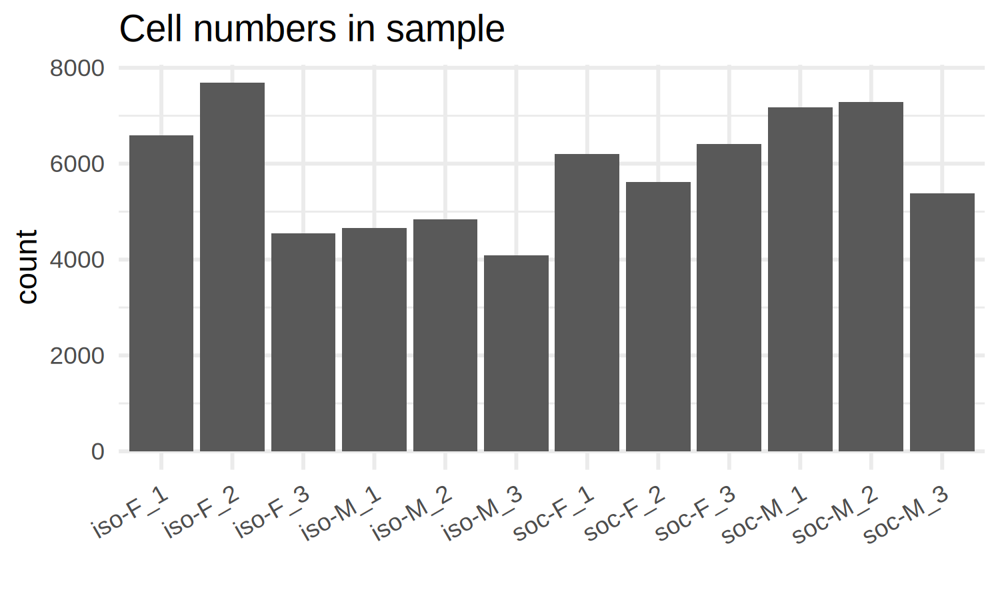

In [18]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 300)
seu_obj@meta.data %>%
    ggplot(aes(x=sample_name))+
    geom_bar(stat="count")+
    theme_minimal()+
    ggtitle("Cell numbers in sample")+
    theme(axis.text.x = element_text(angle=30,vjust=1,hjust=1))+
    labs(x="")

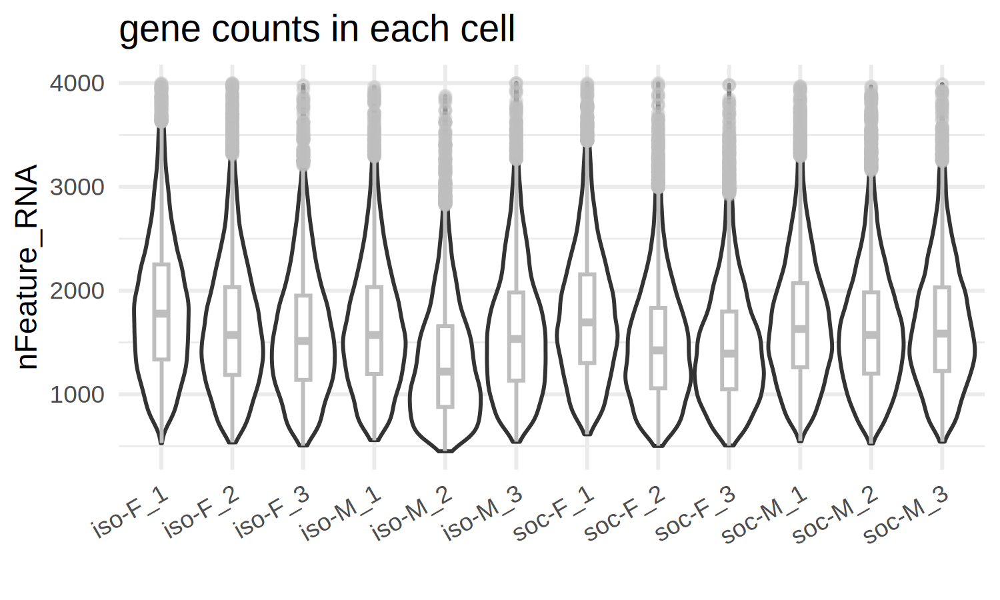

In [5]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 300)
seu_obj@meta.data %>%
    ggplot(aes(x=sample_name,y=nFeature_RNA))+
    geom_violin(width=1,position = position_dodge(0.9)) +
    geom_boxplot(width=0.2, color="grey", alpha=0.4,position = position_dodge(0.9))+
    theme_minimal()+
    ggtitle("gene counts in each cell")+
    theme(axis.text.x = element_text(angle=30,vjust=1,hjust=1))+
    labs(x="")

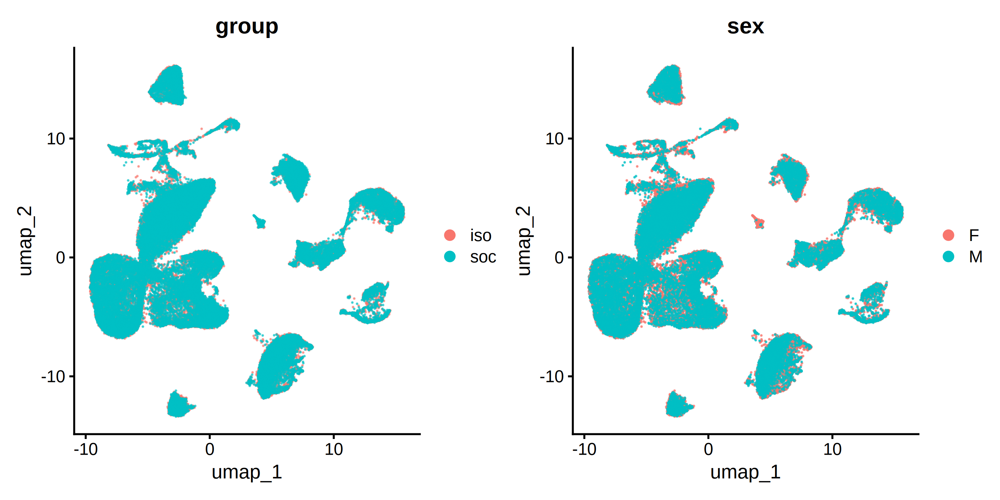

In [5]:
options(repr.plot.width = 10, repr.plot.height = 5, repr.plot.res = 300)
p1 <- DimPlot(seu_obj, reduction = "umap", group.by = "group",alpha=0.6)
p2 <- DimPlot(seu_obj, reduction = "umap", group.by = "sex",alpha=0.7)
p1+p2

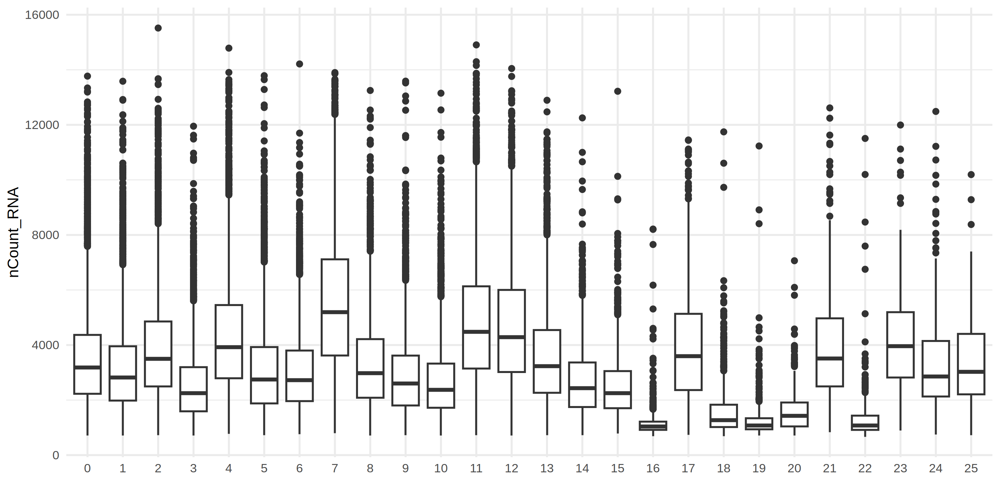

In [6]:
seu_obj@meta.data %>%
    ggplot(aes(x=seurat_clusters,y=nCount_RNA))+
    geom_boxplot()+
    theme_minimal()+
    scale_x_discrete(name="")

## Finding DEFs

In [7]:
getwd()

[1] "/project/zhuzhuzhang/lyang/scaleBio_RNA_rat_brain/out_mRatBN"

In [8]:
obj.markers <- FindAllMarkers(seu_obj,only.pos=TRUE)
obj.markers %>%
    group_by(cluster) %>%
    dplyr::filter(avg_log2FC > 1) %>%
    slice_head(n = 10) %>%
    ungroup() -> top10

top10 %>%
    write.table(file="./obj_cell_markers_fc1_top10_2.csv",row.names=F,quote=F)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17

Calculating cluster 18

Calculating cluster 19

Calculating cluster 20

Calculating cluster 21

Calculating cluster 22

Calculating cluster 23

Calculating cluster 24

Calculating cluster 25



In [9]:
library(RColorBrewer)

In [10]:
sel.gene <- c( 'Slc17a7', 'Lingo1', 'Sv2b', 'Neurod6', 'Kcnma1', ## pan-Exc
                'Prex1', 'Cux2','Rnf144a','Enpp2','Zfp462', ## IT-L23
                'Foxo3', 'Rorb','Kcnh5','Tspan11','Cadps2', ## IT-L4
                'Ptgfrn', 'Pip4k2a', 'Susd5','Opn3','Sulf2', ## IT-L5
                'Xkr7', 'Mgat5','Susd4','Adamts3','Npas2', ## IT-L6
                'Tcerg1l', 'Khdrbs2', 'Ralgapa2','L3mbtl4','Vat1l',## ET-L5
                'Tle4', 'Syt6', 'Arhgap25', 'Rnf152', 'Kcnk3', ## CT-L6
                 'Galnt10', 'Hipk2', 'Kcnab1', 'Dlg5', 'Gng12', ## L6b
                'Gad1', 'Gad2', 'Abat', 'Slc6a1', 'Stat5b', ## Pan-Inh
                'Pvalb', 'Man1c1', 'Cemip',## MGE-Pvalb
                'Sst', 'Grin3a','Grik3', ## MGE-Sst
                'Vip', 'Vav2','Npas3', ## CGE-Vip
                'Lamp5', 'Pip5k1b', 'Fgf13',## CGE-Lamp5
                'Slc1a2', 'Trim9', 'Paqr8', 'Cpe', 'Slc1a3', ## ASC
                'Mobp', 'Mbp', 'Mog', 'Pde4b', 'Klh12', ## ODC
                'Pdgfra', 'Xylt1', 'Chst11', 'Cacng4', 'Tnr', ## OPC
                'Csf1r', 'P2ry13', 'Fcrls', 'Zfp710', 'Laptm5' ## MGC
                )

Warning message:
“‘timedatectl’ indicates the non-existent timezone name ‘n/a’”
unable to deduce timezone name from ‘America/Chicago’

Warning message:
“The following features were omitted as they were not found:
ℹ Klh12 and Fcrls”


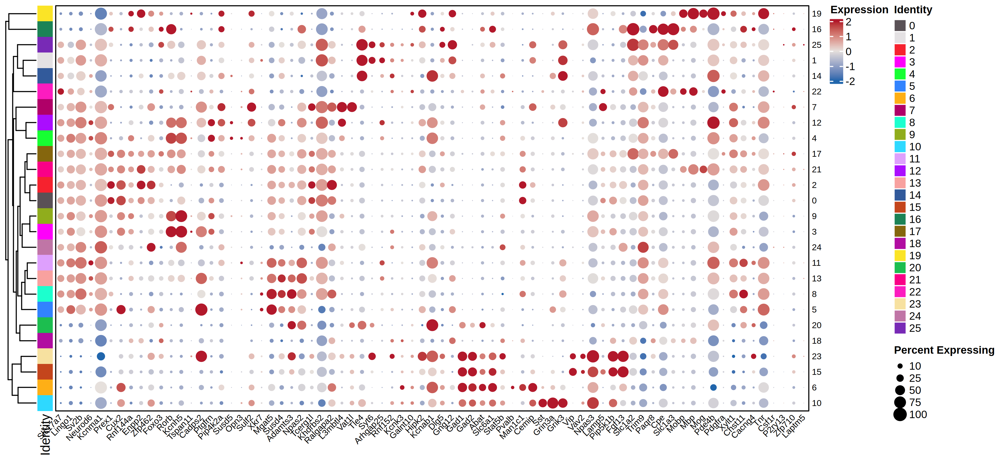

In [11]:
options(repr.plot.width = 13, repr.plot.height = 6, repr.plot.res = 300)
scCustomize::Clustered_DotPlot(seu_obj, features = unique(sel.gene),
                               plot_km_elbow = FALSE, flip = TRUE,cluster_feature = FALSE,
                               colors_use_exp=rev(colorRampPalette(brewer.pal(8, "RdBu"))(250)))

In [12]:
head(seu_obj@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,nCount_SCT,nFeature_SCT,group,sex,SCT_snn_res.0.7,seurat_clusters,pANN_0.25_0.09_5707,DF.classifications_0.25_0.09_5707,sampleID,sample_name
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<int>,<chr>,<chr>,<fct>,<fct>,<dbl>,<chr>,<chr>,<chr>
iso-F-04_AAACCATAGACTATGCAATACCAGGCGCA,Rat,2892,1519,0,3229,1519,iso,F,10,10,0.3220896,Singlet,iso-F-04,iso-F_1
iso-F-04_AAACCATAGACTATGCAATTCGGATTCGG,Rat,2971,1489,0,3287,1489,iso,F,8,8,0.2795970,Singlet,iso-F-04,iso-F_1
iso-F-04_AAACCATAGGGTATGCTTGTCGGATTCGG,Rat,1996,1189,0,3028,1208,iso,F,10,10,0.3189136,Singlet,iso-F-04,iso-F_1
iso-F-04_AAACCATAGTCCTACCAGTCTAACTAGGT,Rat,5871,2496,0,4299,2456,iso,F,14,14,0.2988720,Singlet,iso-F-04,iso-F_1
iso-F-04_AAACCATAGTCCTACCAGTGTAGGATAAG,Rat,2068,1185,0,3104,1190,iso,F,3,3,0.1328442,Singlet,iso-F-04,iso-F_1
iso-F-04_AAACCATAGTCGCGGTTGGTTGATACGAT,Rat,1922,1121,0,3064,1153,iso,F,10,10,0.3220896,Singlet,iso-F-04,iso-F_1


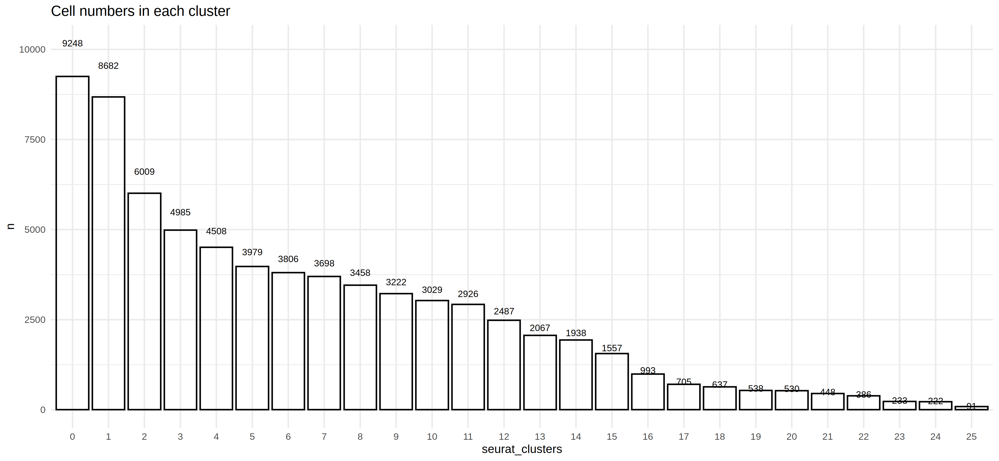

In [13]:
options(repr.plot.width = 13, repr.plot.height = 6, repr.plot.res = 300)
seu_obj@meta.data %>%
  group_by(seurat_clusters) %>%
  count() %>%
  ggplot(aes(x=seurat_clusters,y=n)) +
  geom_col(fill=NA,color='black') +
    geom_text(aes(label = n),
              position = position_stack(vjust = 1.1),size=3)+
    theme_minimal()+
  ggtitle("Cell numbers in each cluster")

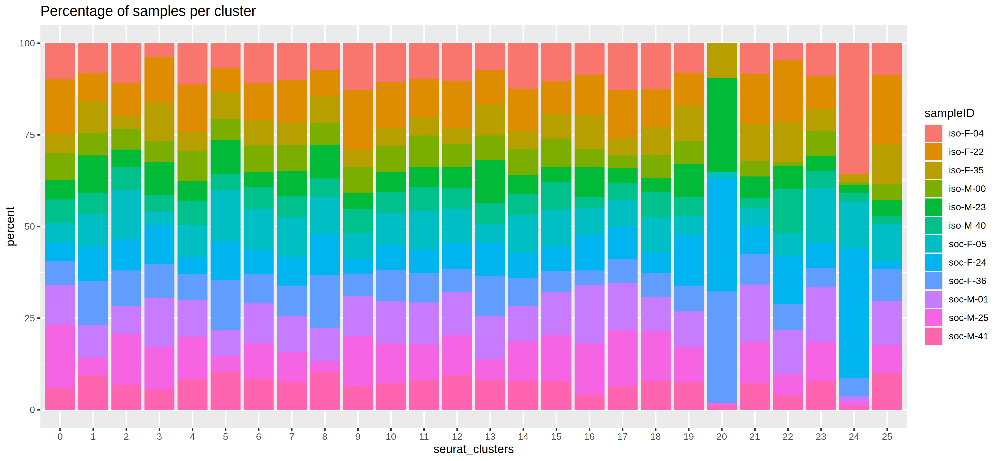

In [14]:
seu_obj@meta.data %>%
  group_by(seurat_clusters,sampleID) %>%
  count() %>%
  group_by(seurat_clusters) %>%
  mutate(percent=100*n/sum(n)) %>%
  ungroup() %>%
  ggplot(aes(x=seurat_clusters,y=percent, fill=sampleID)) +
  geom_col() +
  ggtitle("Percentage of samples per cluster")

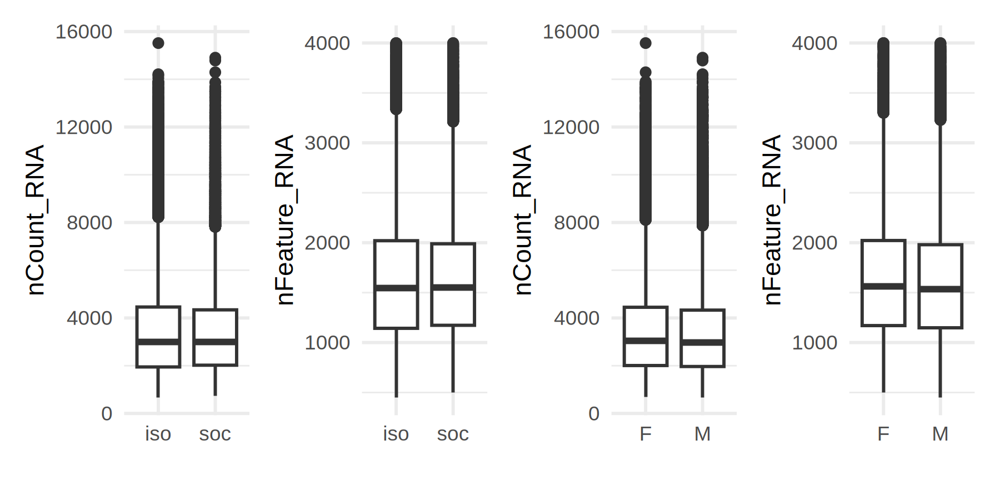

In [15]:
options(repr.plot.width = 6, repr.plot.height = 3, repr.plot.res = 300)
p1 <- seu_obj@meta.data %>%
    ggplot(aes(x=group,y=nCount_RNA))+
    geom_boxplot()+
    theme_minimal()+
    scale_x_discrete(name="")

p2 <- seu_obj@meta.data %>%
    ggplot(aes(x=group,y=nFeature_RNA))+
    geom_boxplot()+
    theme_minimal()+
    scale_x_discrete(name="")
p3 <- seu_obj@meta.data %>%
    ggplot(aes(x=sex,y=nCount_RNA))+
    geom_boxplot()+
    theme_minimal()+
    scale_x_discrete(name="")

p4 <- seu_obj@meta.data %>%
    ggplot(aes(x=sex,y=nFeature_RNA))+
    geom_boxplot()+
    theme_minimal()+
    scale_x_discrete(name="")

p1|p2|p3|p4


In [16]:
make_scatterplot <- 
function(Sobject,gene){
    library(patchwork)
    if(gene %in% row.names(Sobject@assays$SCT$scale.data)){
        expr_vec <- unlist(Sobject@assays$SCT$scale.data[gene,])
        boxplot_df <- data.frame(expr=expr_vec,
                                cluster=Sobject@meta.data$seurat_clusters)
        p1 <- 
            FeaturePlot(Sobject, features = gene)

        p2 <- ggplot(boxplot_df,aes(x=cluster,y=expr))+
            geom_boxplot(outlier.color = NA,width=0.5)+
            theme_minimal()+
            theme(axis.text.x = element_text(size=6,angle=60),
                axis.text.y = element_text(size=6))
        options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 300)
        p1 + p2 + 
          plot_layout( heights = c(2, 1))
    }
}

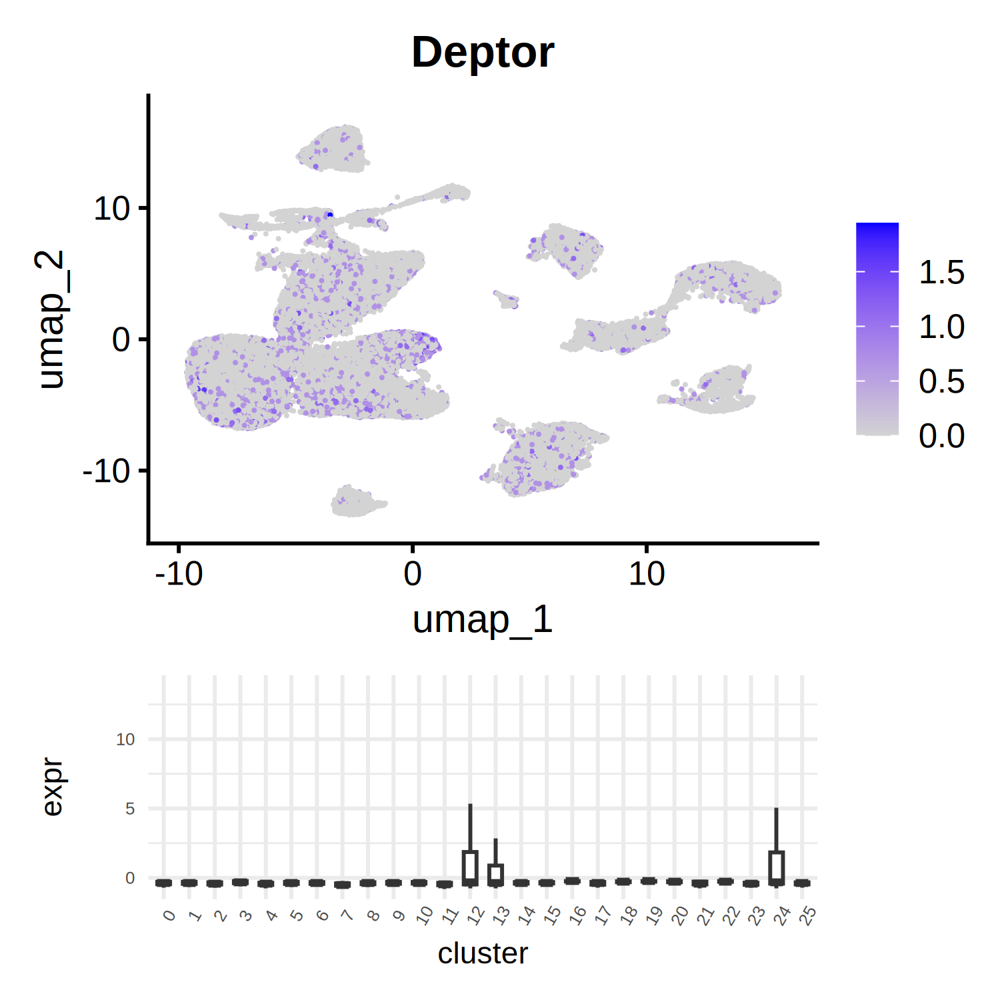

In [17]:
make_scatterplot(seu_obj,"Deptor")

In [18]:
make_scatterplot(seu_obj,"Pvalb")

In [19]:
getwd()

[1] "/project/zhuzhuzhang/lyang/scaleBio_RNA_rat_brain/out_mRatBN"

In [20]:
## make plot highlighting each cluster
pdf("./cluster_highlight_plot_2.pdf", onefile = TRUE)
for(cell_cluster in sort(unique(seu_obj@meta.data$seurat_clusters))){    
    p <- 
    scCustomize::Cluster_Highlight_Plot(
      seu_obj,
      cluster_name=cell_cluster,
      highlight_color = "red",
      background_color = "lightgray",
      pt.size = NULL,
      aspect_ratio = NULL,
      figure_plot = FALSE,
      raster = NULL,
      raster.dpi = c(512, 512)
    )
    print(p)
}
dev.off()

png 
  2

In [21]:
pdf("./celltype_marker_plots_recluster_2.pdf", onefile = TRUE)
for (i in seq(length(sel.gene))) {
   p <- make_scatterplot(seu_obj,sel.gene[i])
    print(p)
}
dev.off()

NULL
NULL
NULL
NULL
NULL
NULL
NULL
NULL
NULL
NULL
NULL
NULL
NULL
NULL
NULL
NULL
NULL
NULL
NULL
NULL
NULL


png 
  2

In [22]:
pdf("./cluster_marker_plots_recluster_2.pdf", onefile = TRUE)
for (i in seq(length(top10$gene))) {
   p <- make_scatterplot(seu_obj,top10$gene[i])
    print(p)
}
dev.off()

NULL
NULL
NULL
NULL
NULL
NULL
NULL
NULL
NULL
NULL


png 
  2

## Cell type annotation

### Add celltype information into metadata

In [23]:
head(seu_obj@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,nCount_SCT,nFeature_SCT,group,sex,SCT_snn_res.0.7,seurat_clusters,pANN_0.25_0.09_5707,DF.classifications_0.25_0.09_5707,sampleID,sample_name
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<int>,<chr>,<chr>,<fct>,<fct>,<dbl>,<chr>,<chr>,<chr>
iso-F-04_AAACCATAGACTATGCAATACCAGGCGCA,Rat,2892,1519,0,3229,1519,iso,F,10,10,0.3220896,Singlet,iso-F-04,iso-F_1
iso-F-04_AAACCATAGACTATGCAATTCGGATTCGG,Rat,2971,1489,0,3287,1489,iso,F,8,8,0.2795970,Singlet,iso-F-04,iso-F_1
iso-F-04_AAACCATAGGGTATGCTTGTCGGATTCGG,Rat,1996,1189,0,3028,1208,iso,F,10,10,0.3189136,Singlet,iso-F-04,iso-F_1
iso-F-04_AAACCATAGTCCTACCAGTCTAACTAGGT,Rat,5871,2496,0,4299,2456,iso,F,14,14,0.2988720,Singlet,iso-F-04,iso-F_1
iso-F-04_AAACCATAGTCCTACCAGTGTAGGATAAG,Rat,2068,1185,0,3104,1190,iso,F,3,3,0.1328442,Singlet,iso-F-04,iso-F_1
iso-F-04_AAACCATAGTCGCGGTTGGTTGATACGAT,Rat,1922,1121,0,3064,1153,iso,F,10,10,0.3220896,Singlet,iso-F-04,iso-F_1


In [17]:
seu_obj@meta.data$sampleGroup <- paste(seu_obj@meta.data$group,seu_obj@meta.data$sex,sep="-")

In [18]:
seu_obj@meta.data <-  
seu_obj@meta.data %>%
mutate(celltype =case_when(seurat_clusters %in% c("1","25") ~ "L6 CT",
             seurat_clusters %in% c("0","2") ~ "L2/3 IT",
             seurat_clusters %in% c("3","9") ~ "L4 IT",
              seurat_clusters == "5" ~ "OPC",
                seurat_clusters == "6" ~ "Pvalb-Inh",      
              seurat_clusters == "7" ~ "L5 ET",
              seurat_clusters %in% c("8","11","12","13") ~ "L6 IT",
              seurat_clusters == "10" ~ "Sst-Inh",
                seurat_clusters == "14" ~ "L5/6 NP",
                seurat_clusters %in% c("4") ~ "L5 IT",
                seurat_clusters %in% c("15","23") ~ "CGE-Inh",
              seurat_clusters %in% c("16","17") ~ "ASC",
              seurat_clusters %in% c("19") ~ "ODC",
              seurat_clusters == "20" ~ "STR",
              seurat_clusters == "21" ~ "ODC",
              seurat_clusters == "18" ~ "Endo",
              seurat_clusters %in% c("22","24") ~ "NA"
             ))

In [19]:
unique(seu_obj@meta.data$celltype)

[1] "Sst-Inh"   "L6 IT"     "L5/6 NP"   "L4 IT"     "CGE-Inh"   "L2/3 IT"  
 [7] "L6 CT"     "ASC"       "L5 ET"     "Pvalb-Inh" "L5 IT"     "Endo"     
[13] "NA"        "ODC"       "OPC"       "STR"

In [20]:
seu_obj = subset(x = seu_obj, subset= celltype %in% c('Sst-Inh','L5 IT','L6 IT','L5/6 NP','L5 ET','L4 IT','CGE-Inh','L2/3 IT','L6 CT','ASC','Pvalb-Inh','Endo','ODC','STR','OPC') )

In [21]:
unique(seu_obj@meta.data$celltype)

[1] "Sst-Inh"   "L6 IT"     "L5/6 NP"   "L4 IT"     "CGE-Inh"   "L2/3 IT"  
 [7] "L6 CT"     "ASC"       "L5 ET"     "Pvalb-Inh" "L5 IT"     "Endo"     
[13] "ODC"       "OPC"       "STR"

In [22]:
seu_obj@meta.data <- seu_obj@meta.data %>%
    mutate(celltype_color=case_when(celltype == "L2/3 IT" ~ "#D9F0A3",
                                  celltype == "L4 IT" ~ "#C77963",
                                  celltype == "L5 IT" ~ "#FDDCFF",
                                    celltype == "L6 IT" ~ "#B832E5",
                                    celltype == "L5/6 NP" ~ "#AD6C49",
                                  celltype == "L5 ET" ~ "#B28D9A",
                                  celltype == "L6 CT" ~ "#0094C2",
                                  celltype == "CGE-Inh" ~ "#CEFF00",
                                  celltype == "Sst-Inh" ~ "#C8C8C8",
                                  celltype == "Pvalb-Inh" ~ "#0640FF",
                                  celltype == "ASC" ~ "#00B7FF",
                                  celltype == "ODC" ~ "#0DFF00",
                                    celltype == "OPC" ~ "#81AA70",
                                  celltype == "STR" ~ "#ADBF00",
                                   celltype == "Endo" ~ "#9E7153"))

In [23]:
celltype_order <- c("L2/3 IT","L4 IT","L5 IT","L6 IT","L5/6 NP","L6 CT","L5 ET","CGE-Inh","Sst-Inh","Pvalb-Inh","ASC","ODC","OPC","Endo","STR")
celltype_label <- c("L2/3 IT","L4 IT","L5 IT","L6 IT","L5/6 NP","L6 CT","L5 ET","CGE-Inh","Sst-Inh","Pvalb-Inh","ASC","ODC","OPC","Endo","STR")
seu_obj@meta.data$celltype <- factor(seu_obj@meta.data$celltype,levels=celltype_order)

In [24]:
saveRDS(seu_obj,file="/project/zhuzhuzhang/lyang/scaleBio_RNA_rat_brain/out_mRatBN/merged_seurat_obj_celltype_annotated_2.rds")

In [6]:
seu_obj <- readRDS(file="/project/zhuzhuzhang/lyang/scaleBio_RNA_rat_brain/out_mRatBN/merged_seurat_obj_celltype_annotated_2.rds")

#### cell type distribution across samples

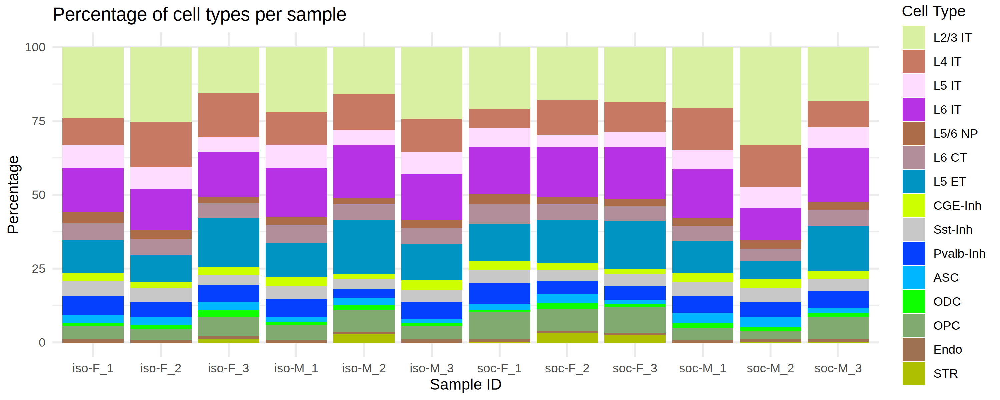

In [27]:
options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 300)
seu_obj@meta.data %>%
  group_by(celltype,sample_name) %>%
  count() %>%
  group_by(sample_name) %>%
  mutate(percent=100*n/sum(n)) %>%
  ungroup() %>%
  mutate(celltype_color=case_when(celltype == "L2/3 IT" ~ "#D9F0A3",
                                  celltype == "L4 IT" ~ "#C77963",
                                  celltype == "L5 IT" ~ "#FDDCFF",
                                    celltype == "L6 IT" ~ "#B832E5",
                                    celltype == "L5/6 NP" ~ "#AD6C49",
                                  celltype == "L5 ET" ~ "#B28D9A",
                                  celltype == "L6 CT" ~ "#0094C2",
                                  celltype == "CGE-Inh" ~ "#CEFF00",
                                  celltype == "Sst-Inh" ~ "#C8C8C8",
                                  celltype == "Pvalb-Inh" ~ "#0640FF",
                                  celltype == "ASC" ~ "#00B7FF",
                                  celltype == "ODC" ~ "#0DFF00",
                                    celltype == "OPC" ~ "#81AA70",
                                  celltype == "Endo" ~ "#9E7153",
                                  celltype == "STR" ~ "#ADBF00"
                                   ))%>%
  mutate(celltype_color=factor(celltype_color,
                               levels=c("#D9F0A3","#C77963","#FDDCFF","#B832E5","#AD6C49","#B28D9A","#0094C2","#CEFF00",
                                        "#C8C8C8","#0640FF","#00B7FF","#0DFF00","#81AA70","#9E7153","#ADBF00"))) %>%
  mutate(celltype=factor(celltype,levels=!!celltype_order,labels=!!celltype_label)) %>%
  ggplot(aes(x=sample_name,y=percent, fill=celltype_color)) +
  geom_col() +
  scale_fill_identity(guide = "legend", labels = celltype_label) +
  ggtitle("Percentage of cell types per sample") +
  theme_minimal() +
  labs(x = "Sample ID", y = "Percentage", fill = "Cell Type")

### Perform DEG analysis

In [28]:
head(seu_obj@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,nCount_SCT,nFeature_SCT,group,sex,SCT_snn_res.0.7,seurat_clusters,pANN_0.25_0.09_5707,DF.classifications_0.25_0.09_5707,sampleID,sample_name,sampleGroup,celltype,celltype_color
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<int>,<chr>,<chr>,<fct>,<fct>,<dbl>,<chr>,<chr>,<chr>,<chr>,<fct>,<chr>
iso-F-04_AAACCATAGACTATGCAATACCAGGCGCA,Rat,2892,1519,0,3229,1519,iso,F,10,10,0.3220896,Singlet,iso-F-04,iso-F_1,iso-F,Sst-Inh,#C8C8C8
iso-F-04_AAACCATAGACTATGCAATTCGGATTCGG,Rat,2971,1489,0,3287,1489,iso,F,8,8,0.2795970,Singlet,iso-F-04,iso-F_1,iso-F,L6 IT,#B832E5
iso-F-04_AAACCATAGGGTATGCTTGTCGGATTCGG,Rat,1996,1189,0,3028,1208,iso,F,10,10,0.3189136,Singlet,iso-F-04,iso-F_1,iso-F,Sst-Inh,#C8C8C8
iso-F-04_AAACCATAGTCCTACCAGTCTAACTAGGT,Rat,5871,2496,0,4299,2456,iso,F,14,14,0.2988720,Singlet,iso-F-04,iso-F_1,iso-F,L5/6 NP,#AD6C49
iso-F-04_AAACCATAGTCCTACCAGTGTAGGATAAG,Rat,2068,1185,0,3104,1190,iso,F,3,3,0.1328442,Singlet,iso-F-04,iso-F_1,iso-F,L4 IT,#C77963
iso-F-04_AAACCATAGTCGCGGTTGGTTGATACGAT,Rat,1922,1121,0,3064,1153,iso,F,10,10,0.3220896,Singlet,iso-F-04,iso-F_1,iso-F,Sst-Inh,#C8C8C8


In [29]:
# pseudobulk the counts based on donor-condition-celltype
pseudo_seu <- AggregateExpression(seu_obj, 
                                  assays = "RNA", 
                                  return.seurat = T, 
                                  group.by = c("sample_name","celltype"),
                                 normalization.method = NULL)

tail(Cells(pseudo_seu))

Names of identity class contain underscores ('_'), replacing with dashes ('-')
This message is displayed once every 8 hours.


[1] "soc-M-3_Pvalb-Inh" "soc-M-3_ASC"       "soc-M-3_ODC"      
[4] "soc-M-3_OPC"       "soc-M-3_Endo"      "soc-M-3_STR"

In [30]:
pseudo_seu

An object of class Seurat 
26597 features across 175 samples within 1 assay 
Active assay: RNA (26597 features, 0 variable features)
 2 layers present: counts, data

In [31]:
pseudo_seu$celltype.group <- 
    paste(pseudo_seu$celltype, str_split(pseudo_seu$sample_name,"-",simplify = T)[,1], sep = "_")

In [32]:
head(pseudo_seu@meta.data)

,orig.ident,sample_name,celltype,celltype.group
,<chr>,<chr>,<chr>,<chr>
iso-F-1_L2/3 IT,iso-F-1_L2/3 IT,iso-F-1,L2/3 IT,L2/3 IT_iso
iso-F-1_L4 IT,iso-F-1_L4 IT,iso-F-1,L4 IT,L4 IT_iso
iso-F-1_L5 IT,iso-F-1_L5 IT,iso-F-1,L5 IT,L5 IT_iso
iso-F-1_L6 IT,iso-F-1_L6 IT,iso-F-1,L6 IT,L6 IT_iso
iso-F-1_L5/6 NP,iso-F-1_L5/6 NP,iso-F-1,L5/6 NP,L5/6 NP_iso
iso-F-1_L6 CT,iso-F-1_L6 CT,iso-F-1,L6 CT,L6 CT_iso


In [33]:
saveRDS(pseudo_seu,file = "./pseudo_Seu_obj_2.rds")

In [3]:
pseudo_seu <- readRDS(file = "./pseudo_Seu_obj_2.rds")

In [35]:
Idents(pseudo_seu) <- "celltype.group"

In [36]:
pseudo_de <- list()

In [37]:
bulk.L5IT.de.L5IT <- FindMarkers(object = pseudo_seu, 
                         ident.1 = "L5 IT_iso", 
                         ident.2 = "L5 IT_soc",
                         test.use = "DESeq2")

converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates



In [38]:
head(bulk.L5IT.de.L5IT)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Slit2,2.949433e-10,0.6359687,1,1,7.844608e-06
Samd5,7.635090e-09,-0.6475878,1,1,2.030705e-04
LOC102548918,2.099395e-07,-0.8479969,1,1,5.583761e-03
Hecw2,2.247698e-07,0.3547454,1,1,5.978203e-03
Npas2,3.742395e-07,-0.3196543,1,1,9.953649e-03
Thrb,8.550333e-07,-0.3182722,1,1,2.274132e-02


In [39]:
pseudo_de <- list()
for(i in unique(pseudo_seu$celltype)){
    bulk.de <- FindMarkers(object = pseudo_seu,
                              ident.1 = paste0(i,"_iso"),
                              ident.2 = paste0(i,"_soc"),
                               test.use = "DESeq2")
    
    pseudo_de[[i]] <- bulk.de
}

converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates



ERROR: Error in ValidateCellGroups(object = object, cells.1 = cells.1, cells.2 = cells.2, : Cell group 1 has fewer than 3 cells


In [43]:
names(pseudo_de)

[1] "L2/3 IT"   "L4 IT"     "L5 IT"     "L6 IT"     "L5/6 NP"   "L6 CT"    
 [7] "L5 ET"     "CGE-Inh"   "Sst-Inh"   "Pvalb-Inh" "ASC"       "ODC"      
[13] "OPC"       "Endo"

STR is missing from the DEG analysis, since it's missing in some samples

In [44]:
sapply(pseudo_de,nrow)

L2/3 IT     L4 IT     L5 IT     L6 IT   L5/6 NP     L6 CT     L5 ET   CGE-Inh 
    25760     24656     24447     25525     21544     24828     24419     21304 
  Sst-Inh Pvalb-Inh       ASC       ODC       OPC      Endo 
    22659     23400     21558     19982     23623     17601

#### plot the gene numbers that are detected in each cell type

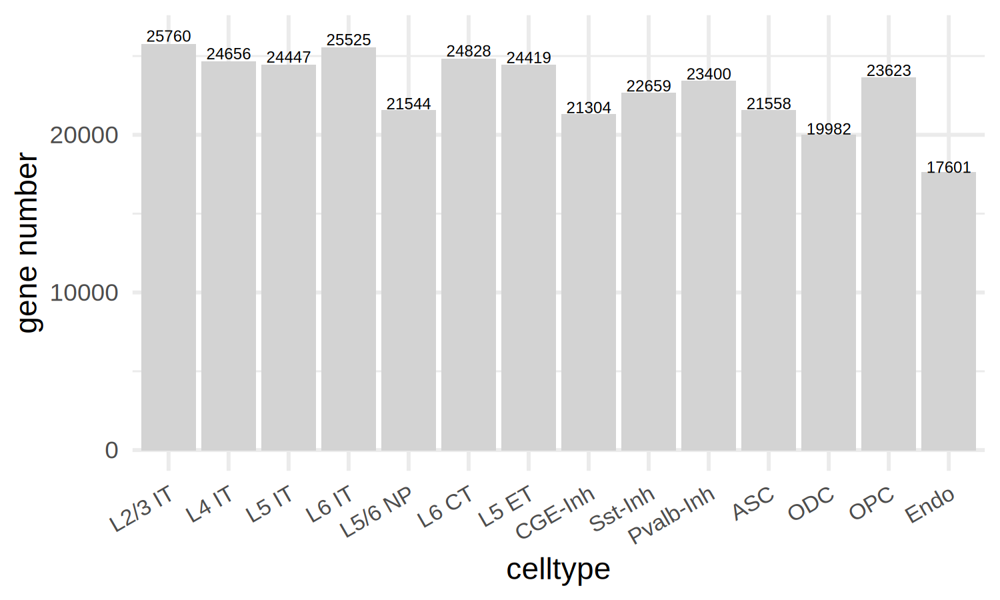

In [45]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 300)
sapply(pseudo_de,nrow) %>%
as.data.frame() %>%
setNames("gene_num") %>%
mutate(celltype=row.names(.)) %>%
mutate(celltype=factor(celltype,levels=names(pseudo_de))) %>%
ggplot(aes(x=celltype,y=gene_num))+
    geom_bar(stat = "identity",fill="lightgrey")+
    geom_text(aes(label = gene_num),
              position = position_stack(vjust = 1.02),size=2)+
    theme_minimal()+
    theme(axis.text.x = element_text(size=8,angle=30,hjust=1,vjust=1))+
    labs(y="gene number")

In [46]:
saveRDS(pseudo_de,file = "./pseudo_DESeq2_DEG_2.rds")

In [4]:
pseudo_de <- readRDS(file = "./pseudo_DESeq2_DEG_2.rds")

### save DEGs into files

In [47]:
names(pseudo_de)

[1] "L2/3 IT"   "L4 IT"     "L5 IT"     "L6 IT"     "L5/6 NP"   "L6 CT"    
 [7] "L5 ET"     "CGE-Inh"   "Sst-Inh"   "Pvalb-Inh" "ASC"       "ODC"      
[13] "OPC"       "Endo"

In [42]:
dir.create(path = "./FC0.3.DEG.list_2")

Warning message in dir.create(path = "./FC0.3.DEG.list_2"):
“'./FC0.3.DEG.list_2' already exists”


In [48]:
## save all gene list
filename=c('L23-IT','L4-IT','L5-IT','L6-IT','L56-NP','L6-CT','L5-ET','CGE-Inh','Sst-Inh','Pvalb-Inh','ASC','ODC','OPC','Endo')
lapply(seq_len(length(names(pseudo_de))),function(x){
            pseudo_de[[x]] %>%
            write.table(,file=paste0("./FC0.3.DEG.list_2/",filename[x],"_iso_vs_soc_total_gene.xls"),sep="\t",quote=F)
    }  
)

[[1]]
NULL

[[2]]
NULL

[[3]]
NULL

[[4]]
NULL

[[5]]
NULL

[[6]]
NULL

[[7]]
NULL

[[8]]
NULL

[[9]]
NULL

[[10]]
NULL

[[11]]
NULL

[[12]]
NULL

[[13]]
NULL

[[14]]
NULL

In [60]:
seq_len(length(names(pseudo_de)))

[1]  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15

In [127]:
pseudo_de[[1]] %>%
    filter(avg_log2FC>0.3,p_val_adj<0.05) %>%
    nrow()

[1] 7

In [49]:
filename=c('L23-IT','L4-IT','L5-IT','L6-IT','L56-NP','L6-CT','L5-ET','CGE-Inh','Sst-Inh','Pvalb-Inh','ASC','ODC','OPC','Endo')
lapply(seq_len(length(names(pseudo_de))), function(x) {
    if (sum(pseudo_de[[x]]$p_val_adj < 0.05 & abs(pseudo_de[[x]]$avg_log2FC) > 0.3,na.rm = TRUE) > 0) {
        filtered_data <- pseudo_de[[x]] %>%
            filter(p_val_adj < 0.05, abs(avg_log2FC) > 0.3)
        
        write.table(filtered_data, 
                    file = paste0("./FC0.3.DEG.list_2/", filename[x], "_iso_vs_soc_DEG.xls"), 
                    sep = "\t", 
                    quote = FALSE, 
                    row.names = TRUE)
    }
})


[[1]]
NULL

[[2]]
NULL

[[3]]
NULL

[[4]]
NULL

[[5]]
NULL

[[6]]
NULL

[[7]]
NULL

[[8]]
NULL

[[9]]
NULL

[[10]]
NULL

[[11]]
NULL

[[12]]
NULL

[[13]]
NULL

[[14]]
NULL

### Plot DEG number and cell count

In [50]:
p1 <- 
seu_obj@meta.data %>%
    count(celltype) %>%
    ggplot(aes(x=celltype,y=n))+
    geom_bar(stat = "identity",fill="darkgrey")+
    geom_text(aes(label = n), vjust = 0.5,size=4)+
    labs(x="",y="# of cells")+
    theme_minimal()+
    theme(axis.text.x=element_text(angle=90,hjust=1,color='black'),
         plot.margin = unit(c(0,0,0,0), "cm"))

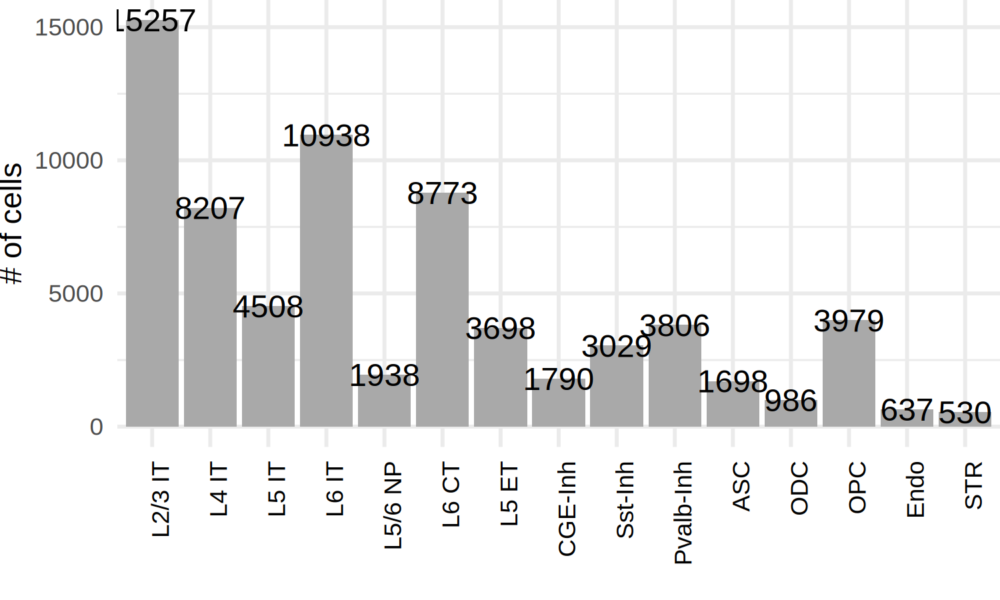

In [51]:
p1

In [52]:
p2 <- 
do.call(rbind,Map(cbind, pseudo_de, new_clumn = names(pseudo_de))) %>%
mutate(diff=case_when(p_val_adj<0.05 & avg_log2FC>0.3 ~ "up",
                     p_val_adj<0.05 & avg_log2FC< (-0.3) ~ "down",
                     .default = "nonsig")
      ) %>%
count(new_clumn,diff) %>%
mutate(plot_y=ifelse(diff=="down",(-1)*n,n)) %>%
filter(new_clumn!="NA",diff!="nonsig") %>%
mutate(new_clumn=factor(new_clumn,levels=levels(seu_obj@meta.data$celltype))) %>%
ggplot(aes(x=new_clumn,y=plot_y,fill=diff))+
geom_bar(stat = "identity")+
geom_hline(yintercept = 0)+
labs(x="",y="# of DEGs",fill="iso/soc")+
geom_text(aes(label = abs(plot_y)), vjust = 0.5,size=5)+
scale_fill_manual(values=c("#85a0ab","#eb9c81"))+
scale_y_continuous(breaks=c(-300,-200,-100,0,100,200),labels=c(300,200,100,0,100,200))+
theme_classic()+
theme(panel.grid = element_blank(),
      axis.text.x = element_text(angle=90,color='black',hjust=1,size=11),
      #axis.text.x = element_blank(),
      axis.ticks.x = element_blank(),
     plot.margin = unit(c(0,0,0,0), "cm"))

In [58]:
p2 <- do.call(rbind,Map(cbind, pseudo_de, new_clumn = names(pseudo_de))) %>%
mutate(diff=case_when(p_val_adj<0.05 & avg_log2FC>0.3 ~ "up",
                     p_val_adj<0.05 & avg_log2FC< (-0.3) ~ "down",
                     .default = "nonsig")
      ) %>%
count(new_clumn,diff) %>%
mutate(plot_y=ifelse(diff=="down",(-1)*n,n)) %>%
filter(new_clumn!="NA",diff!="nonsig") %>%
add_row(new_clumn=c("L5/6 NP","Sst-Inh","Pvalb-Inh","ASC","ODC","Endo","STR"),diff="up",n=0,plot_y=0) %>%
mutate(new_clumn=factor(new_clumn,levels=levels(seu_obj@meta.data$celltype))) %>%
ggplot(aes(x=new_clumn,y=plot_y,fill=diff))+
geom_bar(stat = "identity")+
geom_hline(yintercept = 0)+
labs(x="",y="# of DEGs",fill="iso/soc")+
geom_text(aes(label = abs(plot_y)), vjust = 0.5,size=5)+
scale_fill_manual(values=c("#85a0ab","#eb9c81"))+
scale_y_continuous(breaks=c(-300,-200,-100,0,100,200),labels=c(300,200,100,0,100,200))+
theme_classic()+
theme(panel.grid = element_blank(),
      axis.text.x = element_text(angle=90,color='black',hjust=1,size=11),
      #axis.text.x = element_blank(),
      axis.ticks.x = element_blank(),
     plot.margin = unit(c(0,0,0,0), "cm"))

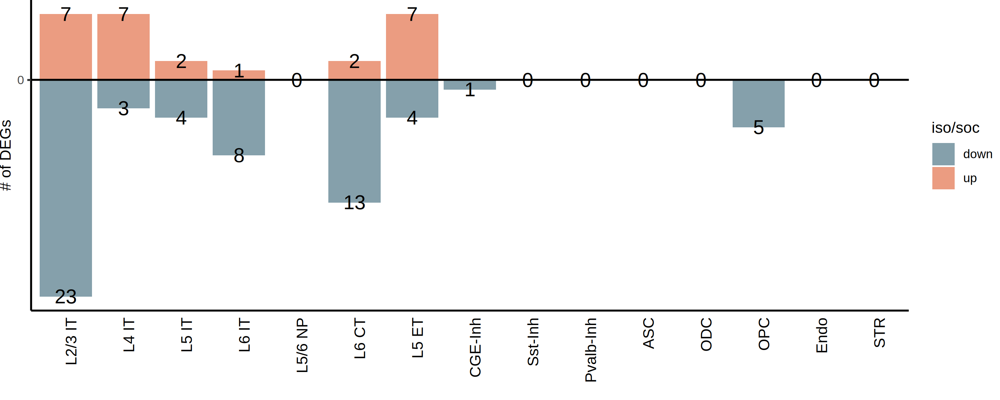

In [59]:
options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 300)
p2

In [60]:
pdf("./DEG_FC0.3_counts_barplot_2.pdf",width=10,height=6)
p2/p1 + plot_layout(heights = c(2, 1))+ plot_annotation(title='threshold: p.adjust<0.05 & |logFC|>0.3')
dev.off()

png 
  2

In [76]:
library(scrattch.vis)

Loading required package: ggbeeswarm

Loading required package: ggdendro

Loading required package: purrr



In [128]:
levels(seu_obj@meta.data$celltype)

[1] "L2/3 IT"   "L4 IT"     "L5 IT"     "L6 IT"     "L5/6 NP"   "L6 CT"    
 [7] "L5 ET"     "CGE-Inh"   "Sst-Inh"   "Pvalb-Inh" "ASC"       "Oligo"    
[13] "ODC"       "OPC"       "Endo"      "STR"

In [75]:
Idents(seu_obj) <- "celltype"
gene_ls <- c("Slc17a7", ## Exc
             "Prex1","Enpp2","Rfx3", ## L2/3 IT
             "Rorb", "Kcnh5","Cadps2", ## L4 IT
             "Ptgfran","Il1rapl2", ## L5 IT
             "Mgat","Rspo2","Kcnab1", ## L6 IT
             "Vwc2l","Nxph1",## L5/6 NP
             "Foxp2","Tle4","Syt6", ## L6 CT
             "Vat1l","Etv1","Tcerg1l", ## L5 ET
             "Fgf13","Lamp5","Vip", "Npas3",## CGE-Inh
             "Sst", "Grin3a", ## Sst-Inh
             "Cemip","Man1c1", ## Pvalb-Inh
             "Slc1a3","Atp1a2", ## ASC
            "Mbp","Mobp","Plp1",## ODC
             "Gfra1","Shisa6", ## OPC
             "Flt1","Cyyr1", ## Endo
             "Pbx3","Rgs9" ## STR
             
            )
data_df <- cbind(sample_name=colnames(seu_obj@assays$SCT$data),
      as.data.frame(t(as.matrix(seu_obj@assays$SCT$data[gene_ls[gene_ls %in% row.names(seu_obj@assays$SCT$data)],]))))
anno <- seu_obj@meta.data %>%
        mutate(sample_name=row.names(.)) %>%
        mutate(celltype_id=celltype) %>%
        mutate(celltype_label=celltype)

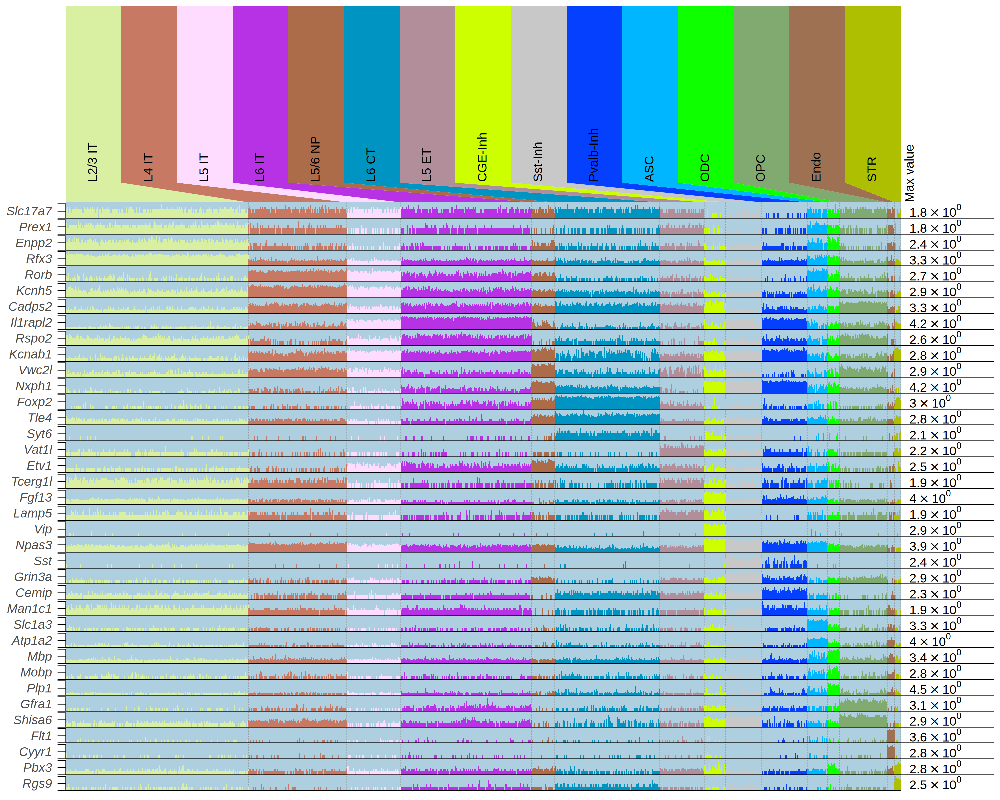

In [77]:
options(repr.plot.width = 10, repr.plot.height = 8, repr.plot.res = 300)
p <- sample_bar_plot(data_df, 
                anno, 
                genes = gene_ls[gene_ls %in% row.names(seu_obj@assays$SCT$data)], 
                grouping = "celltype", 
                log_scale = FALSE,
                font_size = 9,
                label_type = "angle")
print(p)

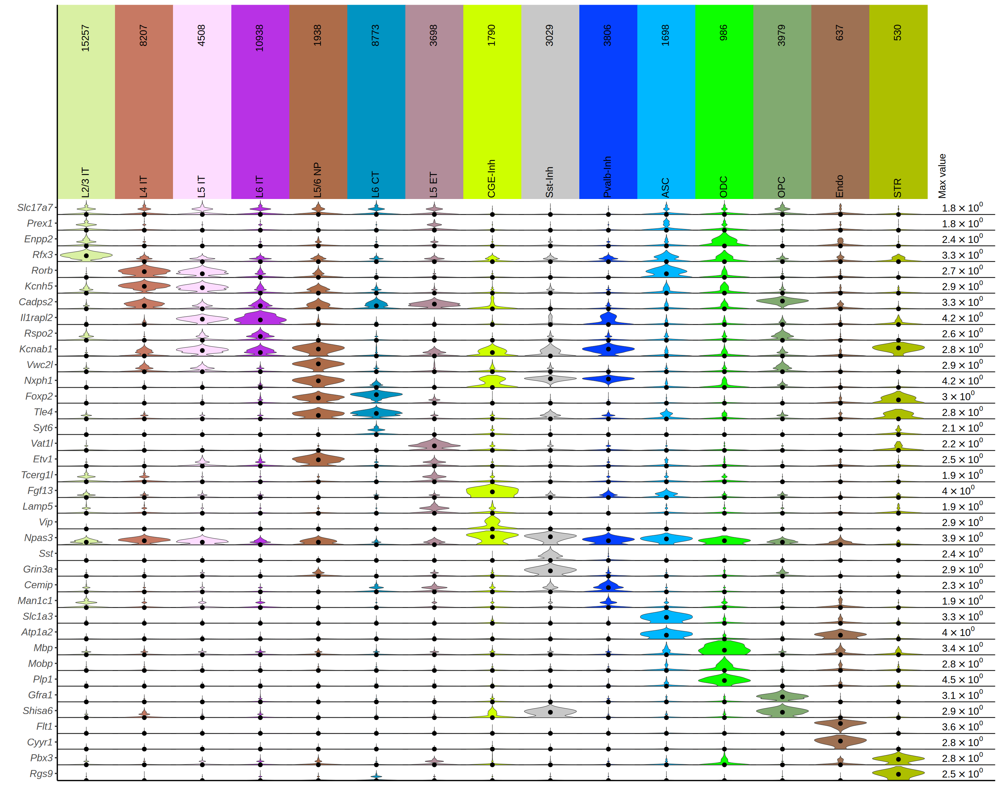

In [78]:
group_violin_plot(data_df, 
                  anno, 
                  genes = gene_ls[gene_ls %in% row.names(seu_obj@assays$SCT$data)], 
                  grouping = "celltype", 
                  log_scale = FALSE,
                  font_size = 7,
                  rotate_counts = TRUE)

## check expression on DEGs

In [73]:
head(pseudo_seu)

,orig.ident,sample_name,celltype,celltype.group
,<chr>,<chr>,<chr>,<chr>
iso-F-1_L2/3 IT,iso-F-1_L2/3 IT,iso-F-1,L2/3 IT,L2/3 IT_iso
iso-F-1_L4 IT,iso-F-1_L4 IT,iso-F-1,L4 IT,L4 IT_iso
iso-F-1_L5 IT,iso-F-1_L5 IT,iso-F-1,L5 IT,L5 IT_iso
iso-F-1_L6 IT,iso-F-1_L6 IT,iso-F-1,L6 IT,L6 IT_iso
iso-F-1_L5/6 NP,iso-F-1_L5/6 NP,iso-F-1,L5/6 NP,L5/6 NP_iso
iso-F-1_L6 CT,iso-F-1_L6 CT,iso-F-1,L6 CT,L6 CT_iso
iso-F-1_L5 ET,iso-F-1_L5 ET,iso-F-1,L5 ET,L5 ET_iso
iso-F-1_CGE-Inh,iso-F-1_CGE-Inh,iso-F-1,CGE-Inh,CGE-Inh_iso
iso-F-1_Sst-Inh,iso-F-1_Sst-Inh,iso-F-1,Sst-Inh,Sst-Inh_iso


In [74]:
head(seu_obj)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,nCount_SCT,nFeature_SCT,group,sex,SCT_snn_res.0.7,seurat_clusters,pANN_0.25_0.09_5707,DF.classifications_0.25_0.09_5707,sampleID,sample_name,sampleGroup,celltype,celltype_color
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<int>,<chr>,<chr>,<fct>,<fct>,<dbl>,<chr>,<chr>,<chr>,<chr>,<fct>,<chr>
iso-F-04_AAACCATAGACTATGCAATACCAGGCGCA,Rat,2892,1519,0,3229,1519,iso,F,10,10,0.3220896,Singlet,iso-F-04,iso-F_1,iso-F,Sst-Inh,#C8C8C8
iso-F-04_AAACCATAGACTATGCAATTCGGATTCGG,Rat,2971,1489,0,3287,1489,iso,F,8,8,0.2795970,Singlet,iso-F-04,iso-F_1,iso-F,L6 IT,#B832E5
iso-F-04_AAACCATAGGGTATGCTTGTCGGATTCGG,Rat,1996,1189,0,3028,1208,iso,F,10,10,0.3189136,Singlet,iso-F-04,iso-F_1,iso-F,Sst-Inh,#C8C8C8
iso-F-04_AAACCATAGTCCTACCAGTCTAACTAGGT,Rat,5871,2496,0,4299,2456,iso,F,14,14,0.2988720,Singlet,iso-F-04,iso-F_1,iso-F,L5/6 NP,#AD6C49
iso-F-04_AAACCATAGTCCTACCAGTGTAGGATAAG,Rat,2068,1185,0,3104,1190,iso,F,3,3,0.1328442,Singlet,iso-F-04,iso-F_1,iso-F,L4 IT,#C77963
iso-F-04_AAACCATAGTCGCGGTTGGTTGATACGAT,Rat,1922,1121,0,3064,1153,iso,F,10,10,0.3220896,Singlet,iso-F-04,iso-F_1,iso-F,Sst-Inh,#C8C8C8
iso-F-04_AAACCATAGTCTGATACCAAACGAATTCG,Rat,2772,1443,0,3179,1443,iso,F,15,15,0.3000767,Singlet,iso-F-04,iso-F_1,iso-F,CGE-Inh,#CEFF00
iso-F-04_AAACCATAGTCTGATACCAGCTAACGGAT,Rat,2255,1272,0,3101,1274,iso,F,0,0,0.1952689,Singlet,iso-F-04,iso-F_1,iso-F,L2/3 IT,#D9F0A3
iso-F-04_AAACCATAGTCTGATACCATGATTAGGTA,Rat,3921,1806,0,3828,1806,iso,F,8,8,0.2691929,Singlet,iso-F-04,iso-F_1,iso-F,L6 IT,#B832E5


In [77]:
names(pseudo_de)

[1] "L2/3 IT"   "L4 IT"     "L5 IT"     "L6 IT"     "L5/6 NP"   "L6 CT"    
 [7] "L5 ET"     "CGE-Inh"   "Sst-Inh"   "Pvalb-Inh" "ASC"       "Oligo"    
[13] "ODC"       "OPC"       "Endo"

## vocalno plot

In [134]:
head(pseudo_de$`L2/3 IT`)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
LOC102548918,2.089267e-15,-1.3097989,1,1,5.556822e-11
Hecw2,4.087470e-13,0.1434515,1,1,1.087144e-08
Iqgap2,1.322525e-12,-0.7579870,1,1,3.517520e-08
Pdzd2,2.604076e-12,-0.8742842,1,1,6.926060e-08
Dscaml1,3.888047e-12,-0.9569493,1,1,1.034104e-07
Slit2,8.432566e-12,0.6537952,1,1,2.242810e-07


In [140]:
head(pseudo_de$data_df)

,sample_name,Slc17a7,Prex1,Enpp2,Rfx3,Rorb,Kcnh5,Cadps2,Il1rapl2,Rspo2,⋯,Slc1a3,Atp1a2,Flt1,Cyyr1,Plp1,St18,Mbp,Mobp,Pbx3,Rgs9
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
iso-F-04_AAACCATAGACTATGCAATACCAGGCGCA,iso-F-04_AAACCATAGACTATGCAATACCAGGCGCA,0.0000000,0,0.0000000,0.6931472,0.0000000,0.0000000,0,0.000000,0.000000,⋯,0,0,0,0,0,0,0.0000000,0.000000,0,0.0000000
iso-F-04_AAACCATAGACTATGCAATTCGGATTCGG,iso-F-04_AAACCATAGACTATGCAATTCGGATTCGG,0.6931472,0,0.0000000,0.0000000,0.0000000,0.0000000,0,2.079442,1.098612,⋯,0,0,0,0,0,0,0.0000000,0.000000,0,0.6931472
iso-F-04_AAACCATAGGGTATGCTTGTCGGATTCGG,iso-F-04_AAACCATAGGGTATGCTTGTCGGATTCGG,0.0000000,0,0.6931472,0.0000000,0.0000000,0.0000000,0,0.000000,0.000000,⋯,0,0,0,0,0,0,0.6931472,1.386294,0,0.0000000
iso-F-04_AAACCATAGTCCTACCAGTCTAACTAGGT,iso-F-04_AAACCATAGTCCTACCAGTCTAACTAGGT,0.0000000,0,0.0000000,0.0000000,0.6931472,0.6931472,0,1.945910,0.000000,⋯,0,0,0,0,0,0,0.6931472,0.000000,0,0.0000000
iso-F-04_AAACCATAGTCCTACCAGTGTAGGATAAG,iso-F-04_AAACCATAGTCCTACCAGTGTAGGATAAG,0.0000000,0,0.0000000,1.0986123,1.6094379,2.3978953,0,0.000000,0.000000,⋯,0,0,0,0,0,0,0.6931472,0.000000,0,0.0000000
iso-F-04_AAACCATAGTCGCGGTTGGTTGATACGAT,iso-F-04_AAACCATAGTCGCGGTTGGTTGATACGAT,0.0000000,0,0.0000000,0.0000000,0.0000000,0.0000000,0,0.000000,0.000000,⋯,0,0,0,0,0,0,0.0000000,0.000000,0,0.0000000


In [142]:
names(pseudo_de)

[1] "L2/3 IT"   "L4 IT"     "L5 IT"     "L6 IT"     "L5/6 NP"   "L6 CT"    
 [7] "L5 ET"     "CGE-Inh"   "Sst-Inh"   "Pvalb-Inh" "ASC"       "Oligo"    
[13] "ODC"       "OPC"       "Endo"      "data_df"

In [143]:
pseudo_de <- pseudo_de[-16]

In [12]:
library(tidyr)
library(ComplexHeatmap)
library(tibble)
library(circlize)

Loading required package: grid

ComplexHeatmap version 2.18.0
Bioconductor page: http://bioconductor.org/packages/ComplexHeatmap/
Github page: https://github.com/jokergoo/ComplexHeatmap
Documentation: http://jokergoo.github.io/ComplexHeatmap-reference

If you use it in published research, please cite either one:
- Gu, Z. Complex Heatmap Visualization. iMeta 2022.
- Gu, Z. Complex heatmaps reveal patterns and correlations in multidimensional 
    genomic data. Bioinformatics 2016.


The new InteractiveComplexHeatmap package can directly export static 
complex heatmaps into an interactive Shiny app with zero effort. Have a try!

This message can be suppressed by:
  suppressPackageStartupMessages(library(ComplexHeatmap))


circlize version 0.4.16
CRAN page: https://cran.r-project.org/package=circlize
Github page: https://github.com/jokergoo/circlize
Documentation: https://jokergoo.github.io/circlize_book/book/

If you use it in published research, please cite:
Gu, Z. circlize implements a

In [130]:
DEG_up_ls<-
lapply(seq_len(length(names(pseudo_de))), function(x) {
    if (sum(pseudo_de[[x]]$p_val_adj < 0.05 & pseudo_de[[x]]$avg_log2FC > 0.3,na.rm = TRUE) > 0) {
        pseudo_de[[x]] %>%
            filter(p_val_adj < 0.05, avg_log2FC > 0.3)
    }
})
names(DEG_up_ls) <- names(pseudo_de)
DEG_up_ls <- DEG_up_ls[!sapply(DEG_up_ls,is.null)]

In [7]:
names(DEG_up_ls)

[1] "L2/3 IT_iso"   "L2/3 IT_soc"   "L4 IT_iso"     "L4 IT_soc"    
 [5] "L5 IT_iso"     "L5 IT_soc"     "L6 IT_iso"     "L6 IT_soc"    
 [9] "L5/6 NP_iso"   "L5/6 NP_soc"   "L6 CT_iso"     "L6 CT_soc"    
[13] "L5 ET_iso"     "L5 ET_soc"     "CGE-Inh_iso"   "CGE-Inh_soc"  
[17] "Sst-Inh_iso"   "Sst-Inh_soc"   "Pvalb-Inh_iso" "Pvalb-Inh_soc"
[21] "ASC_iso"       "ASC_soc"       "ODC_iso"       "ODC_soc"      
[25] "OPC_iso"       "OPC_soc"       "Endo_iso"

## merge the DEG list

In [6]:
DEG_ls<-
lapply(seq_len(length(names(pseudo_de))), function(x) {
    if (sum(pseudo_de[[x]]$p_val_adj < 0.05 & abs(pseudo_de[[x]]$avg_log2FC) > 0.3,na.rm = TRUE) > 0) {
        pseudo_de[[x]] %>%
            filter(p_val_adj < 0.05, abs(avg_log2FC) > 0.3)
    }
})
names(DEG_ls) <- names(pseudo_de)
DEG_ls <- DEG_ls[!sapply(DEG_ls,is.null)]

In [9]:
DEG_merged<- do.call(rbind,Map(cbind, DEG_ls, new_clumn = names(DEG_ls))) %>%
  mutate(gene = str_split(row.names(.), "\\.", simplify = TRUE)[, 2]) %>%
    filter(gene != "")

In [10]:
DEG_merged[1:3,]

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,new_clumn,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
L2/3 IT.LOC102548918,2.089267e-15,-1.3097989,1,1,5.556822e-11,L2/3 IT,LOC102548918
L2/3 IT.Iqgap2,1.322525e-12,-0.7579870,1,1,3.517520e-08,L2/3 IT,Iqgap2
L2/3 IT.Pdzd2,2.604076e-12,-0.8742842,1,1,6.926060e-08,L2/3 IT,Pdzd2


In [14]:
## load gene coordinates information
gene_coord <- read.table("/project/zhuzhuzhang/lyang/references/mRatBN7.2_NCBI/gene_coordinates",header=F,stringsAsFactors = F) %>%
setNames(c("chr","start","end","strand","gene"))

do.call(rbind,Map(cbind, DEG_ls, new_clumn = names(DEG_ls))) %>%
  mutate(gene = str_split(row.names(.), "\\.", simplify = TRUE)[, 2]) %>%
    filter(gene != "") %>%
    left_join(gene_coord,by=c("gene"="gene")) %>%
    write.table("isoVSsoc_DEG_total_list.txt",sep="\t",quote=F,row.names=F)

In [8]:
head(DEG_ls)

ERROR: Error in eval(expr, envir, enclos): object 'DEG_ls' not found


In [27]:
head(gene_coord)

,chr,start,end,strand,gene
,<chr>,<int>,<int>,<chr>,<chr>
1,NC_051336.1,40042,56215,-,Vmn2r116l-ps30
2,NC_051336.1,76909,85784,+,Vom2r3
3,NC_051336.1,162525,192445,-,LOC103693496
4,NC_051336.1,226465,241532,-,Vom2r4
5,NC_051336.1,284195,301267,-,LOC102556157
6,NC_051336.1,307758,313908,-,LOC108352169


In [87]:
do.call(rbind,Map(cbind, DEG_up_ls, new_clumn = names(DEG_up_ls))) %>%
  mutate(gene = str_split(row.names(.), "\\.", simplify = TRUE)[, 2]) %>%
    filter(gene != "") %>%
  mutate(new_clumn = factor(new_clumn, levels = c("L2/3 IT", "L4 IT", "L5 IT", "L6 IT", "L6 CT","L5 ET"))) %>%
  select(gene, avg_log2FC, new_clumn) %>%
  pivot_wider(names_from = new_clumn, values_from = avg_log2FC) %>%
    column_to_rownames(var = "gene")

,L2/3 IT,L4 IT,L5 IT,L6 CT,L5 ET
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Slit2,0.6537952,0.8612456,0.6359687,NA,NA
Arap2,0.4076989,NA,NA,NA,NA
Ppm1l,0.3378593,NA,NA,NA,0.3666805
Tle1,0.3199436,NA,NA,NA,NA
Klhl1,0.3302603,NA,NA,NA,0.5306534
LOC120095943,0.5818566,NA,NA,NA,NA
Grm3,0.7929351,NA,NA,NA,0.5282850
LOC120097467,NA,0.3184433,NA,NA,NA
Adcy8,NA,0.6198845,NA,NA,NA


In [93]:
options(repr.plot.width = 2.5, repr.plot.height = 3, repr.plot.res = 300)

col_fun = colorRamp2(c(0, 1), c("white", "red"))

p <-
do.call(rbind,Map(cbind, DEG_up_ls, new_clumn = names(DEG_up_ls))) %>%
  mutate(gene = str_split(row.names(.), "\\.", simplify = TRUE)[, 2]) %>%
    filter(gene != "") %>%
  mutate(new_clumn = factor(new_clumn, levels = c("L2/3 IT", "L4 IT", "L5 IT", "L6 IT", "L6 CT","L5 ET"))) %>%
  select(gene, avg_log2FC, new_clumn) %>%
  pivot_wider(names_from = new_clumn, values_from = avg_log2FC) %>%
    column_to_rownames(var = "gene") %>%
    Heatmap(name = "avg_log2FC",cluster_rows = F,
            cluster_columns = F,rect_gp = gpar(col = "white", lwd = 1),
            row_names_gp = gpar(fontsize = 8),
            column_names_gp = gpar(fontsize = 8),
            col = col_fun
           )
p

Warning message:
“The input is a data frame-like object, convert it to a matrix.”


In [136]:
do.call(rbind,Map(cbind, DEG_up_ls, new_clumn = names(DEG_up_ls))) %>%
  mutate(gene = str_split(row.names(.), "\\.", simplify = TRUE)[, 2]) %>%
    filter(gene != "") %>%
  mutate(new_clumn = factor(new_clumn, levels = c("L2/3 IT", "L4 IT", "L5 IT", "L6 IT", "L6 CT","L5 ET"))) %>%
  select(gene, avg_log2FC, new_clumn) %>%
    write.table(file="isoVSsoc_up_DEG_FC.xls",quote=F,sep="\t")

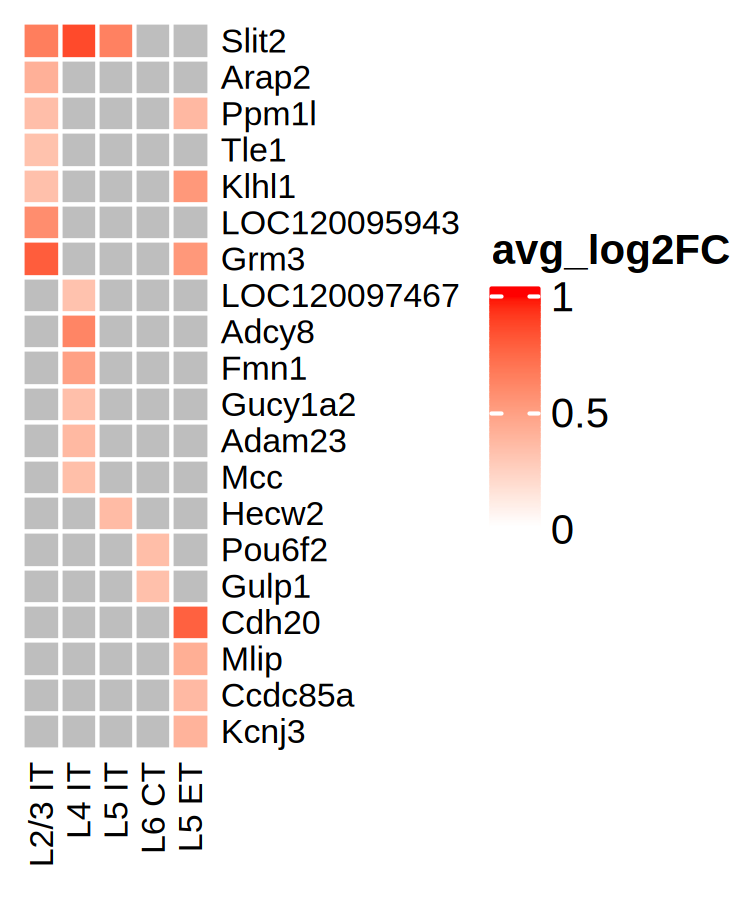

In [92]:
p

In [88]:
DEG_down_ls<-
lapply(seq_len(length(names(pseudo_de))), function(x) {
    if (sum(pseudo_de[[x]]$p_val_adj < 0.05 & pseudo_de[[x]]$avg_log2FC < (-0.3),na.rm = TRUE) > 0) {
        pseudo_de[[x]] %>%
            filter(p_val_adj < 0.05, avg_log2FC < (-0.3))
    }
})
names(DEG_down_ls) <- names(pseudo_de)
DEG_down_ls <- DEG_down_ls[!sapply(DEG_down_ls,is.null)]

In [89]:
names(DEG_down_ls)

[1] "L2/3 IT" "L4 IT"   "L5 IT"   "L6 IT"   "L6 CT"   "L5 ET"   "CGE-Inh"
[8] "OPC"

In [94]:
options(repr.plot.width = 2.5, repr.plot.height = 4, repr.plot.res = 300)

col_fun = colorRamp2(c(-1, 0), c("blue", "white"))

p <- do.call(rbind,Map(cbind, DEG_down_ls, new_clumn = names(DEG_down_ls))) %>%
  mutate(gene = str_split(row.names(.), "\\.", simplify = TRUE)[, 2]) %>%
    filter(gene != "") %>%
  mutate(new_clumn = factor(new_clumn, levels = c("L2/3 IT", "L4 IT", "L5 IT",  "L6 IT", "L6 CT","L5 ET", "CGE-Inh", "OPC"))) %>%
  select(gene, avg_log2FC, new_clumn) %>%
  pivot_wider(names_from = new_clumn, values_from = avg_log2FC) %>%
    column_to_rownames(var = "gene") %>%
    Heatmap(name = "avg_log2FC",cluster_rows = F,
            cluster_columns = F,rect_gp = gpar(col = "white", lwd = 1),
            row_names_gp = gpar(fontsize = 6),
            column_names_gp = gpar(fontsize = 8),
            col = col_fun
           )


Warning message:
“The input is a data frame-like object, convert it to a matrix.”


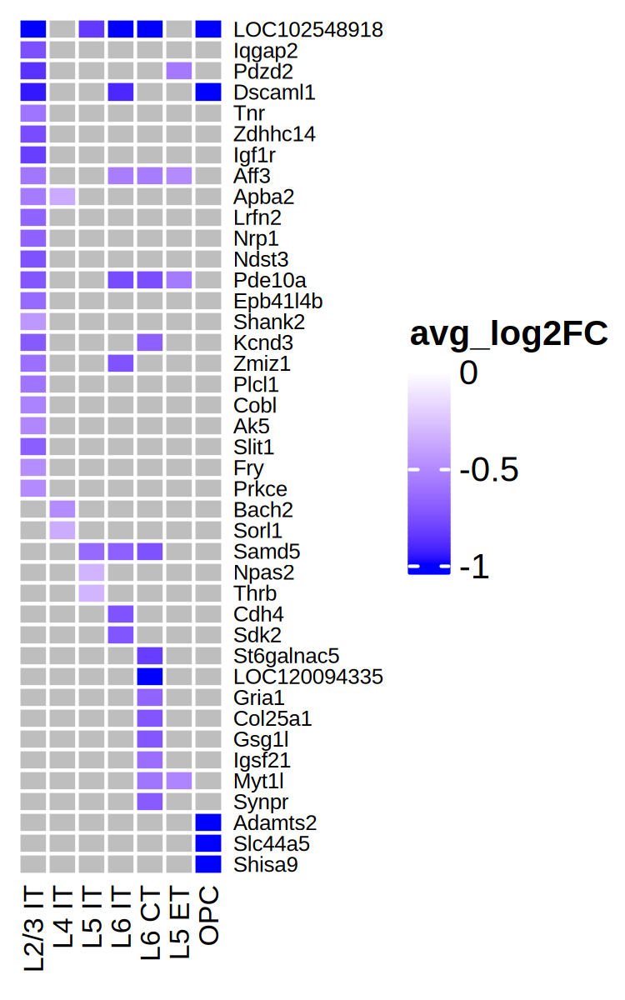

In [95]:
p

## violin plots on DEGs

## volcano plots

In [ ]:
ggplot(data=pseudo_de$`L2/3 IT`, aes(x=avg_log2FC, y =-log10(p_val_adj)))+
    geom_point(data=subset(pseudo_de$`L2/3 IT`, p_val_adj>0.05 | abs(avg_log2FC)<0.3),color="#828C8C",alpha=0.5)+    
 geom_point(data=subset(pseudo_de$`L2/3 IT`,p_val_adj<0.05 & avg_log2FC > 0.3),color="#bb3e03",alpha=0.5) +
     geom_point(data=subset(pseudo_de$`L2/3 IT`,p_val_adj < 0.05 & avg_log2FC < (-0.3)),color="#2c7da0",alpha=0.5) +
                   geom_hline(yintercept = -log10(0.05),lty=4,lwd=0.6,alpha=0.8)+
     geom_vline(xintercept = c(-0.3,0.3),lty=4,lwd=0.6,alpha=0.8)+
     #scale_y_continuous(limits = c(0,50),expand = c(0,0))+
     #scale_x_continuous(limits = c(-3,3),expand = c(0,0))+
     theme_bw()+
     theme(panel.border = element_blank(),
           panel.grid.major = element_blank(),
           panel.grid.minor = element_blank(),
              axis.line = element_line(colour = 'black'),
           axis.title.x = element_text(size = 12),
           axis.title.y = element_text(size = 12)     )+
     labs(x='log2FC',y='-log10 (FDR)')+
     theme(legend.position='none')

## scrratch plots

In [108]:
tmp_sub_seuobj = subset(seu_obj, subset = celltype=="L2/3 IT")
gene_ls_down <- pseudo_de$`L2/3 IT` %>%
    filter(p_val_adj < 0.05, avg_log2FC < (-0.3)) %>%
    row.names() 
gene_ls_up <- pseudo_de$`L2/3 IT` %>%
    filter(p_val_adj < 0.05, avg_log2FC > 0.3) %>%
    row.names()
gene_ls <- c(gene_ls_down,gene_ls_up)
data_df <- cbind(sample_name=row.names(tmp_sub_seuobj@meta.data),
      as.data.frame(t(as.matrix(tmp_sub_seuobj@assays$SCT$data[gene_ls[gene_ls %in% row.names(tmp_sub_seuobj@assays$SCT$data)],]))))
anno <- tmp_sub_seuobj@meta.data %>%
        mutate(sample_name=row.names(.)) %>%
        mutate(sampleGroup_id=sampleGroup) %>%
        mutate(sampleGroup_label=sampleGroup) %>%
        mutate(sampleGroup_color = case_when(
            sampleGroup == "iso-F" ~ "#65CA2F",
            sampleGroup == "iso-M" ~ "#0D5D7E",
            sampleGroup == "soc-F" ~ "#DA808C",
            sampleGroup == "soc-M" ~ "#EC8E6E",
        ))
Idents(tmp_sub_seuobj) <- "sampleGroup"

In [ ]:
options(repr.plot.width = 4, repr.plot.height = 8, repr.plot.res = 300)
sample_heatmap_plot(data_df, 
                    anno, 
                    genes = gene_ls, 
                    grouping = "sampleGroup", 
                    log_scale = TRUE,
                    font_size = 5)

In [ ]:
options(repr.plot.width = 4, repr.plot.height = 8, repr.plot.res = 300)
group_violin_plot(data_df, 
                    anno, 
                    genes = gene_ls, 
                    grouping = "sampleGroup", 
                    log_scale = TRUE,
                    font_size = 5)

In [6]:
Idents(seu_obj) <- "celltype"

In [7]:
seu_obj@meta.data$group <- factor(seu_obj@meta.data$group,levels=c("soc","iso"))

In [25]:
isoVSsoc_DEG_ls <- read.table("isoVSsoc_DEG_total_list.txt",sep="\t",stringsAsFactors = F,header=T)

In [26]:
isoVSsoc_DEG_ls

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,new_clumn,gene,chr,start,end,strand
<dbl>,<dbl>,<int>,<int>,<dbl>,<chr>,<chr>,<chr>,<int>,<int>,<chr>
2.089267e-15,-1.3097989,1,1,5.556822e-11,L2/3 IT,LOC102548918,NC_051352.1,5669403,5682782,-
1.322525e-12,-0.7579870,1,1,3.517520e-08,L2/3 IT,Iqgap2,NC_051337.1,26894836,27170270,-
2.604076e-12,-0.8742842,1,1,6.926060e-08,L2/3 IT,Pdzd2,NC_051337.1,61384614,61770516,-
3.888047e-12,-0.9569493,1,1,1.034104e-07,L2/3 IT,Dscaml1,NC_051343.1,45740298,46057322,+
8.432566e-12,0.6537952,1,1,2.242810e-07,L2/3 IT,Slit2,NC_051349.1,62616337,62955934,-
3.552922e-11,-0.6025447,1,1,9.449705e-07,L2/3 IT,Tnr,NC_051348.1,71751714,72172731,+
4.598321e-10,0.4076989,1,1,1.223015e-05,L2/3 IT,Arap2,NC_051349.1,46717657,46917326,+
1.004825e-09,0.3378593,1,1,2.672533e-05,L2/3 IT,Ppm1l,NC_051337.1,153566653,153839434,+
1.039402e-09,-0.7681818,1,1,2.764497e-05,L2/3 IT,Zdhhc14,NC_051336.1,46069127,46340806,+


In [35]:
unique(isoVSsoc_DEG_ls$gene)

[1] "LOC102548918" "Iqgap2"       "Pdzd2"        "Dscaml1"      "Slit2"       
 [6] "Tnr"          "Arap2"        "Ppm1l"        "Zdhhc14"      "Igf1r"       
[11] "Tle1"         "Aff3"         "Apba2"        "Lrfn2"        "Klhl1"       
[16] "Nrp1"         "Ndst3"        "Pde10a"       "Epb41l4b"     "Shank2"      
[21] "Kcnd3"        "Zmiz1"        "LOC120095943" "Plcl1"        "Cobl"        
[26] "Ak5"          "Slit1"        "Fry"          "Grm3"         "Prkce"       
[31] "LOC120097467" "Adcy8"        "Fmn1"         "Gucy1a2"      "Adam23"      
[36] "Bach2"        "Sorl1"        "Mcc"          "Samd5"        "Hecw2"       
[41] "Npas2"        "Thrb"         "Cdh4"         "Sdk2"         "Pou6f2"      
[46] "St6galnac5"   "LOC120094335" "Gria1"        "Col25a1"      "Gsg1l"       
[51] "Igsf21"       "Gulp1"        "Myt1l"        "Synpr"        "Cdh20"       
[56] "Mlip"         "Ccdc85a"      "Kcnj3"        "Adamts2"      "Slc44a5"     
[61] "Shisa9"

In [7]:
head(isoVSsoc_DEG_ls)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,new_clumn,gene,chr,start,end,strand
,<dbl>,<dbl>,<int>,<int>,<dbl>,<chr>,<chr>,<chr>,<int>,<int>,<chr>
1,2.089267e-15,-1.3097989,1,1,5.556822e-11,L2/3 IT,LOC102548918,NC_051352.1,5669403,5682782,-
2,1.322525e-12,-0.7579870,1,1,3.517520e-08,L2/3 IT,Iqgap2,NC_051337.1,26894836,27170270,-
3,2.604076e-12,-0.8742842,1,1,6.926060e-08,L2/3 IT,Pdzd2,NC_051337.1,61384614,61770516,-
4,3.888047e-12,-0.9569493,1,1,1.034104e-07,L2/3 IT,Dscaml1,NC_051343.1,45740298,46057322,+
5,8.432566e-12,0.6537952,1,1,2.242810e-07,L2/3 IT,Slit2,NC_051349.1,62616337,62955934,-
6,3.552922e-11,-0.6025447,1,1,9.449705e-07,L2/3 IT,Tnr,NC_051348.1,71751714,72172731,+


In [7]:
length(unique(isoVSsoc_DEG_ls$gene))

[1] 61

In [22]:
## save the raw data for ploting violin plots into tab-delimited file
write.table(seu_obj@assays$SCT$data[unique(isoVSsoc_DEG_ls$gene),],
            file="isoVSsoc_DEG_SCT_data.tsv",
           sep="\t",row.names=T,quote=F)

In [9]:
write.table(seu_obj@meta.data,
            file="seuObj_meta.tsv",
           sep="\t",row.names=T,quote=F)

In [14]:
head(pseudo_de$`CGE-Inh`)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Slc2a13,9.133224e-08,-0.6474476,1,1,0.002429163
Pde10a,3.580704e-06,-0.7605341,1,1,0.095235991
Nedd4l,2.056974e-04,-0.6763028,1,1,1.000000000
Sgcz,3.172259e-04,-0.0581300,1,1,1.000000000
Asic2,3.340894e-04,-0.5665391,1,1,1.000000000
Tll1,4.353768e-04,0.8687555,1,1,1.000000000


## save the FC data for all celltypes for all DEGs

In [15]:
## gather fold change information together
DEG_ls<- 
lapply(seq_len(length(names(pseudo_de))), function(x) {
        pseudo_de[[x]] %>%
            filter(row.names(.) %in% unique(isoVSsoc_DEG_ls$gene))
    })
names(DEG_ls) <- names(pseudo_de)
all_DEG_gene <- do.call(rbind,Map(cbind, DEG_ls, new_clumn = names(DEG_ls))) %>%
  mutate(gene = str_split(row.names(.), "\\.", simplify = TRUE)[, 2]) %>%
    filter(gene != "")

all_DEG_gene %>%
    select(new_clumn,avg_log2FC,gene) %>%
    tidyr::pivot_wider(names_from = new_clumn, values_from = avg_log2FC) %>%
    tibble::column_to_rownames(var="gene") %>%
    write.table(file="./isoVSsoc_DEG_FC_celltype_matrix.tsv",quote=F,sep="\t",row.names=T)

all_DEG_gene %>%
    select(new_clumn,p_val_adj,gene) %>%
    tidyr::pivot_wider(names_from = new_clumn, values_from = p_val_adj) %>%
    tibble::column_to_rownames(var="gene") %>%
    write.table(file="./isoVSsoc_DEG_adjP_celltype_matrix.tsv",quote=F,sep="\t",row.names=T)

### make heatmap for all FCs in all celltypes

In [8]:
isoVSsoc_DEG_FC <- read.table("./isoVSsoc_DEG_FC_celltype_matrix.tsv", header=T,sep="\t",row.names=1)
isoVSsoc_DEG_P <- read.table("./isoVSsoc_DEG_adjP_celltype_matrix.tsv", header=T,sep="\t",row.names=1)

In [9]:
rm.neg<-plyr::colwise(function(x){
  return(ifelse(x < 0.0001,"****", 
                ifelse(x<0.001,"***",
                      ifelse(x<0.01,"**",
                            ifelse(x<0.05,"*","")))))})
p_sign_df <- rm.neg(isoVSsoc_DEG_P)

row.names(p_sign_df) <- row.names(isoVSsoc_DEG_P)
colnames(p_sign_df) <- c("L2/3 IT", "L4 IT", "L5 IT", "L6 IT", "L5/6 NP", "L6 CT", "L5 ET", "CGE-Inh", "Sst-Inh", "Pvalb-Inh", "ASC", "ODC", "OPC", "Endo")

colnames(isoVSsoc_DEG_FC) <- c("L2/3 IT", "L4 IT", "L5 IT", "L6 IT", "L5/6 NP", "L6 CT", "L5 ET", "CGE-Inh", "Sst-Inh", "Pvalb-Inh", "ASC", "ODC", "OPC", "Endo")
p_sign_df[is.na(p_sign_df)] <- ""
p_sign_df[abs(isoVSsoc_DEG_FC)<0.3] <- ""

In [10]:
summary(isoVSsoc_DEG_FC)

    L2/3 IT             L4 IT              L5 IT             L6 IT          
 Min.   :-1.30980   Min.   :-1.09734   Min.   :-0.8480   Min.   :-1.111527  
 1st Qu.:-0.63743   1st Qu.:-0.38195   1st Qu.:-0.2615   1st Qu.:-0.569098  
 Median :-0.51781   Median :-0.17385   Median :-0.1304   Median :-0.424604  
 Mean   :-0.34255   Mean   :-0.08588   Mean   :-0.0397   Mean   :-0.336213  
 3rd Qu.: 0.07853   3rd Qu.: 0.21437   3rd Qu.: 0.2450   3rd Qu.:-0.007744  
 Max.   : 0.79294   Max.   : 0.86125   Max.   : 0.8612   Max.   : 0.451747  
    L5/6 NP             L6 CT             L5 ET             CGE-Inh       
 Min.   :-1.00000   Min.   :-1.1010   Min.   :-0.82254   Min.   :-0.7605  
 1st Qu.:-0.43982   1st Qu.:-0.6284   1st Qu.:-0.49044   1st Qu.:-0.4358  
 Median :-0.25787   Median :-0.4191   Median :-0.25448   Median :-0.2937  
 Mean   :-0.24905   Mean   :-0.3686   Mean   :-0.18328   Mean   :-0.2709  
 3rd Qu.:-0.08553   3rd Qu.:-0.0889   3rd Qu.: 0.08577   3rd Qu.:-0.1583  
 Max.   : 0

In [13]:
col_fun = colorRamp2(c(-1, 0, 1), c("#0077b6", "white", "#e63946"))
p = Heatmap(isoVSsoc_DEG_FC, name = "iso/soc\navg_logFC", col = col_fun,
        cluster_columns = F,
        show_row_dend = F,
        heatmap_legend_param = list(
            legend_direction = "horizontal", 
        legend_width = unit(6, "cm")),
        row_names_gp = grid::gpar(fontsize = 6),
        column_names_gp = grid::gpar(fontsize = 6),
        cell_fun = function(j, i, x, y, width, height, fill) {
            gb = textGrob("*")
        	gb_w = convertWidth(grobWidth(gb), "mm")
        	gb_h = convertHeight(grobHeight(gb), "mm")
            grid.text(sprintf("%s", p_sign_df[i, j]), x, y - gb_h*0.5 + gb_w*0.4, gp = gpar(fontsize = 10))
})

lgd1 = Legend(labels=c("<0.0001","<0.001","<0.01","<0.05"),pch = c("**** ","*** ","** ","* "), title = "adj.p", type = "points", 
    background = "white",direction = "horizontal")
lgd2 = Legend(labels="gene not detected",legend_gp = gpar(fill = "grey"), title = "NA")

pdf("isoVSsoc_DEG_logFC_heatmap.pdf",width=5,height=7)
draw(p,annotation_legend_list = list(lgd1),heatmap_legend_side="bottom", annotation_legend_side="right",
           legend_grouping = "original")
dev.off()

Warning message:
“The input is a data frame-like object, convert it to a matrix.”


png 
  2

In [27]:
isoVSsoc_DEG_ls$P_label<- 
    symnum(isoVSsoc_DEG_ls$p_val_adj, cutpoints = c(0, 0.0001, 0.001, 0.01, 0.05,1),
       symbols = c("****", "***", "**", "*", "ns"),
       abbr.colnames = FALSE, na = "")

In [19]:
Idents(seu_obj) <- "celltype"

In [34]:
make_vlnplot <- 
function(genes=NULL,celltype=NULL,label_df=NULL){
    VlnPlot(seu_obj, 
        features = genes,
        idents=celltype,
        split.by = "group",
        pt.size = 0.0,
        #split.plot = T,
        log=FALSE)&
        scale_fill_manual(values=c("iso"="#e31a1c","soc"="#ffda79")) &
        annotate("text",x=label_df$new_clumn,y=Inf,label=label_df$P_label,vjust=1,hjust=0.5) &
        #stat_summary(fun = median, fun.min = median, fun.max = median,
        #         geom = "crossbar", 
        #         width = 0.6,
        #         position = position_dodge(width = .70)) &
                xlab("") &
                ylab("Gene Expression") &
          stat_summary(fun = "mean",
               geom = "point",
               color = "black",
               position = position_dodge(width = .90)) &
    labs(caption = paste("adj.p: ","**** <0.0001","*** <0.001","** <0.01","* <0.05")) &
    guides(fill = guide_legend(override.aes = list(linetype = 0,size = 0)),
               color = guide_legend(override.aes = list(linetype = 0,size=0)))
}

In [15]:
write.table(seu_obj@assays$SCT$data,file="./SeuObj_SCT_data_cellGene_mat.tsv",sep="\t",quote=F,row.names=T)

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 13.3 GiB”


In [16]:
write.table(seu_obj@meta.data,file="./SeuObj_metadata.tsv",sep="\t",quote=F,row.names=T)

In [18]:
test_meta <- read.table("./SeuObj_metadata.tsv",sep="\t",row.names = 1)

In [19]:
head(test_meta)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,nCount_SCT,nFeature_SCT,group,sex,SCT_snn_res.0.7,seurat_clusters,pANN_0.25_0.09_5707,DF.classifications_0.25_0.09_5707,sampleID,sample_name,sampleGroup,celltype,celltype_color
,<chr>,<int>,<int>,<int>,<int>,<int>,<chr>,<chr>,<int>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>
iso-F-04_AAACCATAGACTATGCAATACCAGGCGCA,Rat,2892,1519,0,3229,1519,iso,F,10,10,0.3220896,Singlet,iso-F-04,iso-F_1,iso-F,Sst-Inh,NA
iso-F-04_AAACCATAGACTATGCAATTCGGATTCGG,Rat,2971,1489,0,3287,1489,iso,F,8,8,0.2795970,Singlet,iso-F-04,iso-F_1,iso-F,L6 IT,NA
iso-F-04_AAACCATAGGGTATGCTTGTCGGATTCGG,Rat,1996,1189,0,3028,1208,iso,F,10,10,0.3189136,Singlet,iso-F-04,iso-F_1,iso-F,Sst-Inh,NA
iso-F-04_AAACCATAGTCCTACCAGTCTAACTAGGT,Rat,5871,2496,0,4299,2456,iso,F,14,14,0.2988720,Singlet,iso-F-04,iso-F_1,iso-F,L5/6 NP,NA
iso-F-04_AAACCATAGTCCTACCAGTGTAGGATAAG,Rat,2068,1185,0,3104,1190,iso,F,3,3,0.1328442,Singlet,iso-F-04,iso-F_1,iso-F,L4 IT,NA
iso-F-04_AAACCATAGTCGCGGTTGGTTGATACGAT,Rat,1922,1121,0,3064,1153,iso,F,10,10,0.3220896,Singlet,iso-F-04,iso-F_1,iso-F,Sst-Inh,NA


In [22]:
gene_for_plot <- read.csv("./genes_for_vlnplot.csv",header=F,sep="\t")

In [23]:
gene_for_plot

V1,V2
<chr>,<chr>
LOC102548918,"L2/3 IT,L5 IT,L6 CT,L6 IT,OPC"
Slit2,"L2/3 IT,L4 IT,L5 IT"
Aff3,"L2/3 IT,L5 ET,L6 CT,L6 IT"
Pde10a,"L2/3 IT,L5 ET,L6 CT,L6 IT"
Dscaml1,"L2/3 IT,L6 IT,OPC"
Samd5,"L5 IT,L6 CT,L6 IT"
Apba2,"L2/3 IT,L4 IT"
Grm3,"L2/3 IT,L5 ET"
Klhl1,"L2/3 IT,L5 ET"


In [37]:
seq_len(nrow(gene_for_plot))

[1]  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15

In [8]:
label_df <- data.frame(celltype=c("L2/3 IT","L5 IT"),label=c("*","ns"))

In [52]:
genes <- "Pde10a"
celltype <- names(pseudo_de)

In [40]:
i <- 1

In [9]:
names(pseudo_de)

[1] "L2/3 IT"   "L4 IT"     "L5 IT"     "L6 IT"     "L5/6 NP"   "L6 CT"    
 [7] "L5 ET"     "CGE-Inh"   "Sst-Inh"   "Pvalb-Inh" "ASC"       "ODC"      
[13] "OPC"       "Endo"

In [71]:
subset(isoVSsoc_DEG_ls,gene=="Pde10a")

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,new_clumn,gene,chr,start,end,strand,P_label
,<dbl>,<dbl>,<int>,<int>,<dbl>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<noquote>
18,3.387369e-08,-0.7344653,1,1,9.009386e-04,L2/3 IT,Pde10a,NC_051336.1,51765743,52218086,-,***
49,1.013016e-10,-0.7767844,1,1,2.694318e-06,L6 IT,Pde10a,NC_051336.1,51765743,52218086,-,****
62,1.814320e-07,-0.7656736,1,1,4.825546e-03,L6 CT,Pde10a,NC_051336.1,51765743,52218086,-,**
77,7.931858e-08,-0.5769304,1,1,2.109636e-03,L5 ET,Pde10a,NC_051336.1,51765743,52218086,-,**


In [73]:
length(unique(isoVSsoc_DEG_ls$gene))

[1] 61

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


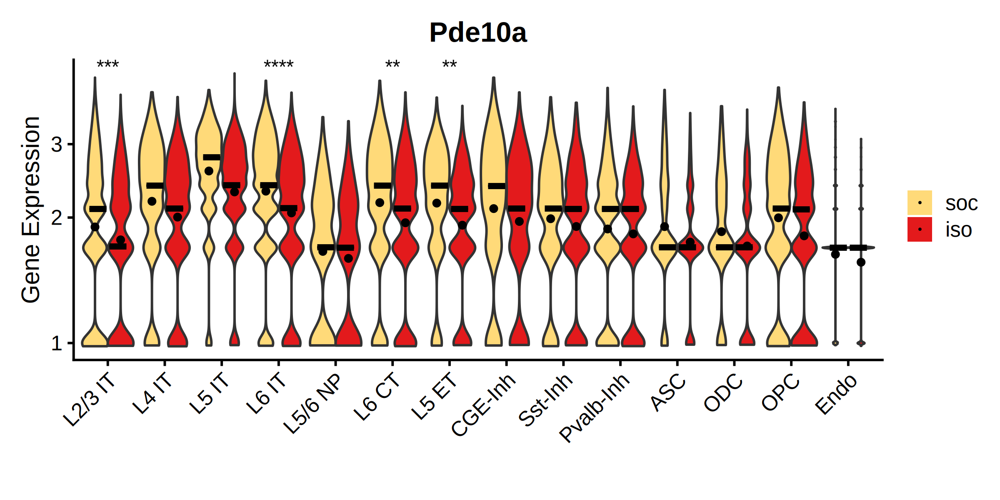

In [72]:
options(repr.plot.width = 8, repr.plot.height = 4, repr.plot.res = 300)
make_vlnplot(genes="Pde10a",
                 celltype=names(pseudo_de),
            label_df=subset(isoVSsoc_DEG_ls,gene=="Pde10a"))

In [137]:
gene_for_plot[1:3,]

,V1,V2
,<chr>,<chr>
1,LOC102548918,"L2/3 IT,L5 IT,L6 CT,L6 IT,OPC"
2,Slit2,"L2/3 IT,L4 IT,L5 IT"
3,Aff3,"L2/3 IT,L5 ET,L6 CT,L6 IT"


In [39]:
pdf(file = "./Vlnplot_for_overlapping_DEGs.pdf",width=4,height=4,onefile=TRUE)
for(i in seq_len(nrow(gene_for_plot))){
    p <- make_vlnplot(genes=gene_for_plot[i,"V1"],
                 celltype=unlist(stringr::str_split(gene_for_plot[i,"V2"],",")))
    print(p)
}
dev.off()

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale

png 
  2

In [32]:
seu_obj@meta.data$group <- factor(seu_obj@meta.data$group,levels=c("soc","iso"))

In [36]:
getwd()

[1] "/project/zhuzhuzhang/lyang/scaleBio_RNA_rat_brain/out_mRatBN"

In [35]:
## make plot for those genes in all celltypes
pdf(file = "./Vlnplot_for_isoVSsoc_DEGs_in_all_celltypes (log=F).pdf",width=8,height=4,onefile=TRUE)
for(i in seq_len(nrow(gene_for_plot))){
    p <- make_vlnplot(genes=gene_for_plot[i,"V1"],
                 celltype=names(pseudo_de),
            label_df=subset(isoVSsoc_DEG_ls,gene==gene_for_plot[i,"V1"]))
    print(p)
}
dev.off()

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale

png 
  2

In [38]:
dev.off()

pdf 
  3

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


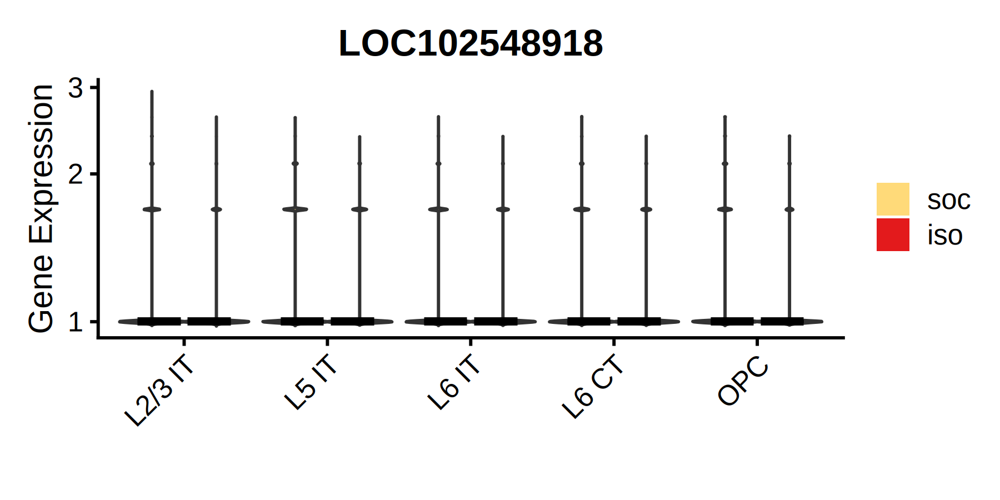

In [31]:
options(repr.plot.width = 6, repr.plot.height = 3, repr.plot.res = 300)
make_vlnplot(genes="LOC102548918",celltype=c("L2/3 IT","L5 IT","L6 CT","L6 IT","OPC"))

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


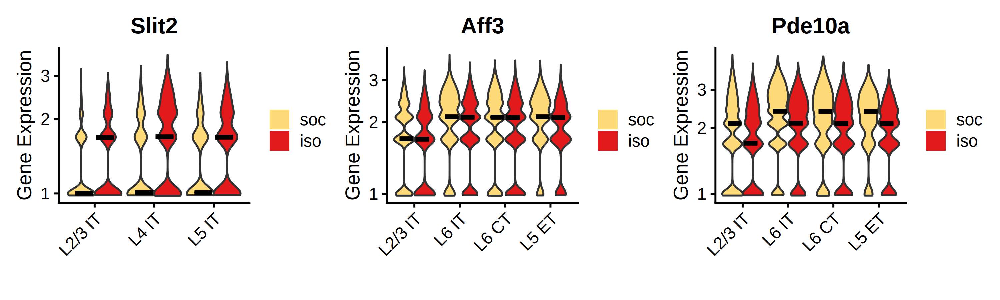

In [151]:
options(repr.plot.width = 10, repr.plot.height = 3, repr.plot.res = 300)
p1 <- make_vlnplot(genes="Slit2",celltype=c("L2/3 IT","L4 IT","L5 IT"))
p2 <- make_vlnplot(genes="Aff3",celltype=c("L2/3 IT","L6 IT","L6 CT","L5 ET"))
p3 <- make_vlnplot(genes="Pde10a",celltype=c("L2/3 IT","L6 IT","L6 CT","L5 ET"))
p1|p2|p3

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


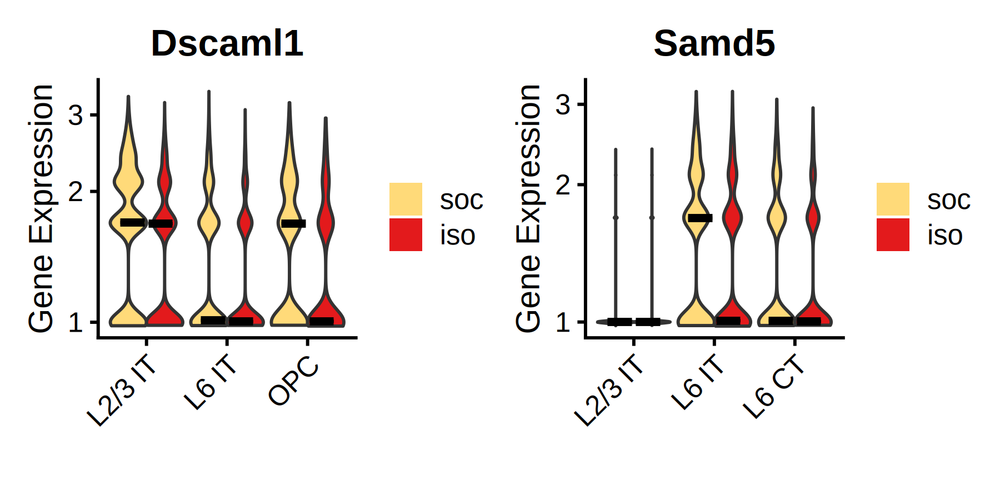

In [152]:
options(repr.plot.width = 6, repr.plot.height = 3, repr.plot.res = 300)
p1 <- make_vlnplot(genes="Dscaml1",celltype=c("L2/3 IT","L6 IT","OPC"))
p2 <- make_vlnplot(genes="Samd5",celltype=c("L2/3 IT","L6 IT","L6 CT"))
p1|p2

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


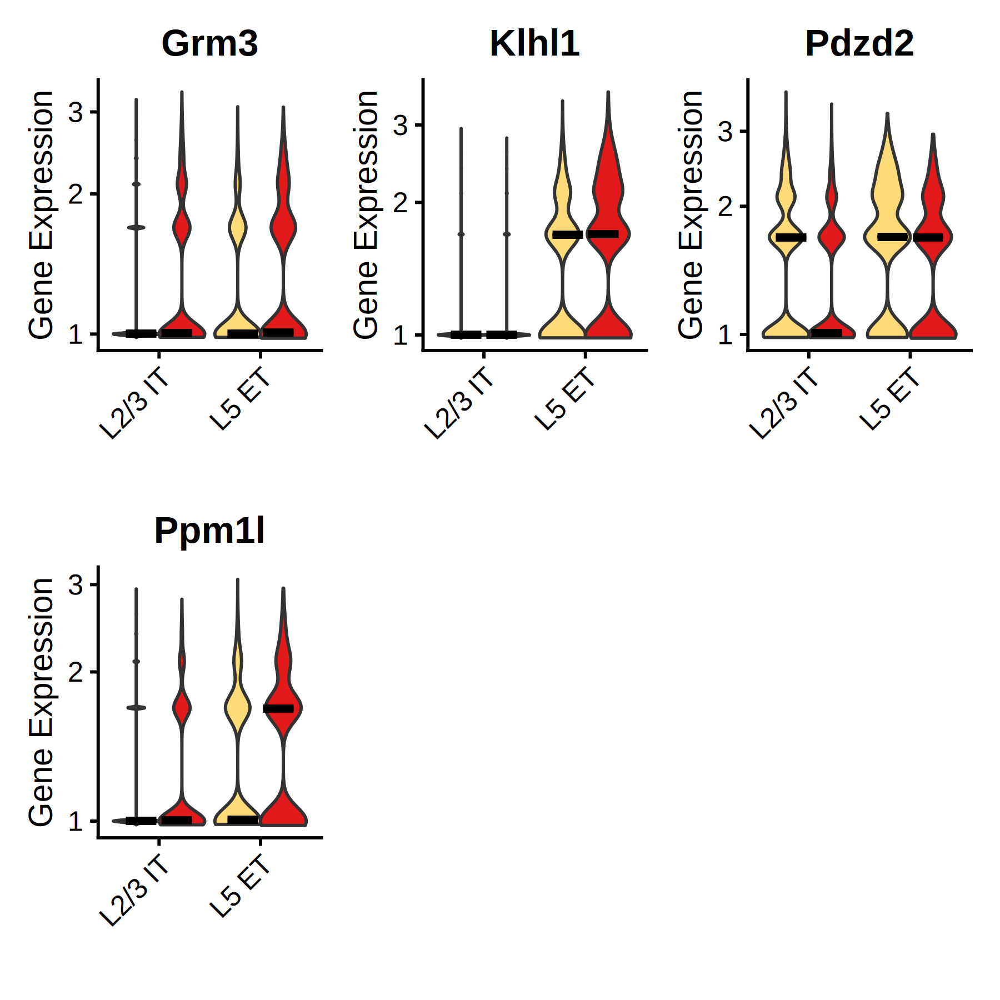

In [156]:
options(repr.plot.width = 6, repr.plot.height = 6, repr.plot.res = 300)
make_vlnplot(genes=c("Grm3","Klhl1","Pdzd2","Ppm1l"),celltype=c("L2/3 IT","L5 ET"))

## make umaps for DEGs

In [97]:
seu_obj@meta.data[1:3,]

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,nCount_SCT,nFeature_SCT,group,sex,SCT_snn_res.0.7,seurat_clusters,pANN_0.25_0.09_5707,DF.classifications_0.25_0.09_5707,sampleID,sample_name,sampleGroup,celltype,celltype_color
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<int>,<fct>,<chr>,<fct>,<fct>,<dbl>,<chr>,<chr>,<chr>,<chr>,<fct>,<chr>
iso-F-04_AAACCATAGACTATGCAATACCAGGCGCA,Rat,2892,1519,0,3229,1519,iso,F,10,10,0.3220896,Singlet,iso-F-04,iso-F_1,iso-F,Sst-Inh,#C8C8C8
iso-F-04_AAACCATAGACTATGCAATTCGGATTCGG,Rat,2971,1489,0,3287,1489,iso,F,8,8,0.2795970,Singlet,iso-F-04,iso-F_1,iso-F,L6 IT,#B832E5
iso-F-04_AAACCATAGGGTATGCTTGTCGGATTCGG,Rat,1996,1189,0,3028,1208,iso,F,10,10,0.3189136,Singlet,iso-F-04,iso-F_1,iso-F,Sst-Inh,#C8C8C8


In [105]:
my_cols = c("L2/3 IT" = "#D9F0A3",
            "L4 IT" = "#C77963",
            "L5 IT" = "#FDDCFF",
            "L6 IT" = "#B832E5",
            "L5/6 NP" = "#AD6C49",
            "L5 ET" = "#B28D9A",
            "L6 CT" = "#0094C2",
            "CGE-Inh" = "#CEFF00",
            "Sst-Inh" = "#C8C8C8",
            "Pvalb-Inh" = "#0640FF",
            "ASC" = "#00B7FF",
            "ODC" = "#0DFF00",
            "OPC" = "#81AA70",
            "STR" = "#ADBF00",
            "Endo" = "#9E7153")

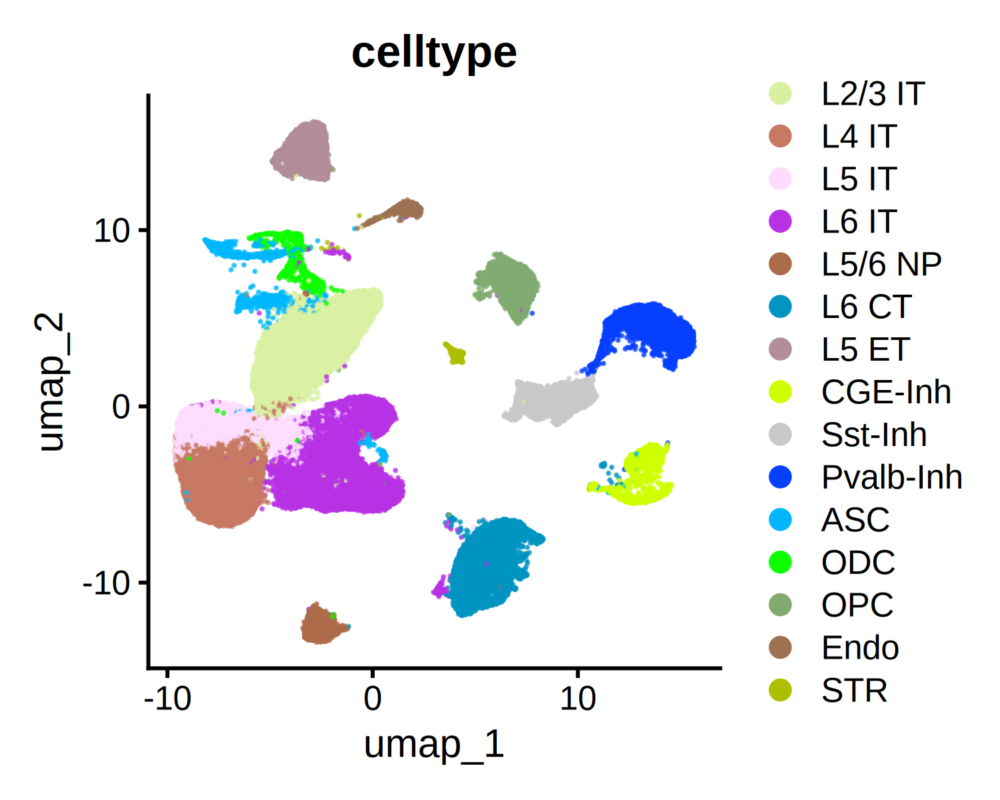

In [106]:
options(repr.plot.width = 5, repr.plot.height = 4, repr.plot.res = 300)
DimPlot(seu_obj, reduction = "umap", group.by = "celltype",alpha=0.7,cols = my_cols)

In [120]:
pdf(file = "./umap_for_overlapping_DEGs.pdf",width=10,height=5,onefile=TRUE)
for(i in seq_len(nrow(gene_for_plot))){
    p <- FeaturePlot(seu_obj, features = gene_for_plot[i,"V1"],split.by="group") + 
            theme(legend.position = c(-0.35,0.2))+
            theme(legend.text=element_text(size=10, color="black"))
    print(p)
}
dev.off()

png 
  2

## make heatmap for DEGs

In [96]:
all_up_gene <- do.call(rbind,Map(cbind, DEG_up_ls, new_clumn = names(DEG_up_ls))) %>%
  mutate(gene = str_split(row.names(.), "\\.", simplify = TRUE)[, 2]) %>%
    filter(gene != "") %>%
    pull(gene) %>%
    unique()

In [100]:
options(repr.plot.width = 7, repr.plot.height = 4, repr.plot.res = 300)
col_anno = data.frame(celltype=pseudo_seu@meta.data$celltype,
                     sex=str_split(pseudo_seu@meta.data$sample_name,"-",simplify = T)[,2],
                      group=str_split(pseudo_seu@meta.data$sample_name,"-",simplify = T)[,1],
                     row.names=row.names(pseudo_seu@meta.data))

column_ha = HeatmapAnnotation(celltype=col_anno$celltype,
                              sex=col_anno$sex,group=col_anno$group,
                             col = list(sex = c("F"="#81b29a","M"="#e07a5f"),
                                       group = c("iso"="#8da9c4","soc"="#f2cc8f"),
                                       celltype = c("L2/3 IT" = "#D9F0A3","L4 IT" = "#C77963","L5 IT" = "#FDDCFF",
                                                   "L6 IT" = "#B832E5","L5/6 NP" = "#AD6C49","L5 ET" = "#B28D9A",
                                                   "L6 CT" = "#0094C2","CGE-Inh" = "#CEFF00","Sst-Inh" = "#C8C8C8",
                                                   "Pvalb-Inh" = "#0640FF","ASC" = "#00B7FF","ODC" = "#0DFF00",
                                                    "OPC" = "#81AA70","Endo" = "#9E7153","STR" = "#ADBF00")))
lgd1 = Legend(title = "group", at = c("iso","soc"), legend_gp = gpar(fill = 1:2))
lgd2 = Legend(title = "sex", at = c("F","M"), legend_gp = gpar(fill = 3:4))

p <- Heatmap(t(scale(t(pseudo_seu@assays$RNA$data[all_up_gene,]))),
        top_annotation = column_ha,
        cluster_rows = FALSE,
        cluster_columns = FALSE,
        row_names_gp = gpar(fontsize = 6),
        column_names_gp = gpar(fontsize = 6),
        column_split = factor(col_anno$celltype,levels=unique(col_anno$celltype)),
        column_title_gp = gpar( fontsize = 5),
        name="expession",
        show_column_names = FALSE        
       )

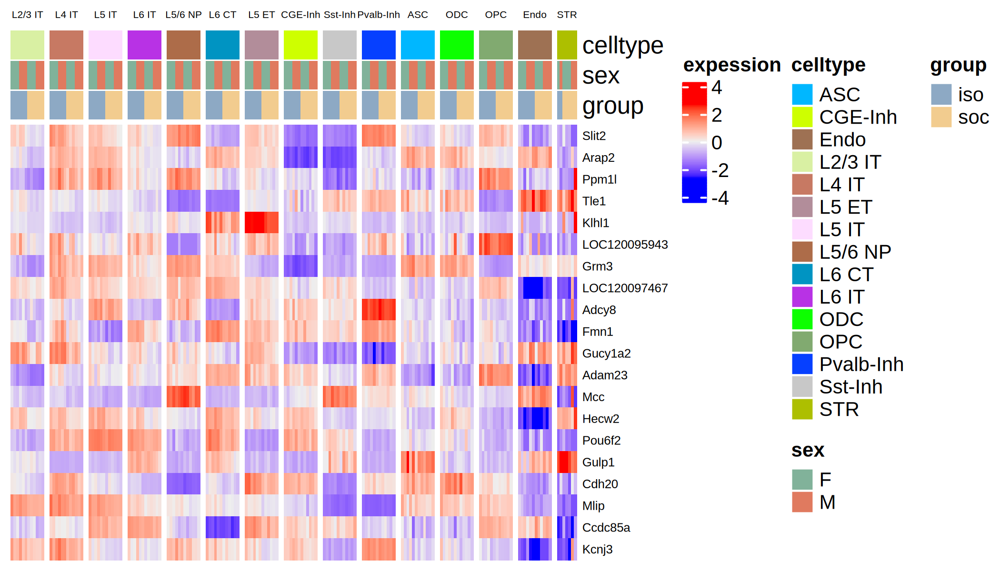

In [101]:
p

In [102]:
all_down_gene <- do.call(rbind,Map(cbind, DEG_down_ls, new_clumn = names(DEG_down_ls))) %>%
  mutate(gene = str_split(row.names(.), "\\.", simplify = TRUE)[, 2]) %>%
    filter(gene != "") %>%
    pull(gene) %>%
    unique()
options(repr.plot.width = 7, repr.plot.height = 4, repr.plot.res = 300)
col_anno = data.frame(celltype=pseudo_seu@meta.data$celltype,
                     sex=str_split(pseudo_seu@meta.data$sample_name,"-",simplify = T)[,2],
                      group=str_split(pseudo_seu@meta.data$sample_name,"-",simplify = T)[,1],
                     row.names=row.names(pseudo_seu@meta.data))

column_ha = HeatmapAnnotation(celltype=col_anno$celltype,
                              sex=col_anno$sex,group=col_anno$group,
                             col = list(sex = c("F"="#81b29a","M"="#e07a5f"),
                                       group = c("iso"="#8da9c4","soc"="#f2cc8f"),
                                       celltype = c("L2/3 IT" = "#D9F0A3","L4 IT" = "#C77963","L5 IT" = "#FDDCFF",
                                                   "L6 IT" = "#B832E5","L5/6 NP" = "#AD6C49","L5 ET" = "#B28D9A",
                                                   "L6 CT" = "#0094C2","CGE-Inh" = "#CEFF00","Sst-Inh" = "#C8C8C8",
                                                   "Pvalb-Inh" = "#0640FF","ASC" = "#00B7FF","Oligo" = "#21F4CC",
                                                   "ODC" = "#0DFF00","OPC" = "#81AA70","STR" = "#ADBF00","Endo" = "#9E7153")))
lgd1 = Legend(title = "group", at = c("iso","soc"), legend_gp = gpar(fill = 1:2))
lgd2 = Legend(title = "sex", at = c("F","M"), legend_gp = gpar(fill = 3:4))

p<- Heatmap(t(scale(t(pseudo_seu@assays$RNA$data[all_down_gene,]))),
        top_annotation = column_ha,
        cluster_rows = FALSE,
        cluster_columns = FALSE,
        row_names_gp = gpar(fontsize = 6),
        column_names_gp = gpar(fontsize = 6),
        column_split = factor(col_anno$celltype,levels=unique(col_anno$celltype)),
        column_title_gp = gpar( fontsize = 5),
        name="expession",
        show_column_names = FALSE        
       )

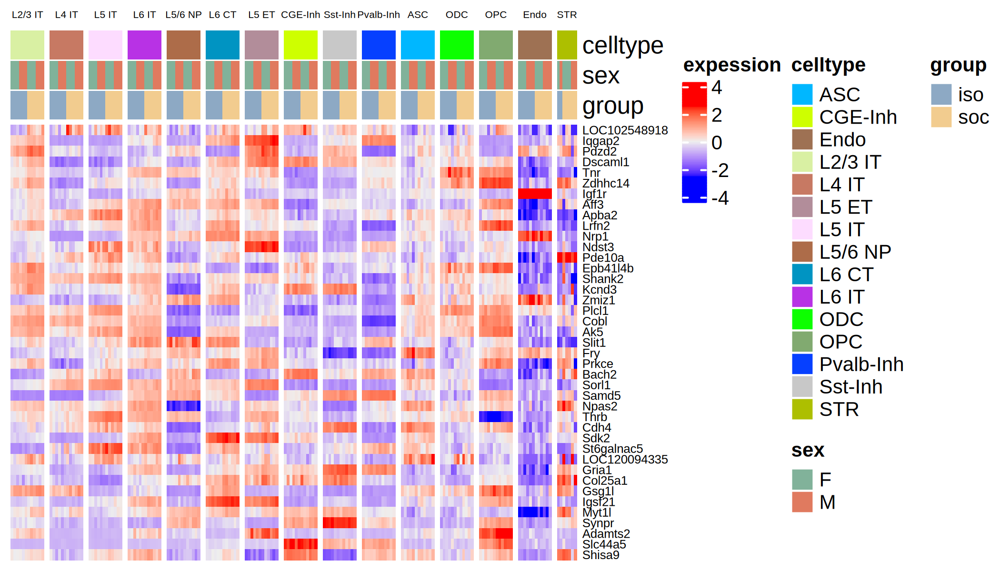

In [103]:
p

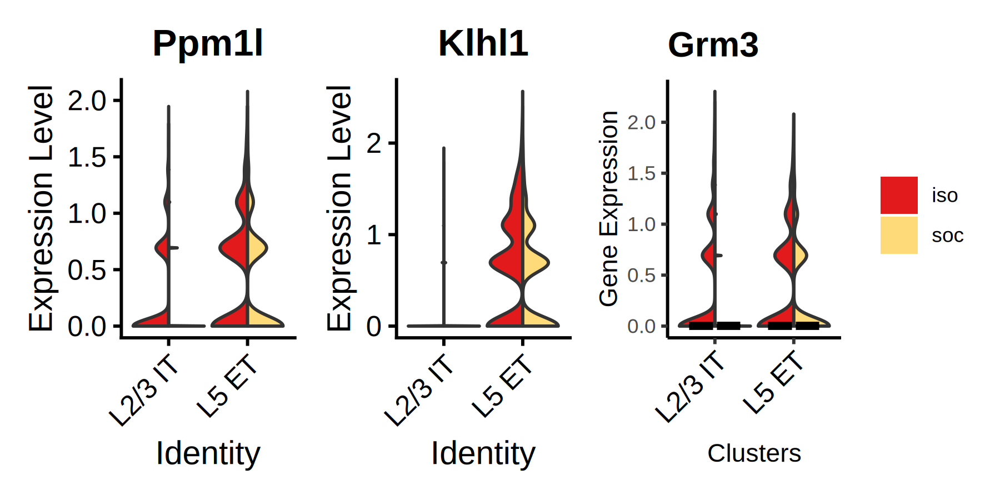

In [180]:
options(repr.plot.width = 6, repr.plot.height = 3, repr.plot.res = 300)
VlnPlot(seu_obj, 
        features = c("Ppm1l","Klhl1","Grm3"), 
        idents=c("L2/3 IT","L5 ET"),
        split.by = 'group', 
        pt.size = 0.0, 
        combine = T, 
        split.plot = T, 
        cols =c("#e31a1c", "#ffda79")) +
        theme_classic() +
        theme(legend.title = element_blank(),
             axis.text.x=element_text(size=12,color="black",angle=45,hjust=1),
             plot.title=element_text(size=15,color="black",face="bold")) +
        stat_summary(fun = median, fun.min = median, fun.max = median,
                 geom = "crossbar", 
                 width = 0.6,
                 position = position_dodge(width = .70)) +
        xlab("Clusters") + 
        ylab("Gene Expression")+
        guides(fill = guide_legend(override.aes = list(linetype = 0)),
               color = guide_legend(override.aes = list(linetype = 0)))

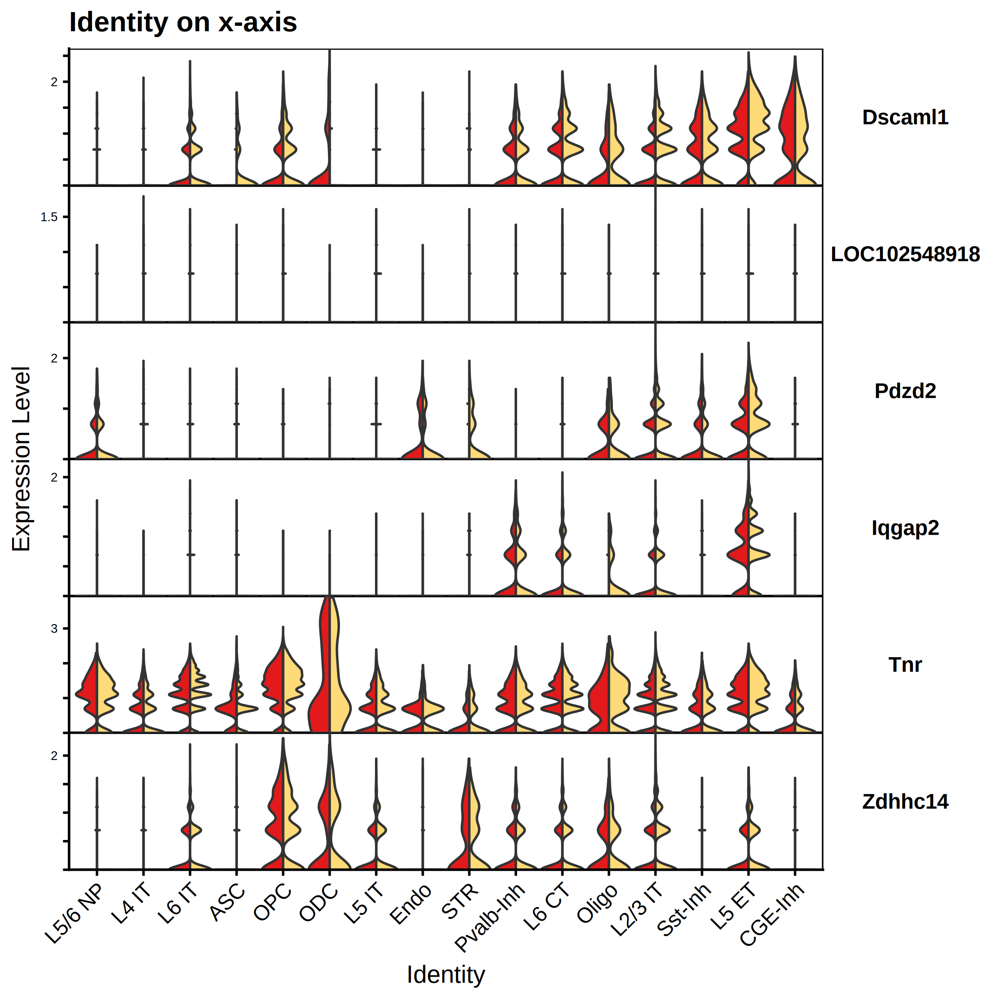

In [80]:
options(repr.plot.width = 8, repr.plot.height = 8, repr.plot.res = 300)
plot_gene <- 
do.call(rbind,Map(cbind, DEG_down_ls, new_clumn = names(DEG_down_ls))) %>%
  mutate(gene = str_split(row.names(.), "\\.", simplify = TRUE)[, 2]) %>%
    filter(gene != "") %>%
    pull(gene)

VlnPlot(seu_obj, plot_gene[1:6], 
        split.by = "group",
        pt.size = 0.0,
        split.plot = T,
        cols=c("#e31a1c", "#ffda79"),
        stack = TRUE, 
        sort = TRUE, 
        flip = TRUE) +
        theme(legend.position = "none") + ggtitle("Identity on x-axis")

## get the normalized expression matrix

In [10]:
library(DESeq2)

Loading required package: S4Vectors

Loading required package: stats4

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:dplyr’:

    combine, intersect, setdiff, union


The following object is masked from ‘package:SeuratObject’:

    intersect


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, aperm, append, as.data.frame, basename, cbind,
    colnames, dirname, do.call, duplicated, eval, evalq, Filter, Find,
    get, grep, grepl, intersect, is.unsorted, lapply, Map, mapply,
    match, mget, order, paste, pmax, pmax.int, pmin, pmin.int,
    Position, rank, rbind, Reduce, rownames, sapply, setdiff, sort,
    table, tapply, union, unique, unsplit, which.max, which.min



Attaching package: ‘S4Vectors’


The following objects are masked from ‘package:dplyr’:

    first, rename


The following object is m

In [11]:
i <- "L2/3 IT"

In [20]:
head(pseudo_de$`L2/3 IT`)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
LOC102548918,2.089267e-15,-1.3097989,1,1,5.556822e-11
Hecw2,4.087470e-13,0.1434515,1,1,1.087144e-08
Iqgap2,1.322525e-12,-0.7579870,1,1,3.517520e-08
Pdzd2,2.604076e-12,-0.8742842,1,1,6.926060e-08
Dscaml1,3.888047e-12,-0.9569493,1,1,1.034104e-07
Slit2,8.432566e-12,0.6537952,1,1,2.242810e-07


In [37]:
head(as.data.frame(pseudo_seu@assays$RNA$counts)) %>%
    write.table(file="./pseudobulk_raw_counts_.tsv",row.names=T,quote=F,sep="\t")

,iso-F-1_L2/3 IT,iso-F-1_L4 IT,iso-F-1_L5 IT,iso-F-1_L6 IT,iso-F-1_L5/6 NP,iso-F-1_L6 CT,iso-F-1_L5 ET,iso-F-1_CGE-Inh,iso-F-1_Sst-Inh,iso-F-1_Pvalb-Inh,⋯,soc-M-3_L6 CT,soc-M-3_L5 ET,soc-M-3_CGE-Inh,soc-M-3_Sst-Inh,soc-M-3_Pvalb-Inh,soc-M-3_ASC,soc-M-3_ODC,soc-M-3_OPC,soc-M-3_Endo,soc-M-3_STR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
LOC103693496,4,2,1,2,0,3,2,0,0,0,⋯,1,0,0,0,2,0,0,0,0,0
Vom2r4,2,0,0,0,0,0,0,0,0,0,⋯,2,0,0,0,0,1,0,0,0,0
LOC108352169,2,0,0,1,0,0,1,0,0,0,⋯,1,0,0,0,0,0,0,2,0,0
LOC102548633,2,1,0,2,1,1,3,0,1,3,⋯,1,1,0,1,0,0,0,1,0,0
LOC103690914,1,1,0,0,1,2,1,0,0,0,⋯,1,0,0,0,0,0,1,0,0,0
LOC102556098,1,1,3,1,0,2,2,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


In [31]:
data_subset <- 
    pseudo_seu@assays$RNA$counts %>%
    as.data.frame() %>%
    select(contains(!!i)) %>%
    filter(rowSums(.)>6)
Coldata <- data.frame(row.names=colnames(data_subset),
          group=str_split(colnames(data_subset),"-",simplify = T)[,1])

In [32]:
dds <- DESeqDataSetFromMatrix(countData = data_subset,
                              colData = Coldata,
                              design = ~ group)
dds

converting counts to integer mode

Warning message in DESeqDataSet(se, design = design, ignoreRank):
“some variables in design formula are characters, converting to factors”


class: DESeqDataSet 
dim: 22057 12 
metadata(1): version
assays(1): counts
rownames(22057): LOC103693496 LOC102548633 ... LOC102554030
  LOC120096207
rowData names(0):
colnames(12): iso-F-1_L2/3 IT iso-F-2_L2/3 IT ... soc-M-2_L2/3 IT
  soc-M-3_L2/3 IT
colData names(1): group

In [33]:
dds$group <- factor(dds$group, levels = c("soc","iso"))

In [34]:
dds <- DESeq(dds)
res <- results(dds)

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing



In [45]:
as.data.frame(res)["LOC102548918",]

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
LOC102548918,169.8239,-1.067588,0.1455557,-7.334566,2.224406e-13,7.88552e-10


In [62]:
head(assays(dds)[["mu"]])

,iso-F-1_L2/3 IT,iso-F-2_L2/3 IT,iso-F-3_L2/3 IT,iso-M-1_L2/3 IT,iso-M-2_L2/3 IT,iso-M-3_L2/3 IT,soc-F-1_L2/3 IT,soc-F-2_L2/3 IT,soc-F-3_L2/3 IT,soc-M-1_L2/3 IT,soc-M-2_L2/3 IT,soc-M-3_L2/3 IT
LOC103693496,3.982369,4.009657,1.4190339,2.1639432,1.2007743,2.0384118,2.5233606,1.4806136,1.7478022,2.7284983,4.1476562,1.7079663
LOC102548633,1.620615,1.631720,0.5774723,0.8806112,0.4886521,0.8295265,1.7135666,1.0054567,1.1868994,1.8528717,2.8165950,1.1598476
LOC103690914,1.330749,1.339868,0.4741848,0.7231039,0.4012511,0.6811563,0.4104824,0.2408557,0.2843201,0.4438528,0.6747113,0.2778398
LOC102556098,1.159973,1.167921,0.4133321,0.6303071,0.3497581,0.5937427,1.2190494,0.7152925,0.8443728,1.3181525,2.0037555,0.8251279
LOC102548076,14.706898,14.807672,5.2404959,7.9914479,4.4344624,7.5278599,9.8850748,5.8001918,6.8468829,10.6886862,16.2481300,6.6908288
LOC120098765,6.963708,7.011424,2.4813718,3.7839460,2.0997154,3.5644373,10.0859823,5.9180768,6.9860412,10.9059266,16.5783623,6.8268154


In [49]:
isoVSsoc_DEG_ls

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,new_clumn,gene,chr,start,end,strand
<dbl>,<dbl>,<int>,<int>,<dbl>,<chr>,<chr>,<chr>,<int>,<int>,<chr>
2.089267e-15,-1.3097989,1,1,5.556822e-11,L2/3 IT,LOC102548918,NC_051352.1,5669403,5682782,-
1.322525e-12,-0.7579870,1,1,3.517520e-08,L2/3 IT,Iqgap2,NC_051337.1,26894836,27170270,-
2.604076e-12,-0.8742842,1,1,6.926060e-08,L2/3 IT,Pdzd2,NC_051337.1,61384614,61770516,-
3.888047e-12,-0.9569493,1,1,1.034104e-07,L2/3 IT,Dscaml1,NC_051343.1,45740298,46057322,+
8.432566e-12,0.6537952,1,1,2.242810e-07,L2/3 IT,Slit2,NC_051349.1,62616337,62955934,-
3.552922e-11,-0.6025447,1,1,9.449705e-07,L2/3 IT,Tnr,NC_051348.1,71751714,72172731,+
4.598321e-10,0.4076989,1,1,1.223015e-05,L2/3 IT,Arap2,NC_051349.1,46717657,46917326,+
1.004825e-09,0.3378593,1,1,2.672533e-05,L2/3 IT,Ppm1l,NC_051337.1,153566653,153839434,+
1.039402e-09,-0.7681818,1,1,2.764497e-05,L2/3 IT,Zdhhc14,NC_051336.1,46069127,46340806,+


In [67]:
data.frame(expr=assays(dds)[["mu"]]["LOC102548918",],
           sample=colnames(assays(dds)[["mu"]])) %>%
    mutate(group=str_split(sample,"-",simplify = T)[,1]) %>%
    group_by(group) %>%
    summarise(avg_expr=mean(expr))

group,avg_expr
<chr>,<dbl>
iso,109.9164
soc,273.2999


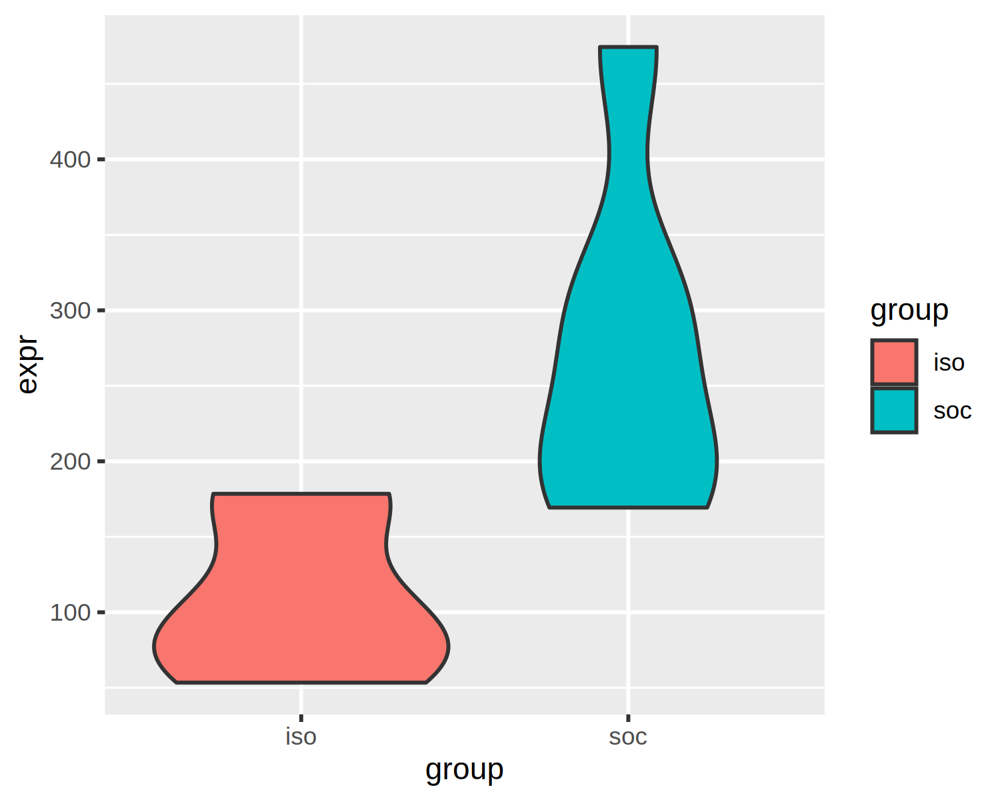

In [68]:
data.frame(expr=assays(dds)[["mu"]]["LOC102548918",],
           sample=colnames(assays(dds)[["mu"]])) %>%
    mutate(group=str_split(sample,"-",simplify = T)[,1]) %>%
    ggplot(aes(x=group,y=expr,fill=group))+
    geom_violin()

Warning message:
“The dot-dot notation (`..count..`) was deprecated in ggplot2 3.4.0.
ℹ Please use `after_stat(count)` instead.”


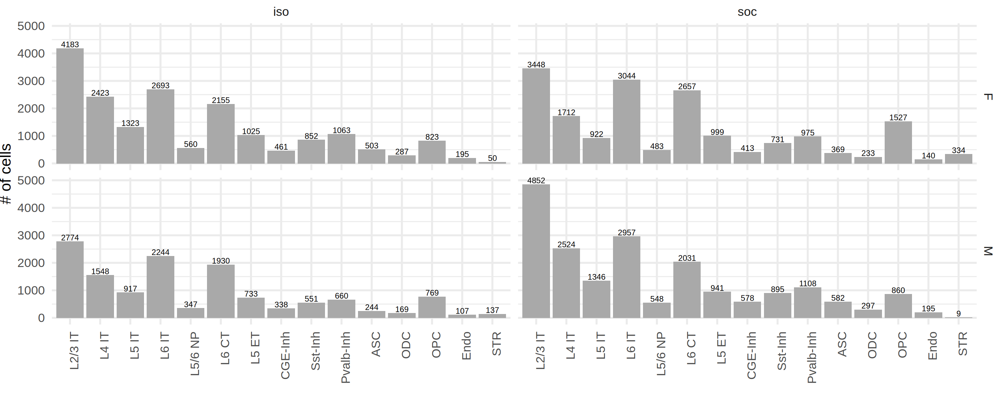

In [61]:
seu_obj@meta.data %>%
    #count(celltype) %>%
    filter(celltype!="NA") %>%
    ggplot(aes(x=celltype))+
    geom_bar(fill="darkgrey")+
    geom_text(stat='count', aes(label=..count..), vjust=-0.2,size=2)+
    #geom_text(aes(label = n), vjust = 0.5,size=2)+
    facet_grid(sex~group)+
    labs(x="",y="# of cells")+
    theme_minimal()+
    theme(axis.text.x=element_text(angle=90,hjust=1),
         plot.margin = unit(c(0,0,0,0), "cm"))

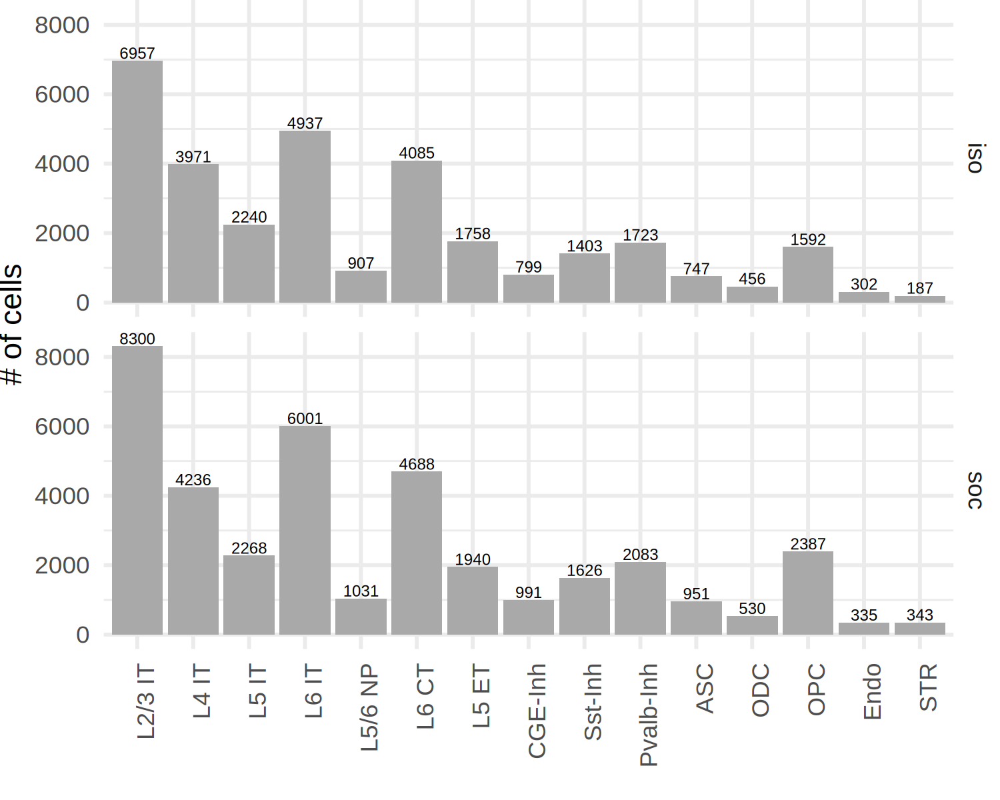

In [104]:
options(repr.plot.width = 5, repr.plot.height = 4, repr.plot.res = 300)
seu_obj@meta.data %>%
    #count(celltype) %>%
    filter(celltype!="NA") %>%
    ggplot(aes(x=celltype))+
    geom_bar(fill="darkgrey")+
    geom_text(stat='count', aes(label=..count..), vjust=-0.2,size=2)+
    #geom_text(aes(label = n), vjust = 0.5,size=2)+
    facet_grid(group~.)+
    labs(x="",y="# of cells")+
    theme_minimal()+
    theme(axis.text.x=element_text(angle=90,hjust=1),
         plot.margin = unit(c(0,0,0,0), "cm"))

## GO analysis for DEGs

In [105]:
library(stringr)
library(viridis)
library(org.Rn.eg.db)
library(clusterProfiler)
library(openxlsx)

Loading required package: viridisLite

Loading required package: AnnotationDbi

Loading required package: stats4

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:dplyr’:

    combine, intersect, setdiff, union


The following object is masked from ‘package:SeuratObject’:

    intersect


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, aperm, append, as.data.frame, basename, cbind,
    colnames, dirname, do.call, duplicated, eval, evalq, Filter, Find,
    get, grep, grepl, intersect, is.unsorted, lapply, Map, mapply,
    match, mget, order, paste, pmax, pmax.int, pmin, pmin.int,
    Position, rank, rbind, Reduce, rownames, sapply, setdiff, sort,
    table, tapply, union, unique, unsplit, which.max, which.min


Loading required package: Biobase

Welcome to Bioconductor

    Vignettes contain introducto

In [129]:
dir.create("./isoVSsoc_DEG_GO_2")

In [131]:
DEG_ls

$`L2/3 IT`
 [1] "LOC102548918" "Iqgap2"       "Pdzd2"        "Dscaml1"      "Slit2"       
 [6] "Tnr"          "Arap2"        "Ppm1l"        "Zdhhc14"      "Igf1r"       
[11] "Tle1"         "Aff3"         "Apba2"        "Lrfn2"        "Klhl1"       
[16] "Nrp1"         "Ndst3"        "Pde10a"       "Epb41l4b"     "Shank2"      
[21] "Kcnd3"        "Zmiz1"        "LOC120095943" "Plcl1"        "Cobl"        
[26] "Ak5"          "Slit1"        "Fry"          "Grm3"         "Prkce"       

$`L4 IT`
 [1] "Slit2"        "LOC120097467" "Adcy8"        "Fmn1"         "Gucy1a2"     
 [6] "Adam23"       "Bach2"        "Sorl1"        "Mcc"          "Apba2"       

$`L5 IT`
[1] "Slit2"        "Samd5"        "LOC102548918" "Hecw2"        "Npas2"       
[6] "Thrb"        

$`L6 IT`
[1] "Fmn1"         "Cdh4"         "Pde10a"       "Sdk2"         "Dscaml1"     
[6] "LOC102548918" "Samd5"        "Zmiz1"        "Aff3"        

$`L5/6 NP`
character(0)

$`L6 CT`
 [1] "Pou6f2"       "St6galnac5"   "LOC120094335" "Samd5"        "Gria1"       
 [6] "Col25a1"      "Pde10a"       "Gsg1l"        "Igsf21"       "Aff3"        
[11] "Gulp1"        "LOC102548918" "Myt1l"        "Synpr"        "Kcnd3"       

$`L5 ET`
 [1] "Aff3"    "Grm3"    "Myt1l"   "Ppm1l"   "Cdh20"   "Mlip"    "Pde10a" 
 [8] "Klhl1"   "Ccdc85a" "Kcnj3"   "Pdzd2"  

$`CGE-Inh`
[1] "Slc2a13"

$`Sst-Inh`
character(0)

$`Pvalb-Inh`
character(0)

$ASC
character(0)

$Oligo
[1] "Slit2"

$ODC
character(0)

$OPC
[1] "Adamts2"      "Slc44a5"      "Shisa9"       "Dscaml1"      "LOC102548918"

$Endo
character(0)

In [143]:
getwd()

[1] "/project/zhuzhuzhang/lyang/scaleBio_RNA_rat_brain/out_mRatBN"

In [116]:
DEG_ls <- lapply(pseudo_de, function(x){ x %>% filter(p_val_adj<0.05,abs(avg_log2FC) >0.3) %>% row.names()})
names(DEG_ls) = str_replace_all(string =names(DEG_ls) ,pattern = "\\/" ,replacement = "")
GO_ls <- list()
for(i in seq_len(length(DEG_ls))){
    if(length(DEG_ls[[i]])>5){
           go_res <- enrichGO(DEG_ls[[i]],OrgDb=org.Rn.eg.db,keyType="SYMBOL",ont="BP",pvalueCutoff  = 0.05, qvalueCutoff  = 1)
          if(!is.null(go_res@result)){
              GO_ls[names(DEG_ls)[i]] <- go_res
          }
           }
}
cp_GO_ls <- GO_ls

write.xlsx(lapply(cp_GO_ls,function(df){df@result}),file="./isoVSsoc_DEG_GO_2/isoVSsoc_DEG_FC0.3_GO.xlsx",asTable=T)


Warning message in `[<-`(`*tmp*`, names(DEG_ls)[i], value = go_res):
“implicit list embedding of S4 objects is deprecated”
Warning message in `[<-`(`*tmp*`, names(DEG_ls)[i], value = go_res):
“implicit list embedding of S4 objects is deprecated”
Warning message in `[<-`(`*tmp*`, names(DEG_ls)[i], value = go_res):
“implicit list embedding of S4 objects is deprecated”
Warning message in `[<-`(`*tmp*`, names(DEG_ls)[i], value = go_res):
“implicit list embedding of S4 objects is deprecated”
Warning message in `[<-`(`*tmp*`, names(DEG_ls)[i], value = go_res):
“implicit list embedding of S4 objects is deprecated”
Warning message in `[<-`(`*tmp*`, names(DEG_ls)[i], value = go_res):
“implicit list embedding of S4 objects is deprecated”


In [117]:
pdf("/project/zhuzhuzhang/lyang/scaleBio_RNA_rat_brain/out_mRatBN/isoVSsoc_DEG_GO_2/isoVSsoc_DEG_FC0.3_GO_dotplot.pdf",onefile=TRUE)
lapply(seq_along(GO_ls),
       function(i){
           if(!is.null(GO_ls[[i]])){
           if(dim(GO_ls[[i]]@result)[1]>0){
               if(sum(GO_ls[[i]]@result$p.adjust<0.05)>0){
                   GO_ls[[i]]@result %>%
                   filter(p.adjust<0.05) %>%
                       mutate(ratio=as.numeric(str_split(GeneRatio,"/",simplify=T)[,1])/as.numeric(str_split(GeneRatio,"/",simplify=T)[,2])) %>%
                       slice_head(n=15) %>%
                        arrange(ratio) %>%
                        mutate(Description=factor(Description,levels=Description)) %>%
                       ggplot(aes(x=ratio,y=Description))+
                       geom_point(aes(color=p.adjust,size=ratio))+
                       labs(title=paste0(names(GO_ls)[i]," ","iso vs soc ","(",length(DEG_ls[[i]]) ,")"))+
                       scale_y_discrete(labels = function(x) str_wrap(x, width = 50))+
                        scale_color_viridis(option = "D")
                   }
               
           }
            }
           }
)
dev.off()

[[1]]

[[2]]

[[3]]
NULL

[[4]]

[[5]]
NULL

[[6]]
NULL


png 
  2

## perform DEG analysis on sex

In [93]:
pseudo_seu@assays$RNA$count %>%
    as.data.frame() %>%
    filter(row.names(.)=="Uty") %>%
    select(contains("F"))

,iso-F-1_L2/3 IT,iso-F-1_L4 IT,iso-F-1_L5 IT,iso-F-1_L6 IT,iso-F-1_L5/6 NP,iso-F-1_L6 CT,iso-F-1_L5 ET,iso-F-1_CGE-Inh,iso-F-1_Sst-Inh,iso-F-1_Pvalb-Inh,⋯,soc-F-3_L6 CT,soc-F-3_L5 ET,soc-F-3_CGE-Inh,soc-F-3_Sst-Inh,soc-F-3_Pvalb-Inh,soc-F-3_ASC,soc-F-3_ODC,soc-F-3_OPC,soc-F-3_Endo,soc-F-3_STR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Uty,22,5,11,19,0,13,14,0,4,3,⋯,9,4,0,4,1,1,0,1,0,0


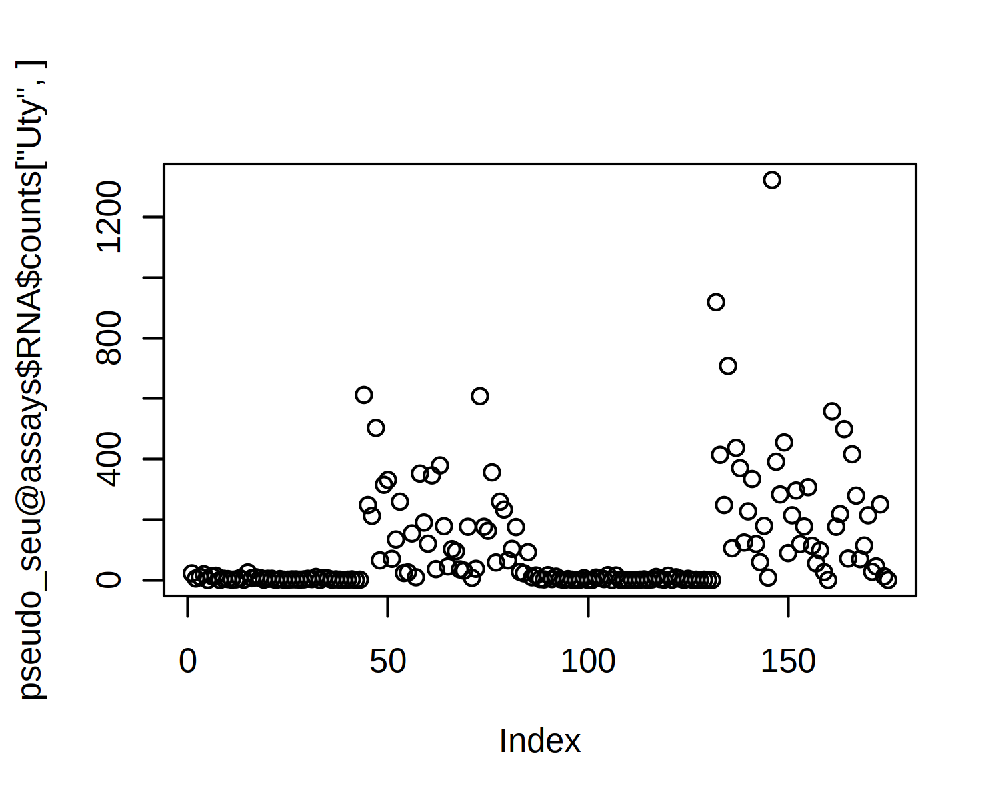

In [69]:
options(repr.plot.width = 5, repr.plot.height = 4, repr.plot.res = 300)
plot(pseudo_seu@assays$RNA$counts["Uty",])

In [76]:
head(pseudo_seu)

,orig.ident,sample_name,celltype,celltype.group
,<chr>,<chr>,<chr>,<chr>
iso-F-1_L2/3 IT,iso-F-1_L2/3 IT,iso-F-1,L2/3 IT,L2/3 IT_iso
iso-F-1_L4 IT,iso-F-1_L4 IT,iso-F-1,L4 IT,L4 IT_iso
iso-F-1_L5 IT,iso-F-1_L5 IT,iso-F-1,L5 IT,L5 IT_iso
iso-F-1_L6 IT,iso-F-1_L6 IT,iso-F-1,L6 IT,L6 IT_iso
iso-F-1_L5/6 NP,iso-F-1_L5/6 NP,iso-F-1,L5/6 NP,L5/6 NP_iso
iso-F-1_L6 CT,iso-F-1_L6 CT,iso-F-1,L6 CT,L6 CT_iso
iso-F-1_L5 ET,iso-F-1_L5 ET,iso-F-1,L5 ET,L5 ET_iso
iso-F-1_CGE-Inh,iso-F-1_CGE-Inh,iso-F-1,CGE-Inh,CGE-Inh_iso
iso-F-1_Sst-Inh,iso-F-1_Sst-Inh,iso-F-1,Sst-Inh,Sst-Inh_iso


In [121]:
pseudo_seu$sex <- stringr::str_split(pseudo_seu$sample_name,"-",simplify = T)[,2]
pseudo_seu$celltype.sex <- paste(pseudo_seu$celltype,pseudo_seu$sex,sep = "_")
pseudo_seu$group.celltype.sex <- paste(str_split(pseudo_seu$sample_name,"-",simplify = T)[,1],
                                 pseudo_seu$celltype.sex,sep = "_")


In [122]:
head(pseudo_seu)

,orig.ident,sample_name,celltype,celltype.group,sex,celltype.sex,group.celltype.sex
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
iso-F-1_L2/3 IT,iso-F-1_L2/3 IT,iso-F-1,L2/3 IT,L2/3 IT_iso,F,L2/3 IT_F,iso_L2/3 IT_F
iso-F-1_L4 IT,iso-F-1_L4 IT,iso-F-1,L4 IT,L4 IT_iso,F,L4 IT_F,iso_L4 IT_F
iso-F-1_L5 IT,iso-F-1_L5 IT,iso-F-1,L5 IT,L5 IT_iso,F,L5 IT_F,iso_L5 IT_F
iso-F-1_L6 IT,iso-F-1_L6 IT,iso-F-1,L6 IT,L6 IT_iso,F,L6 IT_F,iso_L6 IT_F
iso-F-1_L5/6 NP,iso-F-1_L5/6 NP,iso-F-1,L5/6 NP,L5/6 NP_iso,F,L5/6 NP_F,iso_L5/6 NP_F
iso-F-1_L6 CT,iso-F-1_L6 CT,iso-F-1,L6 CT,L6 CT_iso,F,L6 CT_F,iso_L6 CT_F
iso-F-1_L5 ET,iso-F-1_L5 ET,iso-F-1,L5 ET,L5 ET_iso,F,L5 ET_F,iso_L5 ET_F
iso-F-1_CGE-Inh,iso-F-1_CGE-Inh,iso-F-1,CGE-Inh,CGE-Inh_iso,F,CGE-Inh_F,iso_CGE-Inh_F
iso-F-1_Sst-Inh,iso-F-1_Sst-Inh,iso-F-1,Sst-Inh,Sst-Inh_iso,F,Sst-Inh_F,iso_Sst-Inh_F


In [123]:
Idents(pseudo_seu) <- "group.celltype.sex"
pseudo_de_sex <- list()
for(i in unique(pseudo_seu$celltype)){
    for(j in c("iso","soc")){
        bulk.de <- FindMarkers(object = pseudo_seu,
                              ident.1 = paste0(j,"_",i,"_F"),
                              ident.2 = paste0(j,"_",i,"_M"),
                               test.use = "DESeq2")
    
        pseudo_de_sex[[paste0(i,"_",j)]] <- bulk.de
    }
    
}

converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates



ERROR: Error in ValidateCellGroups(object = object, cells.1 = cells.1, cells.2 = cells.2, : Cell group 1 has fewer than 3 cells


In [67]:
names(pseudo_de_sex)

[1] "L2/3 IT_iso"   "L2/3 IT_soc"   "L4 IT_iso"     "L4 IT_soc"    
 [5] "L5 IT_iso"     "L5 IT_soc"     "L6 IT_iso"     "L6 IT_soc"    
 [9] "L5/6 NP_iso"   "L5/6 NP_soc"   "L6 CT_iso"     "L6 CT_soc"    
[13] "L5 ET_iso"     "L5 ET_soc"     "CGE-Inh_iso"   "CGE-Inh_soc"  
[17] "Sst-Inh_iso"   "Sst-Inh_soc"   "Pvalb-Inh_iso" "Pvalb-Inh_soc"
[21] "ASC_iso"       "ASC_soc"       "ODC_iso"       "ODC_soc"      
[25] "OPC_iso"       "OPC_soc"       "Endo_iso"      "Endo_soc"

In [68]:
filename = str_replace_all(string =names(pseudo_de_sex) ,pattern = "\\/" ,replacement = "")

In [69]:
## save all gene list
lapply(seq_len(length(names(pseudo_de_sex))),function(x){
            pseudo_de_sex[[x]] %>%
            write.table(,file=paste0("./FvsM_FC0.3.DEG.list_2/",filename[x],"_F_vs_M_total_gene.xls"),sep="\t",quote=F)
    }  
)

[[1]]
NULL

[[2]]
NULL

[[3]]
NULL

[[4]]
NULL

[[5]]
NULL

[[6]]
NULL

[[7]]
NULL

[[8]]
NULL

[[9]]
NULL

[[10]]
NULL

[[11]]
NULL

[[12]]
NULL

[[13]]
NULL

[[14]]
NULL

[[15]]
NULL

[[16]]
NULL

[[17]]
NULL

[[18]]
NULL

[[19]]
NULL

[[20]]
NULL

[[21]]
NULL

[[22]]
NULL

[[23]]
NULL

[[24]]
NULL

[[25]]
NULL

[[26]]
NULL

[[27]]
NULL

[[28]]
NULL

In [70]:
lapply(seq_len(length(names(pseudo_de_sex))), function(x) {
    if (sum(pseudo_de_sex[[x]]$p_val_adj < 0.05 & abs(pseudo_de_sex[[x]]$avg_log2FC) > 0.3,na.rm = TRUE) > 0) {
        filtered_data <- pseudo_de_sex[[x]] %>%
            filter(p_val_adj < 0.05, abs(avg_log2FC) > 0.3)
        
        write.table(filtered_data, 
                    file = paste0("./FvsM_FC0.3.DEG.list_2/", filename[x], "_F_vs_M_DEG.xls"), 
                    sep = "\t", 
                    quote = FALSE, 
                    row.names = TRUE)
    }
})

[[1]]
NULL

[[2]]
NULL

[[3]]
NULL

[[4]]
NULL

[[5]]
NULL

[[6]]
NULL

[[7]]
NULL

[[8]]
NULL

[[9]]
NULL

[[10]]
NULL

[[11]]
NULL

[[12]]
NULL

[[13]]
NULL

[[14]]
NULL

[[15]]
NULL

[[16]]
NULL

[[17]]
NULL

[[18]]
NULL

[[19]]
NULL

[[20]]
NULL

[[21]]
NULL

[[22]]
NULL

[[23]]
NULL

[[24]]
NULL

[[25]]
NULL

[[26]]
NULL

[[27]]
NULL

[[28]]
NULL

In [71]:
do.call(rbind,Map(cbind, pseudo_de_sex, new_clumn = names(pseudo_de_sex))) %>%
mutate(diff=case_when(p_val_adj<0.05 & avg_log2FC>0.3 ~ "up",
                     p_val_adj<0.05 & avg_log2FC< (-0.3) ~ "down",
                     .default = "nonsig")
      ) %>%
count(new_clumn,diff) %>%
mutate(plot_y=ifelse(diff=="down",(-1)*n,n)) %>%
filter(new_clumn!="NA",diff!="nonsig")

new_clumn,diff,n,plot_y
<chr>,<chr>,<int>,<dbl>
ASC_iso,down,3,-3
ASC_iso,up,1,1
ASC_soc,down,4,-4
ASC_soc,up,2,2
CGE-Inh_iso,down,3,-3
CGE-Inh_iso,up,1,1
CGE-Inh_soc,down,7,-7
CGE-Inh_soc,up,1,1
Endo_iso,up,6,6


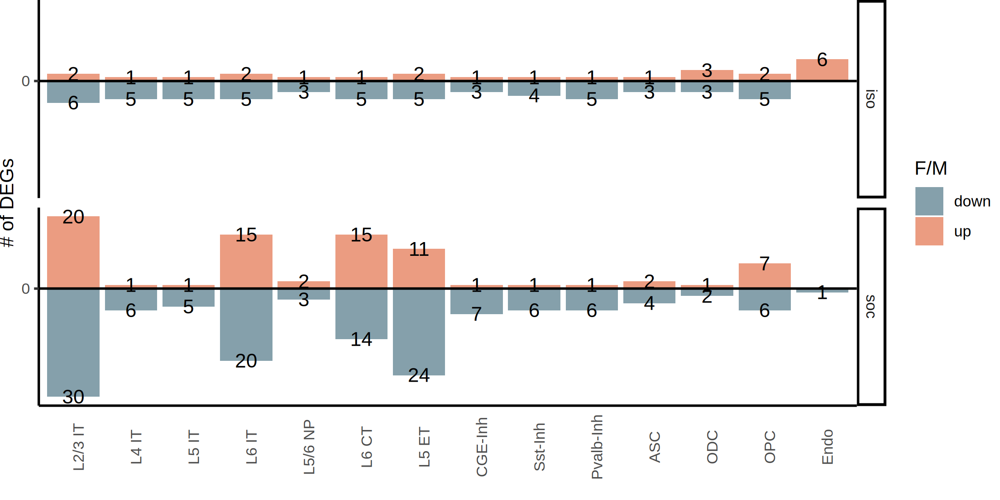

In [72]:
options(repr.plot.width = 8, repr.plot.height = 4, repr.plot.res = 300)
do.call(rbind,Map(cbind, pseudo_de_sex, new_clumn = names(pseudo_de_sex))) %>%
mutate(diff=case_when(p_val_adj<0.05 & avg_log2FC>0.3 ~ "up",
                     p_val_adj<0.05 & avg_log2FC< (-0.3) ~ "down",
                     .default = "nonsig")
      ) %>%
count(new_clumn,diff) %>%
mutate(plot_y=ifelse(diff=="down",(-1)*n,n)) %>%
filter(new_clumn!="NA",diff!="nonsig") %>%
mutate(group=str_split(new_clumn,"_",simplify = T)[,2],
      celltype=str_split(new_clumn,"_",simplify = T)[,1]) %>%
mutate(celltype=factor(celltype,levels=levels(seu_obj@meta.data$celltype))) %>%
ggplot(aes(x=celltype,y=plot_y,fill=diff))+
geom_bar(stat = "identity")+
geom_hline(yintercept = 0)+
labs(x="",y="# of DEGs",fill="F/M")+
geom_text(aes(label = abs(plot_y)), vjust = 0.5,size=4)+
facet_grid(group~.)+
scale_fill_manual(values=c("#85a0ab","#eb9c81"))+
scale_y_continuous(breaks=c(-300,-200,-100,0,100,200),labels=c(300,200,100,0,100,200))+
theme_classic()+
theme(panel.grid = element_blank(),
      axis.text.x = element_text(angle=90),
      #axis.text.x = element_blank(),
      axis.ticks.x = element_blank(),
     plot.margin = unit(c(0,0,0,0), "cm"))

In [125]:
saveRDS(pseudo_de_sex,file = "./pseudo_sex_DESeq2_DEG_2.rds")

In [1]:
pseudo_de_sex <- readRDS(file = "./pseudo_sex_DESeq2_DEG_2.rds")

In [127]:
DEG_ls<-
lapply(seq_len(length(names(pseudo_de_sex))), function(x) {
    if (sum(pseudo_de_sex[[x]]$p_val_adj < 0.05 & abs(pseudo_de_sex[[x]]$avg_log2FC) > 0.3,na.rm = TRUE) > 0) {
        pseudo_de_sex[[x]] %>%
            filter(p_val_adj < 0.05, abs(avg_log2FC) > 0.3)
    }
})
names(DEG_ls) <- names(pseudo_de_sex)
DEG_ls <- DEG_ls[!sapply(DEG_ls,is.null)]

## load gene coordinates information
gene_coord <- read.table("/project/zhuzhuzhang/lyang/references/mRatBN7.2_NCBI/gene_coordinates",header=F,stringsAsFactors = F) %>%
setNames(c("chr","start","end","strand","gene"))

do.call(rbind,Map(cbind, DEG_ls, new_clumn = names(DEG_ls))) %>%
  mutate(gene = str_split(row.names(.), "\\.", simplify = TRUE)[, 2]) %>%
    filter(gene != "") %>%
    left_join(gene_coord,by=c("gene"="gene")) %>%
    write.table("FvsM_DEG_total_list.txt",sep="\t",quote=F,row.names=F)

## plot the up-regulated genes in soc group

In [6]:
DEG_up_ls<-
lapply(seq_len(length(names(pseudo_de_sex))), function(x) {
    if (sum(pseudo_de_sex[[x]]$p_val_adj < 0.05 & pseudo_de_sex[[x]]$avg_log2FC > 0.3,na.rm = TRUE) > 0) {
        pseudo_de_sex[[x]] %>%
            filter(p_val_adj < 0.05, avg_log2FC > 0.3)
    }
})
names(DEG_up_ls) <- names(pseudo_de_sex)
DEG_up_ls <- DEG_up_ls[!sapply(DEG_up_ls,is.null)]

options(repr.plot.width = 5, repr.plot.height = 8, repr.plot.res = 300)

col_fun = colorRamp2(c(0, 1), c("white", "red"))

p<- 
do.call(rbind,Map(cbind, DEG_up_ls, new_clumn = names(DEG_up_ls))) %>%
  mutate(gene = str_split(row.names(.), "\\.", simplify = TRUE)[,2]) %>%
  mutate(celltype = str_split(new_clumn, "_", simplify = TRUE)[,1]) %>%
  mutate(group = str_split(new_clumn, "_", simplify = TRUE)[,2]) %>%
  filter(gene != "") %>%
  #mutate(celltype = factor(celltype, levels = c("L2/3 IT", "L4 IT", "L5 IT", "L5 ET", "L6 IT", "L6 CT", "CGE-Inh", "Oligo", "OPC"))) %>%
  filter(group=="soc") %>%
  select(gene, avg_log2FC, celltype) %>%
  pivot_wider(names_from = celltype, values_from = avg_log2FC) %>%
    column_to_rownames(var = "gene") %>%
    Heatmap(name = "soc F/M \navg_log2FC",cluster_rows = F,
            cluster_columns = F,rect_gp = gpar(col = "white", lwd = 1),
            row_names_gp = gpar(fontsize = 8),
            column_names_gp = gpar(fontsize = 8),
            col = col_fun
           )

Warning message:
“The input is a data frame-like object, convert it to a matrix.”


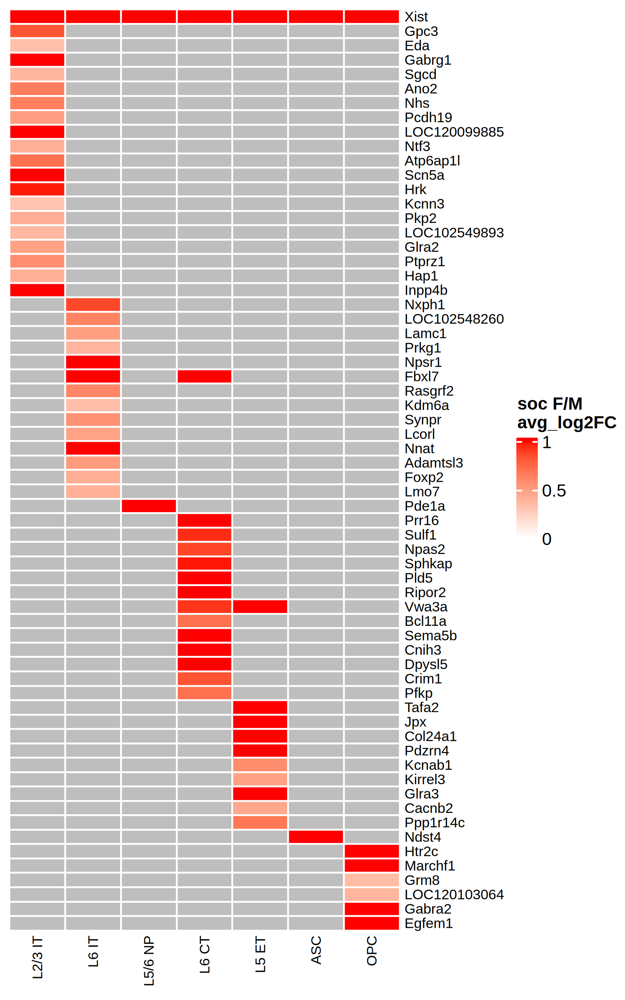

In [109]:
p

## plot the up-regulated genes in iso group

In [106]:

DEG_up_ls<-
lapply(seq_len(length(names(pseudo_de_sex))), function(x) {
    if (sum(pseudo_de_sex[[x]]$p_val_adj < 0.05 & pseudo_de_sex[[x]]$avg_log2FC > 0.3,na.rm = TRUE) > 0) {
        pseudo_de_sex[[x]] %>%
            filter(p_val_adj < 0.05, avg_log2FC > 0.3)
    }
})
names(DEG_up_ls) <- names(pseudo_de_sex)
DEG_up_ls <- DEG_up_ls[!sapply(DEG_up_ls,is.null)]

options(repr.plot.width = 3, repr.plot.height = 3, repr.plot.res = 300)

col_fun = colorRamp2(c(0, 1), c("white", "red"))

p<- 
do.call(rbind,Map(cbind, DEG_up_ls, new_clumn = names(DEG_up_ls))) %>%
  mutate(gene = str_split(row.names(.), "\\.", simplify = TRUE)[,2]) %>%
  mutate(celltype = str_split(new_clumn, "_", simplify = TRUE)[,1]) %>%
  mutate(group = str_split(new_clumn, "_", simplify = TRUE)[,2]) %>%
  filter(gene != "") %>%
  #mutate(celltype = factor(celltype, levels = c("L2/3 IT", "L4 IT", "L5 IT", "L5 ET", "L6 IT", "L6 CT", "CGE-Inh", "Oligo", "OPC"))) %>%
  filter(group=="iso") %>%
  select(gene, avg_log2FC, celltype) %>%
  pivot_wider(names_from = celltype, values_from = avg_log2FC) %>%
    column_to_rownames(var = "gene") %>%
    Heatmap(name = "iso F/M \navg_log2FC",cluster_rows = F,
            cluster_columns = F,
            rect_gp = gpar(col = "white", lwd = 1),
            row_names_gp = gpar(fontsize = 8),
            column_names_gp = gpar(fontsize = 8),
            col = col_fun
           )

Warning message:
“The input is a data frame-like object, convert it to a matrix.”


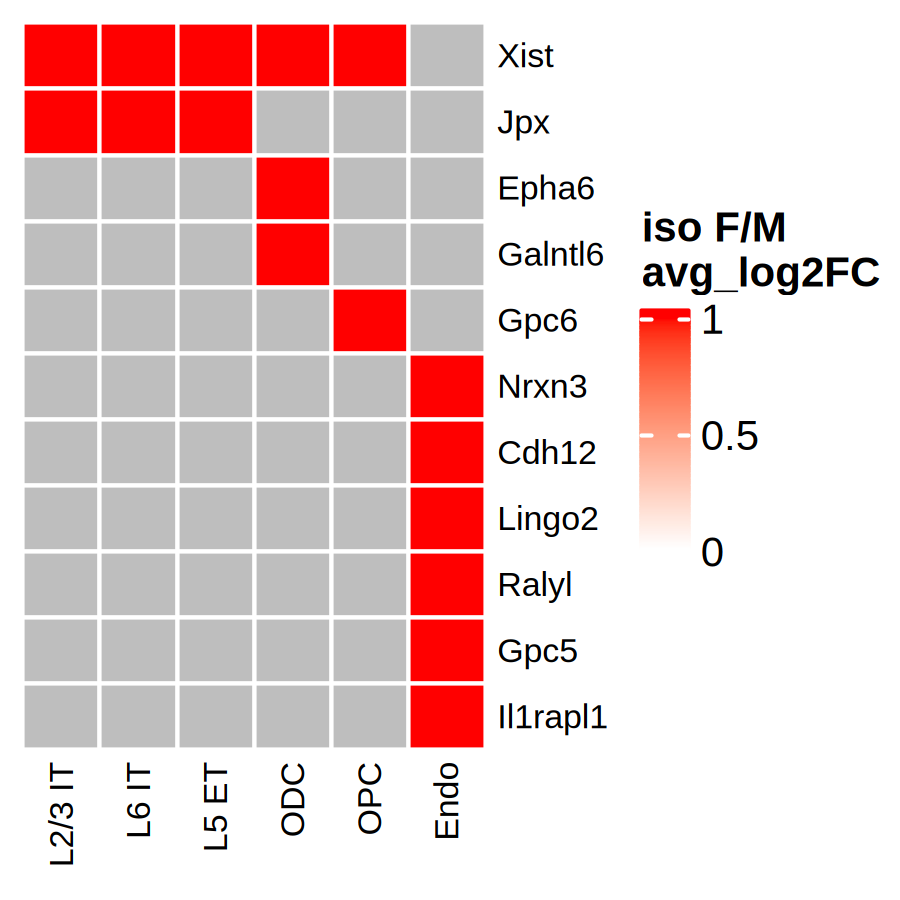

In [107]:
p

## plot the down-regulated genes in iso group

In [110]:
DEG_down_ls<-
lapply(seq_len(length(names(pseudo_de_sex))), function(x) {
    if (sum(pseudo_de_sex[[x]]$p_val_adj < 0.05 & pseudo_de_sex[[x]]$avg_log2FC < (-0.3),na.rm = TRUE) > 0) {
        pseudo_de_sex[[x]] %>%
            filter(p_val_adj < 0.05, avg_log2FC < (-0.3))
    }
})
names(DEG_down_ls) <- names(pseudo_de_sex)
DEG_down_ls <- DEG_down_ls[!sapply(DEG_down_ls,is.null)]

options(repr.plot.width = 4, repr.plot.height = 7, repr.plot.res = 300)

col_fun = colorRamp2(c(-1, 0), c("blue","white"))

p<- 
do.call(rbind,Map(cbind, DEG_down_ls, new_clumn = names(DEG_down_ls))) %>%
  mutate(gene = str_split(row.names(.), "\\.", simplify = TRUE)[,2]) %>%
  mutate(celltype = str_split(new_clumn, "_", simplify = TRUE)[,1]) %>%
  mutate(group = str_split(new_clumn, "_", simplify = TRUE)[,2]) %>%
  filter(gene != "") %>%
  #mutate(celltype = factor(celltype, levels = c("L2/3 IT", "L4 IT", "L5 IT", "L5 ET", "L6 IT", "L6 CT", "CGE-Inh", "Oligo", "OPC"))) %>%
  filter(group=="soc") %>%
  select(gene, avg_log2FC, celltype) %>%
  pivot_wider(names_from = celltype, values_from = avg_log2FC) %>%
    column_to_rownames(var = "gene") %>%
    Heatmap(name = "soc F/M \navg_log2FC",cluster_rows = F,
            cluster_columns = F,rect_gp = gpar(col = "white", lwd = 1),
            row_names_gp = gpar(fontsize = 7),
            column_names_gp = gpar(fontsize = 8),
            col = col_fun
           )

Warning message:
“The input is a data frame-like object, convert it to a matrix.”


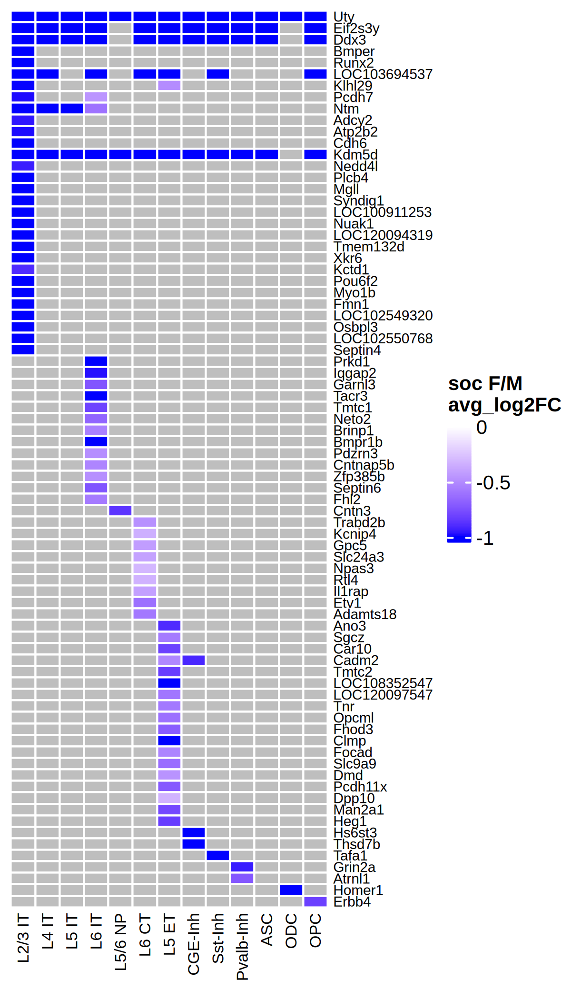

In [111]:
p

In [112]:
DEG_down_ls<-
lapply(seq_len(length(names(pseudo_de_sex))), function(x) {
    if (sum(pseudo_de_sex[[x]]$p_val_adj < 0.05 & pseudo_de_sex[[x]]$avg_log2FC < (-0.3),na.rm = TRUE) > 0) {
        pseudo_de_sex[[x]] %>%
            filter(p_val_adj < 0.05, avg_log2FC < (-0.3))
    }
})
names(DEG_down_ls) <- names(pseudo_de_sex)
DEG_down_ls <- DEG_down_ls[!sapply(DEG_down_ls,is.null)]

options(repr.plot.width = 4, repr.plot.height = 2, repr.plot.res = 300)

col_fun = colorRamp2(c(-2, 0), c("blue","white"))

p<- 
do.call(rbind,Map(cbind, DEG_down_ls, new_clumn = names(DEG_down_ls))) %>%
  mutate(gene = str_split(row.names(.), "\\.", simplify = TRUE)[,2]) %>%
  mutate(celltype = str_split(new_clumn, "_", simplify = TRUE)[,1]) %>%
  mutate(group = str_split(new_clumn, "_", simplify = TRUE)[,2]) %>%
  filter(gene != "") %>%
  #mutate(celltype = factor(celltype, levels = c("L2/3 IT", "L4 IT", "L5 IT", "L5 ET", "L6 IT", "L6 CT", "CGE-Inh", "Oligo", "OPC"))) %>%
  filter(group=="iso") %>%
  select(gene, avg_log2FC, celltype) %>%
  pivot_wider(names_from = celltype, values_from = avg_log2FC) %>%
    column_to_rownames(var = "gene") %>%
    Heatmap(name = "iso F/M \navg_log2FC",cluster_rows = F,
            cluster_columns = F,rect_gp = gpar(col = "white", lwd = 1),
            row_names_gp = gpar(fontsize = 8),
            column_names_gp = gpar(fontsize = 8),
            col = col_fun
           )

Warning message:
“The input is a data frame-like object, convert it to a matrix.”


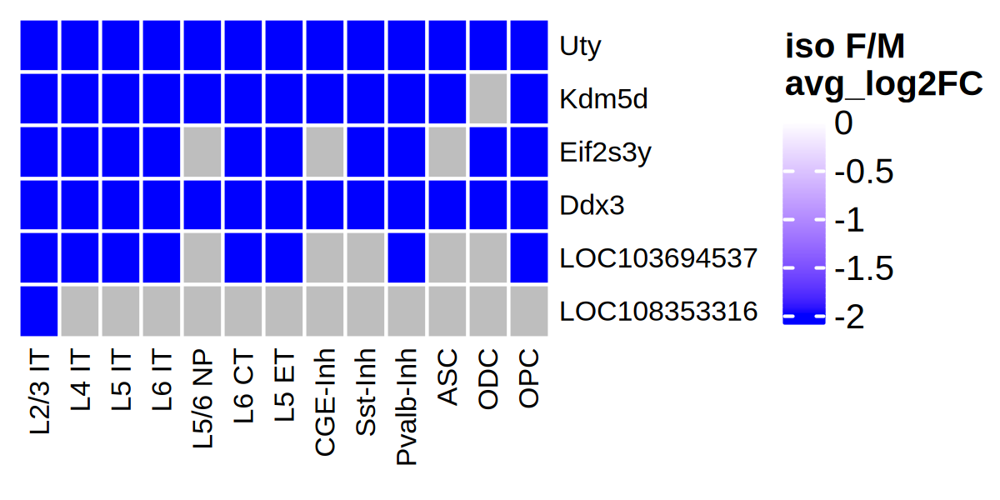

In [113]:
p

## GO analysis for sex group DEGS

In [114]:
DEG_ls <- lapply(pseudo_de_sex, function(x){ x %>% filter(p_val_adj<0.05,abs(avg_log2FC) >0.3) %>% row.names()})
names(DEG_ls) = str_replace_all(string =names(DEG_ls) ,pattern = "\\/" ,replacement = "")
GO_ls <- list()
for(i in seq_len(length(DEG_ls))){
    if(length(DEG_ls[[i]])>5){
           go_res <- enrichGO(DEG_ls[[i]],OrgDb=org.Rn.eg.db,keyType="SYMBOL",ont="BP",pvalueCutoff  = 0.05, qvalueCutoff  = 1)
          if(!is.null(go_res@result)){
              GO_ls[names(DEG_ls)[i]] <- go_res
          }
           }
}
cp_GO_ls <- GO_ls

write.xlsx(lapply(cp_GO_ls,function(df){df@result}),file="./FvsM_DEG_GO_2/FvsM_DEG_FC0.3_GO.xlsx",asTable=T)


Warning message in `[<-`(`*tmp*`, names(DEG_ls)[i], value = go_res):
“implicit list embedding of S4 objects is deprecated”
Warning message in `[<-`(`*tmp*`, names(DEG_ls)[i], value = go_res):
“implicit list embedding of S4 objects is deprecated”
Warning message in `[<-`(`*tmp*`, names(DEG_ls)[i], value = go_res):
“implicit list embedding of S4 objects is deprecated”
Warning message in `[<-`(`*tmp*`, names(DEG_ls)[i], value = go_res):
“implicit list embedding of S4 objects is deprecated”
Warning message in `[<-`(`*tmp*`, names(DEG_ls)[i], value = go_res):
“implicit list embedding of S4 objects is deprecated”
Warning message in `[<-`(`*tmp*`, names(DEG_ls)[i], value = go_res):
“implicit list embedding of S4 objects is deprecated”
Warning message in `[<-`(`*tmp*`, names(DEG_ls)[i], value = go_res):
“implicit list embedding of S4 objects is deprecated”
Warning message in `[<-`(`*tmp*`, names(DEG_ls)[i], value = go_res):
“implicit list embedding of S4 objects is deprecated”
Warning message 

In [115]:
pdf("/project/zhuzhuzhang/lyang/scaleBio_RNA_rat_brain/out_mRatBN/FvsM_DEG_GO_2/FvsM_DEG_FC0.3_GO_dotplot.pdf",onefile=TRUE)
lapply(seq_along(GO_ls),
       function(i){
           if(!is.null(GO_ls[[i]])){
           if(dim(GO_ls[[i]]@result)[1]>0){
               if(sum(GO_ls[[i]]@result$p.adjust<0.05)>0){
                   GO_ls[[i]]@result %>%
                   filter(p.adjust<0.05) %>%
                       mutate(ratio=as.numeric(str_split(GeneRatio,"/",simplify=T)[,1])/as.numeric(str_split(GeneRatio,"/",simplify=T)[,2])) %>%
                       slice_head(n=15) %>%
                        arrange(ratio) %>%
                        mutate(Description=factor(Description,levels=Description)) %>%
                       ggplot(aes(x=ratio,y=Description))+
                       geom_point(aes(color=p.adjust,size=ratio))+
                       labs(title=paste0(names(GO_ls)[i]," ","F vs M ","(",length(DEG_ls[[i]]) ,")"))+
                       scale_y_discrete(labels = function(x) str_wrap(x, width = 50))+
                        scale_color_viridis(option = "D")
                   }
               
           }
            }
           }
)
dev.off()

[[1]]

[[2]]

[[3]]
NULL

[[4]]
NULL

[[5]]
NULL

[[6]]
NULL

[[7]]

[[8]]
NULL

[[9]]
NULL

[[10]]
NULL

[[11]]

[[12]]
NULL

[[13]]
NULL

[[14]]
NULL

[[15]]
NULL

[[16]]
NULL

[[17]]
NULL

[[18]]
NULL

[[19]]
NULL

[[20]]

[[21]]


png 
  2